In [1]:
import glob
import pandas as pd
import pickle
import statsmodels.api as sm
from statsmodels.formula.api import ols
import numpy as np
import os
import matplotlib.pyplot as plt

%matplotlib inline
import numpy as np
import pandas as pd
import numpy_indexed as npi
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.stats.libqsturng import qsturng, psturng
from hypothetical.descriptive import var
from itertools import combinations

import math
from matplotlib.colors import ListedColormap

%load_ext lab_black

In [2]:
# df = pd.read_csv(samples)  # read the metadata file to know exactly which files were ran in the pipeline
# df_sample_names = df["sample_name"]
if os.path.exists("fixedcells_general_statistics.tsv"):
    df_stats = pd.read_csv("fixedcells_general_statistics.tsv", sep="\t", index_col=0)
else:
    print("does not exist!")

In [3]:
list(df_stats.columns)

['short_identifier',
 'centre',
 'technology',
 'sequencing_instrument',
 'reads',
 'cells',
 'RPC',
 'nreads',
 '%_correct_barcodes',
 'r1_length',
 'r2_length',
 'avg_insert_size',
 '%_mapq30',
 'avg_map_quality',
 'Median_total_nr_frag',
 'Median_unique_nr_frag',
 'Median_dupl_rate',
 'Median_total_nr_frag_in_regions',
 'Median_frip',
 'Median_tss_enrichment',
 'total_nr_frag_in_selected_barcodes',
 'total_nr_unique_frag_in_selected_barcodes',
 'total_nr_unique_frag_in_selected_barcodes_in_regions',
 'n_barcodes_merged',
 'frac_barcodes_merged',
 'efficiency',
 'chr1',
 'chr10',
 'chr11',
 'chr12',
 'chr13',
 'chr14',
 'chr15',
 'chr16',
 'chr17',
 'chr18',
 'chr19',
 'chr2',
 'chr20',
 'chr21',
 'chr22',
 'chr3',
 'chr4',
 'chr5',
 'chr6',
 'chr7',
 'chr8',
 'chr9',
 'chrM',
 'chrX',
 'chrY',
 'nonstandard',
 'total_fragments',
 'n_dars__B_cell',
 'top_2000_dars_median_logfc__B_cell',
 'top_2000_dars_median_fc__B_cell',
 'n_dars__CD14+_monocyte',
 'top_2000_dars_median_logfc__CD14+

In [4]:
tech_alias_dict = {
    "10xmultiome": "10x Multiome",
    "10xv1": "10x v1",
    "10xv11": "10x v1.1",
    "10xv11c": "10x v1.1 (control)",
    "10xv2": "10x v2",
    "ddseq": "Bio-Rad ddSEQ SureCell",
    "hydrop": "HyDrop",
    "mtscatac": "mtscATAC-seq",
    "mtscatacfacs": "mtscATAC-seq (FACS)",
    "s3atac": "s3-ATAC",
}

tech_alias_order = [
    "10x v1",
    "10x v1.1",
    "10x v1.1 (control)",
    "10x v2",
    "10x Multiome",
    "mtscATAC-seq",
    "mtscATAC-seq (FACS)",
    "Bio-Rad ddSEQ SureCell",
    "s3-ATAC",
    "HyDrop",
]

var_alias_dict = {
    "Log_total_nr_frag": "Total Fragments",
    "Log_unique_nr_frag": "Total Fragments",
    "Total_nr_frag": "Total Fragments",
    "Unique_nr_frag": "Unique Fragments",
    "Dupl_nr_frag": "Duplicate Fragments",
    "Dupl_rate": "% Duplicate Fragments",
    "Total_nr_frag_in_regions": "Total Fragments\nin Regions",
    "Unique_nr_frag_in_regions": "Unique Fragments\nin Regions",
    "Log_unique_nr_frag_in_regions": "Log Unique Fragments\nin Regions",
    "FRIP": "Fraction of Unique\nFragments in Peaks",
    "TSS_enrichment": "TSS Enrichment",
    "sample_id": "Sample",
    "tech": "Technology",
    "seurat_cell_type_pred_score": "Seurat Cell Type Prediction Score",
}

In [5]:
df_stats["tech_alias"] = df_stats["technology"]

In [6]:
list(df_stats.columns)

['short_identifier',
 'centre',
 'technology',
 'sequencing_instrument',
 'reads',
 'cells',
 'RPC',
 'nreads',
 '%_correct_barcodes',
 'r1_length',
 'r2_length',
 'avg_insert_size',
 '%_mapq30',
 'avg_map_quality',
 'Median_total_nr_frag',
 'Median_unique_nr_frag',
 'Median_dupl_rate',
 'Median_total_nr_frag_in_regions',
 'Median_frip',
 'Median_tss_enrichment',
 'total_nr_frag_in_selected_barcodes',
 'total_nr_unique_frag_in_selected_barcodes',
 'total_nr_unique_frag_in_selected_barcodes_in_regions',
 'n_barcodes_merged',
 'frac_barcodes_merged',
 'efficiency',
 'chr1',
 'chr10',
 'chr11',
 'chr12',
 'chr13',
 'chr14',
 'chr15',
 'chr16',
 'chr17',
 'chr18',
 'chr19',
 'chr2',
 'chr20',
 'chr21',
 'chr22',
 'chr3',
 'chr4',
 'chr5',
 'chr6',
 'chr7',
 'chr8',
 'chr9',
 'chrM',
 'chrX',
 'chrY',
 'nonstandard',
 'total_fragments',
 'n_dars__B_cell',
 'top_2000_dars_median_logfc__B_cell',
 'top_2000_dars_median_fc__B_cell',
 'n_dars__CD14+_monocyte',
 'top_2000_dars_median_logfc__CD14+

In [7]:
del_variables = [
    "centre",
    "technology",
    "sequencing_instrument",
    "reads",
    "RPC",
    "nreads",
    "total_nr_unique_frag_in_regions_in_selected_barcodes",
    "total_nr_unique_frag_in_regions_in_selected_barcodes_in_regions",
    "tech_alias",
    "n_seurat_cells__CD4+ T cell",
    "n_seurat_cells__Cytotoxic T cell",
    "n_seurat_cells__CD14+ monocyte",
    "n_seurat_cells__B cell",
    "n_seurat_cells__Natural killer cell",
    "n_seurat_cells__CD16+ monocyte",
    "n_seurat_cells__Dendritic cell",
    "n_consensus_cells__CD4+ T cell",
    "n_consensus_cells__Cytotoxic T cell",
    "n_consensus_cells__CD14+ monocyte",
    "n_consensus_cells__B cell",
    "n_consensus_cells__Natural killer cell",
    "n_consensus_cells__CD16+ monocyte",
    "n_consensus_cells__Dendritic cell",
    "sample_id",
    "top10k_peaks_strength__Bcell",
    "top10k_peaks_pvalBcell",
    "top10k_peaks_qvalBcell",
    "top10k_peaks_strength__CD14_monocyte",
    "top10k_peaks_pvalCD14_monocyte",
    "top10k_peaks_qvalCD14_monocyte",
    "top10k_peaks_strength__CD4_Tcell",
    "top10k_peaks_pvalCD4_Tcell",
    "top10k_peaks_qvalCD4_Tcell",
    "top10k_peaks_strength__CytotoxicTcell",
    "top10k_peaks_pvalCytotoxicTcell",
    "top10k_peaks_qvalCytotoxicTcell",
    "top10k_peaks_strength__Dendriticcell",
    "top10k_peaks_pvalDendriticcell",
    "top10k_peaks_qvalDendriticcell",
    "top10k_peaks_strength__Naturalkillercell",
    "top10k_peaks_pvalNaturalkillercell",
    "top10k_peaks_qvalNaturalkillercell",
    "top10k_peaks_strength__CD16_monocyte",
    "top10k_peaks_pvalCD16_monocyte",
    "top10k_peaks_qvalCD16_monocyte",
]

In [8]:
variables = sorted(list(set(list(df_stats.columns)) - set(del_variables)))

In [9]:
variables

['%_correct_barcodes',
 '%_mapq30',
 'B_cell',
 'B_cell_top20dars_recovery',
 'B_cells_bot20peaks_recovery',
 'B_cells_top20peaks_recovery',
 'CD14+_monocyte',
 'CD14+_monocyte_top20dars_recovery',
 'CD14+_monocytes_bot20peaks_recovery',
 'CD14+_monocytes_top20peaks_recovery',
 'CD16+_monocyte',
 'CD16+_monocyte_top20dars_recovery',
 'CD16+_monocytes_bot20peaks_recovery',
 'CD16+_monocytes_top20peaks_recovery',
 'CD4+_T_cell',
 'CD4+_T_cell_top20dars_recovery',
 'Cytotoxic_T_cell',
 'Cytotoxic_T_cell_top20dars_recovery',
 'Cytotoxic_T_cells_bot20peaks_recovery',
 'Cytotoxic_T_cells_top20peaks_recovery',
 'Dendritic_cell',
 'Dendritic_cell_top20dars_recovery',
 'Dendritic_cells_bot20peaks_recovery',
 'Dendritic_cells_top20peaks_recovery',
 'Duplicate fragments in cells',
 'Duplicate fragments in cells, normalized to fragments in cells',
 'Fragments in background noise barcodes',
 'Mean_Unique_nr_frag_in_regions',
 'Mean_scrublet_doublet_scores_fragments',
 'Median_Unique_nr_frag_in_regi

dictionary = {"group1": "group2", "group2": "group1"}


alpha = 0.05

for variable in variables:
    print(variable)
    df_medians_tmp = df_stats.copy()
    df_medians_tmp["tech_alias"] = df_stats["technology"]

    df_medians_tmp = df_medians_tmp[df_medians_tmp[variable].notna()]

    if pd.Index(["VIB_hydrop_12"]).isin(df_medians_tmp.index):
        df_medians_tmp = df_medians_tmp.drop(["VIB_hydrop_12"], axis=0)
    if pd.Index(["VIB_hydrop_11"]).isin(df_medians_tmp.index):
        df_medians_tmp = df_medians_tmp.drop(["VIB_hydrop_11"], axis=0)
    if pd.Index(["VIB_hydrop_21"]).isin(df_medians_tmp.index):
        df_medians_tmp = df_medians_tmp.drop(["VIB_hydrop_21"], axis=0)
    if pd.Index(["VIB_hydrop_22"]).isin(df_medians_tmp.index):
        df_medians_tmp = df_medians_tmp.drop(["VIB_hydrop_22"], axis=0)
    for tech_count in pd.DataFrame(df_medians_tmp["technology"].value_counts()).index:
        if (
            pd.DataFrame(df_medians_tmp["technology"].value_counts()).loc[tech_count][
                "technology"
            ]
            == 1
        ):
            # print(f"{tech_count}, yes")
            df_medians_tmp = df_medians_tmp[df_medians_tmp.technology != tech_count]
        k = len(np.unique(df_medians_tmp["tech_alias"]))

    tech_set = frozenset(df_medians_tmp["technology"].unique())
    sub_tech_alias_order = [x for x in tech_alias_order if x in tech_set]

    try:
        group_means = dict(
            npi.group_by(
                df_medians_tmp["tech_alias"], df_medians_tmp[variable], np.mean
            )
        )
        group_obs = dict(
            npi.group_by(df_medians_tmp["tech_alias"], df_medians_tmp[variable], len)
        )
        group_variance = dict(
            npi.group_by(df_medians_tmp["tech_alias"], df_medians_tmp[variable], var)
        )

        combs = list(combinations(np.unique(df_medians_tmp["tech_alias"]), 2))
        combs

        group_comps = []
        mean_differences = []
        degrees_freedom = []
        t_values = []
        p_values = []
        std_err = []
        up_conf = []
        low_conf = []

        for comb in combs:
            # Mean differences of each group combination
            diff = group_means[comb[1]] - group_means[comb[0]]

            # t-value of each group combination
            t_val = np.abs(diff) / np.sqrt(
                (group_variance[comb[0]] / group_obs[comb[0]])
                + (group_variance[comb[1]] / group_obs[comb[1]])
            )

            # Numerator of the Welch-Satterthwaite equation
            df_num = (
                group_variance[comb[0]] / group_obs[comb[0]]
                + group_variance[comb[1]] / group_obs[comb[1]]
            ) ** 2

            # Denominator of the Welch-Satterthwaite equation
            df_denom = (group_variance[comb[0]] / group_obs[comb[0]]) ** 2 / (
                group_obs[comb[0]] - 1
            ) + (group_variance[comb[1]] / group_obs[comb[1]]) ** 2 / (
                group_obs[comb[1]] - 1
            )

            # Degrees of freedom
            df = df_num / df_denom

            # p-value of the group comparison
            try:
                p_val = psturng(t_val * np.sqrt(2), k, df)
            except:
                p_val = 0.9

            # Standard error of each group combination
            se = np.sqrt(
                0.5
                * (
                    group_variance[comb[0]] / group_obs[comb[0]]
                    + group_variance[comb[1]] / group_obs[comb[1]]
                )
            )

            # Upper and lower confidence intervals
            upper_conf = diff + qsturng(1 - alpha, k, df)
            lower_conf = diff - qsturng(1 - alpha, k, df)

            # Append the computed values to their respective lists.
            mean_differences.append(diff)
            degrees_freedom.append(df)
            t_values.append(t_val)
            p_values.append(p_val)
            std_err.append(se)
            up_conf.append(upper_conf)
            low_conf.append(lower_conf)
            group_comps.append(str(comb[0]) + " : " + str(comb[1]))

        result_df = pd.DataFrame(
            {
                "groups": group_comps,
                "mean_difference": mean_differences,
                "std_error": std_err,
                "t_value": t_values,
                "p_value": p_values,
                "upper_limit": up_conf,
                "lower_limit": low_conf,
            }
        )

        result_df["group1"] = [x.split(" : ")[0] for x in result_df["groups"]]
        result_df["group2"] = [x.split(" : ")[1] for x in result_df["groups"]]

        result_df["p_value"] = [float(x) for x in result_df["p_value"]]
        df_mirror = result_df.copy()
        # df_mirror.rename(columns=dictionary, inplace=True)
        df_mirror["mean_difference"] = [-x for x in df_mirror["mean_difference"]]
        df_mirror["upper_limit"] = [-x for x in df_mirror["upper_limit"]]
        df_mirror["lower_limit"] = [-x for x in df_mirror["lower_limit"]]
        df_mirror.rename(columns=dictionary, inplace=True)

        df_merged = pd.concat([result_df, df_mirror])

        df_pivot = df_merged.sort_values(["group1", "group2"]).pivot(
            index="group1", columns="group2", values="p_value"
        )
        # df_pivot = df_pivot[tech_order].loc[tech_order]

        ### initiate the heatmap with means on the diagonal
        means_df = pd.DataFrame(index=group_means.keys(), columns=group_means.keys())
        for key in group_means.keys():
            means_df.at[key, key] = group_means[key]

        group_stdev_dict = {
            x: math.sqrt(group_variance[x]) for x in group_variance.keys()
        }
        means_df_annot = means_df.copy()
        for key in group_means.keys():
            if variable in number_format_dict.keys():
                width = number_format_dict[variable]
            else:
                width = ".0f"
            means_df_annot.at[key, key] = (
                "{num:{width}}".format(num=group_means[key], width=width)
                + "\nσ="
                + "{num:{width}}".format(num=group_stdev_dict[key], width=width)
            )

        fig, ax = plt.subplots(figsize=(10, 10))
        sns.heatmap(
            data=means_df.fillna(0)[sub_tech_alias_order].loc[sub_tech_alias_order],
            cmap=ListedColormap(["white"]),
            annot=means_df_annot[sub_tech_alias_order].loc[sub_tech_alias_order],
            mask=means_df.isnull(),
            ax=ax,
            square=True,
            fmt="",
            cbar=False
            # cbar_kws={"shrink": 0.5, "label": f"Mean {variable}"},
        )

        ### then add a lower triangle, showing the significance using the upper triangle matrix as mask
        baseline = 0.1
        extreme_1 = 0.05  # show with a star
        extreme_2 = 0.01  # show with a second star
        extreme_3 = 0.001  # show with a third star
        annot = [
            [
                ""
                + ("" if abs(val) > baseline else f"{val:.3f}".replace("0.", "."))
                + (
                    "" if abs(val) > extreme_1 else "\n★"
                )  # add one star if abs(val) >= extreme_1
                + (
                    "" if abs(val) > extreme_2 else "★"
                )  # add an extra star if abs(val) >= extreme_2
                + (
                    "" if abs(val) > extreme_3 else "★"
                )  # add yet an extra star if abs(val) >= extreme_3
                for val in row
            ]
            for row in df_pivot[sub_tech_alias_order]
            .loc[sub_tech_alias_order]
            .to_numpy()
        ]
        sns.heatmap(
            df_pivot[sub_tech_alias_order].loc[sub_tech_alias_order],
            cmap="viridis_r",
            annot=annot,
            fmt="",
            mask=np.triu(df_pivot),
            ax=ax,
            square=True,
            cbar_kws={"shrink": 0.5, "label": "p-val"},
        )

        #### now upper half: mean differences
        df_mirror = result_df.copy()
        df_mirror["mean_difference"] = [-x for x in df_mirror["mean_difference"]]
        df_mirror["upper_limit"] = [-x for x in df_mirror["upper_limit"]]
        df_mirror["lower_limit"] = [-x for x in df_mirror["lower_limit"]]
        df_pivot2 = df_merged.sort_values(["group1", "group2"]).pivot(
            index="group1", columns="group2", values="mean_difference"
        )
        matrix = np.tril(df_pivot2)

        sns.heatmap(
            df_pivot2[sub_tech_alias_order].loc[sub_tech_alias_order].T,
            cmap="rocket",
            fmt="+" + width,
            mask=matrix,
            annot=True,
            ax=ax,
            square=True,
            cbar_kws={"shrink": 0.5, "label": "Mean difference"},
        )
        plt.tight_layout()

        ax.set_ylabel(None)
        ax.set_xlabel(None)
        plt.xticks(rotation=45, ha="right")
        if variable in var_alias_dict.keys():
            plt.title("Pairwise comparison of " + var_alias_dict[variable])
        else:
            plt.title("Pairwise comparison of " + variable)

        plt.savefig(
            f"fixedcells_games_howell/FIXEDCELLS_{variable}__games_howell_across_techs.png",
            dpi=600,
            facecolor="white",
        )
        plt.savefig(
            f"fixedcells_games_howell/FIXEDCELLS_{variable}__games_howell_across_techs.svg",
            dpi=600,
            facecolor="white",
        )
        plt.show()
        plt.close()
    except:
        continue

# correlations

In [10]:
df_stats

,short_identifier,centre,technology,sequencing_instrument,reads,cells,RPC,nreads,%_correct_barcodes,r1_length,...,No correct barcode,Not mapped properly,Fragments in background noise barcodes,Duplicate fragments in cells,"Unique fragments in cells, not in peaks",Unique fragments in cells and in peaks,"Duplicate fragments in cells, normalized to fragments in cells","Unique fragments in cells, not in peaks, normalized to unique fragments in cells","Unique fragments in cells and in peaks, normalized to unique fragments in cells",tech_alias
BIO_ddseq_1,ddS Bi1,BioRad,Bio-Rad ddSEQ SureCell,NovaSeq,259455742.0,6359,40801.343293,259455742.0,96.540000,53.0,...,0.034600,0.091713,0.259337,0.432628,0.081855,0.099867,0.704205,0.450440,0.549560,Bio-Rad ddSEQ SureCell
BIO_ddseq_2,ddS Bi2,BioRad,Bio-Rad ddSEQ SureCell,NovaSeq,210510517.0,5159,40804.519674,210510517.0,96.760000,52.0,...,0.032400,0.076053,0.177040,0.517462,0.074550,0.122495,0.724223,0.378340,0.621660,Bio-Rad ddSEQ SureCell
BIO_ddseq_3,ddS Bi3,BioRad,Bio-Rad ddSEQ SureCell,NextSeq 500/550,114310431.0,2801,40810.578722,114310431.0,87.470000,53.0,...,0.125300,0.111874,0.256717,0.337885,0.062506,0.105718,0.667613,0.371563,0.628437,Bio-Rad ddSEQ SureCell
BIO_ddseq_4,ddS Bi4,BioRad,Bio-Rad ddSEQ SureCell,NextSeq 500/550,108112191.0,2649,40812.454134,108112191.0,88.100000,54.0,...,0.119000,0.112327,0.246076,0.336470,0.068929,0.117198,0.643843,0.370333,0.629667,Bio-Rad ddSEQ SureCell
BRO_mtscatacfacs_1,mt* Br1,Broad,mtscATAC-seq (FACS),NextSeq 500/550,145886207.0,3575,40807.330629,145886207.0,94.660000,72.0,...,0.053400,0.117852,0.059414,0.340438,0.218925,0.209971,0.442510,0.510438,0.489562,mtscATAC-seq (FACS)
BRO_mtscatacfacs_2,mt* Br2,Broad,mtscATAC-seq (FACS),NextSeq 500/550,138669154.0,3398,40809.050618,138669154.0,94.790000,72.0,...,0.052100,0.116971,0.054692,0.352846,0.218735,0.204656,0.454560,0.516627,0.483373,mtscATAC-seq (FACS)
CNA_10xmultiome_1,MO C1,CNAG,10x Multiome,NovaSeq 6000,144290077.0,3536,40806.017251,144290077.0,98.310000,50.0,...,0.016900,0.101751,0.366111,0.237926,0.114160,0.163153,0.461778,0.411665,0.588335,10x Multiome
CNA_10xmultiome_2,MO C2,CNAG,10x Multiome,NovaSeq 6000,127397732.0,3122,40806.448430,127397732.0,98.400000,50.0,...,0.016000,0.104698,0.461293,0.122049,0.140102,0.155858,0.291976,0.473382,0.526618,10x Multiome
CNA_10xv11_1,v1.1 C1,CNAG,10x v1.1,NovaSeq 6000,111532272.0,2733,40809.466520,111532272.0,98.190000,50.0,...,0.018100,0.097895,0.474439,0.197397,0.080912,0.131257,0.481966,0.381358,0.618642,10x v1.1
CNA_10xv11_2,v1.1 C2,CNAG,10x v1.1,NovaSeq 6000,113657151.0,2785,40810.467145,113657151.0,98.170000,50.0,...,0.018300,0.097188,0.443402,0.222294,0.078974,0.139842,0.503942,0.360916,0.639084,10x v1.1


In [11]:
sample_id_short_alias_dict = {
    "BIO_ddseq_1.FIXEDCELLS": "ddSEQ Bi1",
    "BIO_ddseq_2.FIXEDCELLS": "ddSEQ Bi2",
    "BIO_ddseq_3.FIXEDCELLS": "ddSEQ Bi3",
    "BIO_ddseq_4.FIXEDCELLS": "ddSEQ Bi4",
    "BRO_mtscatacfacs_1.FIXEDCELLS": "mtscATAC* Br1",
    "BRO_mtscatacfacs_2.FIXEDCELLS": "mtscATAC* Br2",
    "CNA_10xmultiome_1.FIXEDCELLS": "MO C1",
    "CNA_10xmultiome_2.FIXEDCELLS": "MO C2",
    "CNA_10xv11_1.FIXEDCELLS": "v1.1 C1",
    "CNA_10xv11_2.FIXEDCELLS": "v1.1 C2",
    "CNA_10xv11_3.FIXEDCELLS": "v1.1 C3",
    "CNA_10xv11c_1.FIXEDCELLS": "v1.1c C1",
    "CNA_10xv11c_2.FIXEDCELLS": "v1.1c C2",
    "CNA_10xv2_1.FIXEDCELLS": "v2 C1",
    "CNA_10xv2_2.FIXEDCELLS": "v2 C2",
    "CNA_hydrop_1.FIXEDCELLS": "HyDrop C1",
    "CNA_hydrop_2.FIXEDCELLS": "HyDrop C2",
    "CNA_hydrop_3.FIXEDCELLS": "HyDrop C3",
    "CNA_mtscatac_1.FIXEDCELLS": "mtscATAC C1",
    "CNA_mtscatac_2.FIXEDCELLS": "mtscATAC C2",
    "EPF_hydrop_1.FIXEDCELLS": "HyDrop E1",
    "EPF_hydrop_2.FIXEDCELLS": "HyDrop E2",
    "EPF_hydrop_3.FIXEDCELLS": "HyDrop E3",
    "EPF_hydrop_4.FIXEDCELLS": "HyDrop E4",
    "HAR_ddseq_1.FIXEDCELLS": "ddSEQ H1",
    "HAR_ddseq_2.FIXEDCELLS": "ddSEQ H2",
    "MDC_mtscatac_1.FIXEDCELLS": "mtscATAC M1",
    "MDC_mtscatac_2.FIXEDCELLS": "mtscATAC M2",
    "OHS_s3atac_1.FIXEDCELLS": "s3 O1",
    "OHS_s3atac_2.FIXEDCELLS": "s3 O2",
    "SAN_10xmultiome_1.FIXEDCELLS": "MO Sa1",
    "SAN_10xmultiome_2.FIXEDCELLS": "MO Sa2",
    "STA_10xv11_1.FIXEDCELLS": "v1.1 St1",
    "STA_10xv11_2.FIXEDCELLS": "v1.1 St2",
    "TXG_10xv11_1.FIXEDCELLS": "v1.1 T1",
    "TXG_10xv2_1.FIXEDCELLS": "v2 T1",
    "TXG_10xv2_2.FIXEDCELLS": "v2 T2",
    "UCS_ddseq_1.FIXEDCELLS": "ddSEQ U1",
    "UCS_ddseq_2.FIXEDCELLS": "ddSEQ U2",
    "VIB_10xmultiome_1.FIXEDCELLS": "MO V1",
    "VIB_10xmultiome_2.FIXEDCELLS": "MO V2",
    "VIB_10xv1_1.FIXEDCELLS": "v1 V1",
    "VIB_10xv1_2.FIXEDCELLS": "v1 V2",
    "VIB_10xv2_1.FIXEDCELLS": "v2 V1",
    "VIB_10xv2_2.FIXEDCELLS": "v2 V2",
    "VIB_hydrop_1.FIXEDCELLS": "HyDrop V1",
    "VIB_hydrop_2.FIXEDCELLS": "HyDrop V2",
    "VIB_hydrop_11.FIXEDCELLS": "HyDrop V1",
    "VIB_hydrop_12.FIXEDCELLS": "HyDrop V1",
    "VIB_hydrop_21.FIXEDCELLS": "HyDrop V2",
    "VIB_hydrop_22.FIXEDCELLS": "HyDrop V2",
}

sample_id_ultrashort_alias_dict = {
    "BIO_ddseq_1.FIXEDCELLS": "ddS Bi1",
    "BIO_ddseq_2.FIXEDCELLS": "ddS Bi2",
    "BIO_ddseq_3.FIXEDCELLS": "ddS Bi3",
    "BIO_ddseq_4.FIXEDCELLS": "ddS Bi4",
    "BRO_mtscatacfacs_1.FIXEDCELLS": "mt* Br1",
    "BRO_mtscatacfacs_2.FIXEDCELLS": "mt* Br2",
    "CNA_10xmultiome_1.FIXEDCELLS": "MO C1",
    "CNA_10xmultiome_2.FIXEDCELLS": "MO C2",
    "CNA_10xv11_1.FIXEDCELLS": "v1.1 C1",
    "CNA_10xv11_2.FIXEDCELLS": "v1.1 C2",
    "CNA_10xv11_3.FIXEDCELLS": "v1.1 C3",
    "CNA_10xv11c_1.FIXEDCELLS": "v1.1c C1",
    "CNA_10xv11c_2.FIXEDCELLS": "v1.1c C2",
    "CNA_10xv2_1.FIXEDCELLS": "v2 C1",
    "CNA_10xv2_2.FIXEDCELLS": "v2 C2",
    "CNA_hydrop_1.FIXEDCELLS": "Hy C1",
    "CNA_hydrop_2.FIXEDCELLS": "Hy C2",
    "CNA_hydrop_3.FIXEDCELLS": "Hy C3",
    "CNA_mtscatac_1.FIXEDCELLS": "mt C1",
    "CNA_mtscatac_2.FIXEDCELLS": "mt C2",
    "EPF_hydrop_1.FIXEDCELLS": "Hy E1",
    "EPF_hydrop_2.FIXEDCELLS": "Hy E2",
    "EPF_hydrop_3.FIXEDCELLS": "Hy E3",
    "EPF_hydrop_4.FIXEDCELLS": "Hy E4",
    "HAR_ddseq_1.FIXEDCELLS": "ddS H1",
    "HAR_ddseq_2.FIXEDCELLS": "ddS H2",
    "MDC_mtscatac_1.FIXEDCELLS": "mt M1",
    "MDC_mtscatac_2.FIXEDCELLS": "mt M2",
    "OHS_s3atac_1.FIXEDCELLS": "s3 O1",
    "OHS_s3atac_2.FIXEDCELLS": "s3 O2",
    "SAN_10xmultiome_1.FIXEDCELLS": "MO Sa1",
    "SAN_10xmultiome_2.FIXEDCELLS": "MO Sa2",
    "STA_10xv11_1.FIXEDCELLS": "v1.1 St1",
    "STA_10xv11_2.FIXEDCELLS": "v1.1 St2",
    "TXG_10xv11_1.FIXEDCELLS": "v1.1 T1",
    "TXG_10xv2_1.FIXEDCELLS": "v2 T1",
    "TXG_10xv2_2.FIXEDCELLS": "v2 T2",
    "UCS_ddseq_1.FIXEDCELLS": "ddS U1",
    "UCS_ddseq_2.FIXEDCELLS": "ddS U2",
    "VIB_10xmultiome_1.FIXEDCELLS": "MO V1",
    "VIB_10xmultiome_2.FIXEDCELLS": "MO V2",
    "VIB_10xv1_1.FIXEDCELLS": "v1 V1",
    "VIB_10xv1_2.FIXEDCELLS": "v1 V2",
    "VIB_10xv2_1.FIXEDCELLS": "v2 V1",
    "VIB_10xv2_2.FIXEDCELLS": "v2 V2",
    "VIB_hydrop_1.FIXEDCELLS": "Hy V1",
    "VIB_hydrop_2.FIXEDCELLS": "Hy V2",
    "VIB_hydrop_11.FIXEDCELLS": "Hy V1",
    "VIB_hydrop_12.FIXEDCELLS": "Hy V1",
    "VIB_hydrop_21.FIXEDCELLS": "Hy V2",
    "VIB_hydrop_22.FIXEDCELLS": "Hy V2",
}

tech_color_palette = {
    "10xv2": "#1b9e77",
    "10xv1": "#d95f02",
    "10xv11": "#7570b3",
    "10xv11c": "#7570b3",
    "10xmultiome": "#e7298a",
    "mtscatac": "#66a61e",
    "mtscatacfacs": "#66a61e",
    "ddseq": "#e6ab02",
    "s3atac": "#a6761d",
    "hydrop": "#666666",
}

sample_id_short_alias_palette = {
    sample_id_short_alias_dict[x]: tech_color_palette[x.split("_")[1]]
    for x in sorted(sample_id_short_alias_dict.keys())
}

sample_id_color_palette = {
    x + ".FIXEDCELLS": tech_color_palette[x.split("_")[1]] for x in df_stats.index
}

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt
from adjustText import adjust_text

In [13]:
def plot_metadata(
    df,
    ax,
    x_var="tSNE_1",
    y_var="tSNE_2",
    color_var=None,
    x_axis_scale="linear",
    y_axis_scale="linear",
    s=1,
    remove_legend=False,
    palette=None,
    figsize=(10, 10),
    xlabel=None,
    ylabel=None,
):
    # initialize ax
    fig, ax = plt.subplots(figsize=figsize)

    # actually plot
    sns.scatterplot(
        data=df, x=x_var, y=y_var, s=s, ax=ax, hue=color_var, palette=palette
    )
    if remove_legend == True:
        ax.get_legend().remove()

    if xlabel != None:
        ax.set_xlabel(xlabel, fontsize=16, fontweight="bold")

    if ylabel != None:
        ax.set_ylabel(ylabel, fontsize=16, fontweight="bold")

    plt.rcParams["font.weight"] = "bold"
    ax.tick_params(axis="both", which="major", labelsize=14)
    ax.tick_params(axis="both", which="minor", labelsize=14)
    # finetune plot
    ax.set_xscale(x_axis_scale)
    ax.set_yscale(y_axis_scale)

In [14]:
df = df_stats.copy()


x_var = "Unique_nr_frag_in_regions"
x_axis_scale = "log"
y_var = "seurat_cell_type_pred_score"
y_axis_scale = "linear"
color_var = "sample_id_short_alias"

In [15]:
x_vars_dict = {
    "Median_Unique_nr_frag_in_regions": "log",
    "Median_frip": "linear",
    "Median_tss_enrichment": "linear",
    "avg_insert_size": "linear",
    "cells": "linear",
    "total_fragments": "log",
}

In [16]:
y_vars_dict = {
    "%_correct_barcodes": "linear",
    "%_mapq30": "linear",
    "avg_map_quality": "linear",
    "Median_total_nr_frag": "log",
    "Median_unique_nr_frag": "log",
    "Median_dupl_rate": "linear",
    "Median_total_nr_frag_in_regions": "log",
    "Median_frip": "linear",
    "Median_tss_enrichment": "linear",
    "total_nr_unique_frag_in_selected_barcodes": "log",
    "total_nr_unique_frag_in_selected_barcodes_in_regions": "log",
    "efficiency": "linear",
    "chrM": "linear",
    "chrX": "linear",
    "chrY": "linear",
    "nonstandard": "linear",
    "total_fragments": "log",
    "n_dars__B_cell": "linear",
    "n_dars__CD14+_monocyte": "linear",
    "n_dars__CD4+_T_cell": "linear",
    "n_dars__Cytotoxic_T_cell": "linear",
    "n_dars__Dendritic_cell": "linear",
    "n_dars__Natural_killer_cell": "linear",
    "n_dars__CD16+_monocyte": "linear",
    "n_peaks__Bcell": "linear",
    "n_peaks__CD14_monocyte": "linear",
    "n_peaks__CD4_Tcell": "linear",
    "n_peaks__CytotoxicTcell": "linear",
    "n_peaks__Dendriticcell": "linear",
    "n_peaks__Naturalkillercell": "linear",
    "n_peaks__CD16_monocyte": "linear",
    "Dendritic_cell Top 20% DARs Recovered": "linear",
    "Natural_killer_cell Top 20% DARs Recovered": "linear",
    "CD14+_monocyte Top 20% DARs Recovered": "linear",
    "CD16+_monocyte Top 20% DARs Recovered": "linear",
    "Dendritic_cell Bottom 20% DARs Recovered": "linear",
    "Natural_killer_cell Bottom 20% DARs Recovered": "linear",
    "CD14+_monocyte Bottom 20% DARs Recovered": "linear",
    "CD16+_monocyte Bottom 20% DARs Recovered": "linear",
    "Top 20% Peaks Recovered": "linear",
    "Bottom 20% Peaks Recovered": "linear",
    "Median_Unique_nr_frag_in_regions": "log",
    "Median_scrublet_oublet_scores_fragments": "linear",
    "total_nr_frag_in_selected_barcodes": "log",
    "No correct barcode": "linear",
    "Not mapped properly": "linear",
    "Fragments in background noise barcodes": "linear",
    "Duplicate fragments in cells": "linear",
    "Unique fragments in cells, not in peaks": "linear",
    "Unique fragments in cells and in peaks": "linear",
}

In [17]:
if not ".FIXEDCELLS" in df_stats.index[0]:
    df_stats.index = [x + ".FIXEDCELLS" for x in df_stats.index]

In [18]:
df_stats["sample_id"] = df_stats.index

df = df_stats.copy()
save = True
remove_legend = True
overwrite = True
adjusttext = False

for y_var, y_axis_scale in y_vars_dict.items():
    if (
        not os.path.exists(f"plts_general/all_{y_var}_by_{color_var}.png")
        or overwrite == True
    ):
        fig, axes = plt.subplots(
            1,
            len(x_vars_dict.keys()),
            figsize=(len(x_vars_dict.keys()) * 7, 1 * 7),
            sharey=True,
        )

        for x_var, x_axis_scale in x_vars_dict.items():
            x_var_index = list(x_vars_dict.keys()).index(x_var)

            # initialize ax
            # actually plot
            sns.scatterplot(
                data=df,
                x=x_var,
                y=y_var,
                s=50,
                ax=axes[x_var_index],
                hue="sample_id",
                palette=sample_id_color_palette,
            )
            if remove_legend == True:
                axes[x_var_index].get_legend().remove()

            if x_var != None:
                axes[x_var_index].set_xlabel(x_var, fontsize=16)#, fontweight="bold")

            if y_var != None:
                axes[x_var_index].set_ylabel(y_var, fontsize=16)#, fontweight="bold")

            # plt.rcParams["font.weight"] = "bold"
            axes[x_var_index].tick_params(axis="both", which="major", labelsize=12)
            axes[x_var_index].tick_params(axis="both", which="minor", labelsize=12)

            # finetune plot
            axes[x_var_index].set_xscale(x_axis_scale)
            axes[x_var_index].set_yscale(y_axis_scale)

            texts = [
                axes[x_var_index].text(
                    df[x_var].loc[sample],
                    df[y_var].loc[sample],
                    f"{sample_id_ultrashort_alias_dict[sample]}",
                    ha="center",
                    va="center",
                    color="black",
                )
                for sample in df["sample_id"]
            ]

            if adjusttext == True:
                adjust_text(texts, arrowprops=dict(arrowstyle="-", color="red"))

        print(f"{y_var} done")
        fig

        if save == True:

            plt.savefig(
                f"plts_general/all_{y_var}_by_{color_var}.png",
                dpi=600,
                facecolor="white",
            )
            plt.savefig(
                f"plts_general/all_{y_var}_by_{color_var}.svg",
                dpi=600,
                facecolor="white",
            )

        plt.close()
    else:
        print(f"plts_general/all_{y_var}_by_{color_var}.png exists!")

# games-howell

In [19]:
from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [20]:
variables_todivide = [
    "Median_Unique_nr_frag_in_regions",
    "Median_total_nr_frag",
    "Median_total_nr_frag_in_regions",
    "Median_unique_nr_frag",
    "n_dars__B_cell",
    "n_dars__CD14+_monocyte",
    "n_dars__CD16+_monocyte",
    "n_dars__CD4+_T_cell",
    "n_dars__Cytotoxic_T_cell",
    "n_dars__Dendritic_cell",
    "n_dars__Natural_killer_cell",
    "n_peaks__Bcell",
    "n_peaks__CD14_monocyte",
    "n_peaks__CD16_monocyte",
    "n_peaks__CD4_Tcell",
    "n_peaks__CytotoxicTcell",
    "n_peaks__Dendriticcell",
    "n_peaks__Naturalkillercell",
    "total_fragments",
    "total_nr_frag_in_selected_barcodes",
    "total_nr_unique_frag_in_selected_barcodes",
    "total_nr_unique_frag_in_selected_barcodes_in_regions",
]

In [21]:
sorted(list(set(variables) - set(variables_todivide)))

['%_correct_barcodes',
 '%_mapq30',
 'B_cell',
 'B_cell_top20dars_recovery',
 'B_cells_bot20peaks_recovery',
 'B_cells_top20peaks_recovery',
 'CD14+_monocyte',
 'CD14+_monocyte_top20dars_recovery',
 'CD14+_monocytes_bot20peaks_recovery',
 'CD14+_monocytes_top20peaks_recovery',
 'CD16+_monocyte',
 'CD16+_monocyte_top20dars_recovery',
 'CD16+_monocytes_bot20peaks_recovery',
 'CD16+_monocytes_top20peaks_recovery',
 'CD4+_T_cell',
 'CD4+_T_cell_top20dars_recovery',
 'Cytotoxic_T_cell',
 'Cytotoxic_T_cell_top20dars_recovery',
 'Cytotoxic_T_cells_bot20peaks_recovery',
 'Cytotoxic_T_cells_top20peaks_recovery',
 'Dendritic_cell',
 'Dendritic_cell_top20dars_recovery',
 'Dendritic_cells_bot20peaks_recovery',
 'Dendritic_cells_top20peaks_recovery',
 'Duplicate fragments in cells',
 'Duplicate fragments in cells, normalized to fragments in cells',
 'Fragments in background noise barcodes',
 'Mean_Unique_nr_frag_in_regions',
 'Mean_scrublet_doublet_scores_fragments',
 'Median_dupl_rate',
 'Median_f

In [22]:
for variable in variables_todivide:
    print(variable)
    newname = variable + "_thousands"
    df_stats[newname] = df_stats[variable] / 1000

Median_Unique_nr_frag_in_regions
Median_total_nr_frag
Median_total_nr_frag_in_regions
Median_unique_nr_frag
n_dars__B_cell
n_dars__CD14+_monocyte
n_dars__CD16+_monocyte
n_dars__CD4+_T_cell
n_dars__Cytotoxic_T_cell
n_dars__Dendritic_cell
n_dars__Natural_killer_cell
n_peaks__Bcell
n_peaks__CD14_monocyte
n_peaks__CD16_monocyte
n_peaks__CD4_Tcell
n_peaks__CytotoxicTcell
n_peaks__Dendriticcell
n_peaks__Naturalkillercell
total_fragments
total_nr_frag_in_selected_barcodes
total_nr_unique_frag_in_selected_barcodes
total_nr_unique_frag_in_selected_barcodes_in_regions


In [23]:
# variables = [
#     "%_correct_barcodes",
#     "%_mapq30",
#     "Bottom 20% Peaks Recovered",
#     "CD14+_monocyte Bottom 20% DARs Recovered",
#     "CD14+_monocyte Top 20% DARs Recovered",
#     "CD16+_monocyte Bottom 20% DARs Recovered",
#     "CD16+_monocyte Top 20% DARs Recovered",
#     "Dendritic_cell Bottom 20% DARs Recovered",
#     "Dendritic_cell Top 20% DARs Recovered",
#     "Duplicate fragments in cells",
#     "Fragments in background noise barcodes",
#     "Median_Unique_nr_frag_in_regions_thousands",
#     "Median_dupl_rate",
#     "Median_frip",
#     "Median_scrublet_oublet_scores_fragments",
#     "Median_total_nr_frag_thousands",
#     "Median_total_nr_frag_in_regions_thousands",
#     "Median_tss_enrichment",
#     "Median_unique_nr_frag_thousands",
#     "Natural_killer_cell Bottom 20% DARs Recovered",
#     "Natural_killer_cell Top 20% DARs Recovered",
#     "No correct barcode",
#     "Not mapped properly",
#     "Top 20% Peaks Recovered",
#     "Unique fragments in cells and in peaks",
#     "Unique fragments in cells, not in peaks",
#     "avg_map_quality",
#     "chrM",
#     "chrX",
#     "chrY",
#     "efficiency",
#     "n_dars__B_cell_thousands",
#     "n_dars__CD14+_monocyte_thousands",
#     "n_dars__CD16+_monocyte_thousands",
#     "n_dars__CD4+_T_cell_thousands",
#     "n_dars__Cytotoxic_T_cell_thousands",
#     "n_dars__Dendritic_cell_thousands",
#     "n_dars__Natural_killer_cell_thousands",
#     "n_peaks__Bcell_thousands",
#     "n_peaks__CD14_monocyte_thousands",
#     "n_peaks__CD16_monocyte_thousands",
#     "n_peaks__CD4_Tcell_thousands",
#     "n_peaks__CytotoxicTcell_thousands",
#     "n_peaks__Dendriticcell_thousands",
#     "n_peaks__Naturalkillercell_thousands",
#     "nonstandard",
#     "total_fragments_thousands",
#     "total_nr_frag_in_selected_barcodes_thousands",
#     "total_nr_unique_frag_in_selected_barcodes_thousands",
#     "total_nr_unique_frag_in_selected_barcodes_in_regions_thousands",
# ]

In [24]:
variables = sorted(list(set(list(df_stats.columns)) - set(del_variables)))

In [25]:
number_format_dict = {
    "Unique_nr_frag_in_regions_thousands": ".1f",
    "FRIP": ".1f",
    "TSS_enrichment": ".1f",
    "seurat_cell_type_pred_score": ".2f",
    "%_correct_barcodes": ".1f",
    "%_mapq30": ".1f",
    "Bottom 20% Peaks Recovered": ".1f",
    "CD14+_monocyte Bottom 20% DARs Recovered": ".1f",
    "CD14+_monocyte Top 20% DARs Recovered": ".1f",
    "CD16+_monocyte Bottom 20% DARs Recovered": ".1f",
    "CD16+_monocyte Top 20% DARs Recovered": ".1f",
    "Dendritic_cell Bottom 20% DARs Recovered": ".1f",
    "Dendritic_cell Top 20% DARs Recovered": ".1f",
    "Duplicate fragments in cells": ".2f",
    "Fragments in background noise barcodes": ".2f",
    "Median_Unique_nr_frag_in_regions_thousands": ".1f",
    "Median_dupl_rate": ".2f",
    "Median_frip": ".2f",
    "Median_scrublet_oublet_scores_fragments": ".2f",
    "Median_total_nr_frag_thousand_thousandss": ".1f",
    "Median_total_nr_frag_in_regions_thousands": ".1f",
    "Median_tss_enrichment": ".1f",
    "Median_unique_nr_frag_thousands": ".1f",
    "Natural_killer_cell Bottom 20% DARs Recovered": ".1f",
    "Natural_killer_cell Top 20% DARs Recovered": ".1f",
    "No correct barcode": ".2f",
    "Not mapped properly": ".2f",
    "Top 20% Peaks Recovered": ".1f",
    "Unique fragments in cells and in peaks": ".2f",
    "Unique fragments in cells, not in peaks": ".2f",
    "avg_map_quality": ".1f",
    "chrM": ".2f",
    "chrX": ".2f",
    "chrY": ".2f",
    "efficiency": ".2f",
    "n_dars__B_cell_thousands": ".1f",
    "n_dars__CD14+_monocyte_thousands": ".1f",
    "n_dars__CD16+_monocyte_thousands": ".1f",
    "n_dars__CD4+_T_cell_thousands": ".1f",
    "n_dars__Cytotoxic_T_cell_thousands": ".1f",
    "n_dars__Dendritic_cell_thousands": ".1f",
    "n_dars__Natural_killer_cell_thousands": ".1f",
    "n_peaks__Bcell_thousands": ".1f",
    "n_peaks__CD14_monocyte_thousands": ".1f",
    "n_peaks__CD16_monocyte_thousands": ".1f",
    "n_peaks__CD4_Tcell_thousands": ".1f",
    "n_peaks__CytotoxicTcell_thousands": ".1f",
    "n_peaks__Dendriticcell_thousands": ".1f",
    "n_peaks__Naturalkillercell_thousands": ".1f",
    "nonstandard": ".1f",
    "total_fragments_thousands": ".1f",
    "total_nr_frag_in_selected_barcodes_thousands": ".1f",
    "total_nr_unique_frag_in_selected_barcodes_thousands": ".1f",
    "total_nr_unique_frag_in_selected_barcodes_in_regions_thousands": ".1f",
    ## new ones
    "Duplicate fragments in cells, normalized to fragments in cells": ".2f",
    "Mean_Unique_nr_frag_in_regions": ".0f",
    "Mean_scrublet_oublet_scores_fragments": ".3f",
    "Median_Unique_nr_frag_in_regions": ".1f",
    "Median_total_nr_frag": ".1f",
    "Median_total_nr_frag_in_regions": ".1f",
    "Median_total_nr_frag_thousands": ".1f",
    "Median_unique_nr_frag": ".1f",
    "Unique fragments in cells and in peaks, normalized to unique fragments in cells": ".2f",
    "Unique fragments in cells, not in peaks, normalized to unique fragments in cells": ".2f",
    "avg_insert_size": ".1f",
    "cells": ".1f",
    "chr1": ".1f",
    "chr10": ".1f",
    "chr11": ".1f",
    "chr12": ".1f",
    "chr13": ".1f",
    "chr14": ".1f",
    "chr15": ".1f",
    "chr16": ".1f",
    "chr17": ".1f",
    "chr18": ".1f",
    "chr19": ".1f",
    "chr2": ".1f",
    "chr20": ".1f",
    "chr21": ".1f",
    "chr22": ".1f",
    "chr3": ".1f",
    "chr4": ".1f",
    "chr5": ".1f",
    "chr6": ".1f",
    "chr7": ".1f",
    "chr8": ".1f",
    "chr9": ".1f",
    "n_consensus_cells__B cell": ".0f",
    "n_consensus_cells__CD14+ monocyte": ".0f",
    "n_consensus_cells__CD16+ monocyte": ".0f",
    "n_consensus_cells__CD4+ T cell": ".0f",
    "n_consensus_cells__Cytotoxic T cell": ".0f",
    "n_consensus_cells__Dendritic cell": ".0f",
    "n_consensus_cells__Natural killer cell": ".0f",
    "n_dars__B_cell": ".1f",
    "n_dars__CD14+_monocyte": ".1f",
    "n_dars__CD16+_monocyte": ".1f",
    "n_dars__CD4+_T_cell": ".1f",
    "n_dars__Cytotoxic_T_cell": ".1f",
    "n_dars__Dendritic_cell": ".1f",
    "n_dars__Natural_killer_cell": ".1f",
    "n_peaks__Bcell": ".1f",
    "n_peaks__CD14_monocyte": ".1f",
    "n_peaks__CD16_monocyte": ".1f",
    "n_peaks__CD4_Tcell": ".1f",
    "n_peaks__CytotoxicTcell": ".1f",
    "n_peaks__Dendriticcell": ".1f",
    "n_peaks__Naturalkillercell": ".1f",
    "n_seurat_cells__B cell": ".1f",
    "n_seurat_cells__CD14+ monocyte": ".1f",
    "n_seurat_cells__CD16+ monocyte": ".1f",
    "n_seurat_cells__CD4+ T cell": ".1f",
    "n_seurat_cells__Cytotoxic T cell": ".1f",
    "n_seurat_cells__Dendritic cell": ".1f",
    "n_seurat_cells__Natural killer cell": ".1f",
    "pct_consensus_cells__B_cell": ".2f",
    "pct_consensus_cells__CD14+_monocyte": ".2f",
    "pct_consensus_cells__CD16+_monocyte": ".2f",
    "pct_consensus_cells__CD4+_T_cell": ".2f",
    "pct_consensus_cells__Cytotoxic_T_cell": ".2f",
    "pct_consensus_cells__Dendritic_cell": ".2f",
    "pct_consensus_cells__Natural_killer_cell": ".2f",
    "pct_seurat_cells__B_cell": ".2f",
    "pct_seurat_cells__CD14+_monocyte": ".2f",
    "pct_seurat_cells__CD16+_monocyte": ".2f",
    "pct_seurat_cells__CD4+_T_cell": ".2f",
    "pct_seurat_cells__Cytotoxic_T_cell": ".2f",
    "pct_seurat_cells__Dendritic_cell": ".2f",
    "pct_seurat_cells__Natural_killer_cell": ".2f",
    "r1_length": ".0f",
    "r2_length": ".0f",
    "top10k_peaks_pvalBcell": ".1f",
    "top10k_peaks_pvalCD14_monocyte": ".1f",
    "top10k_peaks_pvalCD16_monocyte": ".1f",
    "top10k_peaks_pvalCD4_Tcell": ".1f",
    "top10k_peaks_pvalCytotoxicTcell": ".1f",
    "top10k_peaks_pvalDendriticcell": ".1f",
    "top10k_peaks_pvalNaturalkillercell": ".1f",
    "top10k_peaks_qvalBcell": ".1f",
    "top10k_peaks_qvalCD14_monocyte": ".1f",
    "top10k_peaks_qvalCD16_monocyte": ".1f",
    "top10k_peaks_qvalCD4_Tcell": ".1f",
    "top10k_peaks_qvalCytotoxicTcell": ".1f",
    "top10k_peaks_qvalDendriticcell": ".1f",
    "top10k_peaks_qvalNaturalkillercell": ".1f",
    "top10k_peaks_strength__Bcell": ".1f",
    "top10k_peaks_strength__CD14_monocyte": ".1f",
    "top10k_peaks_strength__CD16_monocyte": ".1f",
    "top10k_peaks_strength__CD4_Tcell": ".1f",
    "top10k_peaks_strength__CytotoxicTcell": ".1f",
    "top10k_peaks_strength__Dendriticcell": ".1f",
    "top10k_peaks_strength__Naturalkillercell": ".1f",
    "top_2000_dars_median_logfc__B_cell": ".1f",
    "top_2000_dars_median_logfc__CD14+_monocyte": ".1f",
    "top_2000_dars_median_logfc__CD16+_monocyte": ".1f",
    "top_2000_dars_median_logfc__CD4+_T_cell": ".1f",
    "top_2000_dars_median_logfc__Cytotoxic_T_cell": ".1f",
    "top_2000_dars_median_logfc__Dendritic_cell": ".1f",
    "top_2000_dars_median_logfc__Natural_killer_cell": ".1f",
    "total_fragments": ".1f",
    "total_nr_frag_in_selected_barcodes": ".1f",
    "total_nr_unique_frag_in_selected_barcodes": ".1f",
    "total_nr_unique_frag_in_selected_barcodes_in_regions": ".1f",
    "top_2000_dars_median_fc__B_cell": ".1f",
    "top_2000_dars_median_fc__CD14+_monocyte": ".1f",
    "top_2000_dars_median_fc__CD16+_monocyte": ".1f",
    "top_2000_dars_median_fc__CD4+_T_cell": ".1f",
    "top_2000_dars_median_fc__Cytotoxic_T_cell": ".1f",
    "top_2000_dars_median_fc__Dendritic_cell": ".1f",
    "top_2000_dars_median_fc__Natural_killer_cell": ".1f",
    "B_cell": ".0f",
    "B_cell_top20dars_recovery": ".1f",
    "B_cells_bot20peaks_recovery": ".1f",
    "B_cells_top20peaks_recovery": ".1f",
    "CD14+_monocyte": ".0f",
    "CD14+_monocyte_top20dars_recovery": ".1f",
    "CD14+_monocytes_bot20peaks_recovery": ".1f",
    "CD14+_monocytes_top20peaks_recovery": ".1f",
    "CD16+_monocyte": ".0f",
    "CD16+_monocyte_top20dars_recovery": ".1f",
    "CD16+_monocytes_bot20peaks_recovery": ".1f",
    "CD16+_monocytes_top20peaks_recovery": ".1f",
    "CD4+_T_cell": ".0f",
    "CD4+_T_cell_top20dars_recovery": ".1f",
    "Cytotoxic_T_cell": ".0f",
    "Cytotoxic_T_cell_top20dars_recovery": ".1f",
    "Cytotoxic_T_cells_bot20peaks_recovery": ".1f",
    "Cytotoxic_T_cells_top20peaks_recovery": ".1f",
    "Dendritic_cell": ".0f",
    "Dendritic_cell_top20dars_recovery": ".1f",
    "Dendritic_cells_bot20peaks_recovery": ".1f",
    "Dendritic_cells_top20peaks_recovery": ".1f",
    "Mean_scrublet_doublet_scores_fragments": ".1f",
    "Median_scrublet_doublet_scores_fragments": ".1f",
    "NK_cells_bot20peaks_recovery": ".1f",
    "NK_cells_top20peaks_recovery": ".1f",
    "Naive_T_cells_bot20peaks_recovery": ".1f",
    "Naive_T_cells_top20peaks_recovery": ".1f",
    "Natural_killer_cell": ".0f",
    "Natural_killer_cell_top20dars_recovery": ".1f",
    "alldars_median_dar_logfc": ".1f",
    "alldars_median_dar_tss_dist": ".1f",
    "allpeaks_median_peak_logfc": ".1f",
    "allpeaks_median_peak_tss_dist": ".1f",
    "common_doublets": ".0f",
    "common_doublets_pct": ".1f",
    "common_doublets_pct_of_doublets": ".1f",
    "distal": ".1f",
    "fmx_best_llk": ".1f",
    "fmx_exclusive_doublets": ".1f",
    "fmx_exclusive_doublets_pct": ".1f",
    "fmx_n_snps": ".0f",
    "log_median_unique_nr_frag_in_regions": ".1f",
    "mean_bot20dars_recovery": ".1f",
    "mean_bot20peaks_recovery": ".1f",
    "mean_top20dars_recovery": ".1f",
    "mean_top20peaks_recovery": ".1f",
    "median_frag_dist_nearest_tss": ".1f",
    "median_frag_len": ".1f",
    "median_log10_frag_dist_nearest_tss": ".1f",
    "mononucleosomal": ".1f",
    "mononucleosomal_distal": ".1f",
    "mononucleosomal_proximal": ".1f",
    "multinucleosomal": ".1f",
    "multinucleosomal_distal": ".1f",
    "multinucleosomal_proximal": ".1f",
    "nucleosome-free": ".1f",
    "nucleosome-free_distal": ".1f",
    "nucleosome-free_proximal": ".1f",
    "proximal": ".1f",
    "scr_exclusive_doublets": ".0f",
    "scr_exclusive_doublets_pct": ".1f",
    "seurat_score": ".1f",
    "top2kdars_median_dar_logfc": ".1f",
    "top2kdars_median_dar_tss_dist": ".1f",
    "total_doublets": ".1f",
    "total_doublets_pct": ".1f",
}

In [26]:
{x: ".1f" for x in sorted(list(set(variables) - set(number_format_dict.keys())))}

{'frac_barcodes_merged': '.1f',
 'n_barcodes_merged': '.1f',
 'ratio_cd4T_to_cd8T_in_female': '.1f',
 'ratio_cd4T_to_cd8T_in_male': '.1f',
 'ratio_cd4T_to_cd8T_normalized': '.1f',
 'short_identifier': '.1f'}

In [27]:
number_format_dict_signed = {x: "+" + y for x, y in number_format_dict.items()}

In [28]:
for variable in variables:
    if not variable in number_format_dict.keys():
        number_format_dict[variable] = ".0f"

for variable in variables:
    if not variable in number_format_dict_signed.keys():
        number_format_dict_signed[variable] = "+.0f"

for variable in variables:
    if not variable in var_alias_dict.keys():
        var_alias_dict[variable] = variable.replace("_", " ")

In [29]:
var_alias_dict = {
    "Log_total_nr_frag": "Total Fragments",
    "Log_unique_nr_frag": "Total Fragments",
    "Total_nr_frag": "Total Fragments",
    "Unique_nr_frag": "Unique Fragments",
    "Dupl_nr_frag": "Duplicate Fragments",
    "Dupl_rate": "% Duplicate Fragments",
    "Total_nr_frag_in_regions": "Total Fragments in peaks",
    "Unique_nr_frag_in_regions": "Unique Fragments in peaks",
    "Log_unique_nr_frag_in_regions": "Log Unique Fragments in peaks",
    "FRIP": "Fraction of Unique Fragments in Peaks",
    "TSS_enrichment": "TSS Enrichment",
    "sample_id": "Sample",
    "tech": "Technology",
    "seurat_cell_type_pred_score": "Seurat Cell Type Prediction Score",
    "Median_Unique_nr_frag_in_regions": "Median unique fragments in peaks",
    "Median_total_nr_frag": "Median total fragments",
    "Median_total_nr_frag_in_regions": "Median total fragments in peaks",
    "Median_unique_nr_frag": "Median unique frag",
    "n_dars__B_cell": "n DARs in B cell",
    "n_dars__CD14+_monocyte": "n DARs in CD14+ monocyte",
    "n_dars__CD16+_monocyte": "n DARs in CD16+ monocyte",
    "n_dars__CD4+_T_cell": "n DARs in CD4+ T cell",
    "n_dars__Cytotoxic_T_cell": "n DARs in Cytotoxic T cell",
    "n_dars__Dendritic_cell": "n DARs in Dendritic cell",
    "n_dars__Natural_killer_cell": "n DARs in Natural killer cell",
    "n_peaks__Bcell": "n peaks in B cell",
    "n_peaks__CD14_monocyte": "n peaks in CD14 monocyte",
    "n_peaks__CD16_monocyte": "n peaks in CD16 monocyte",
    "n_peaks__CD4_Tcell": "n peaks in CD4 Tcell",
    "n_peaks__CytotoxicTcell": "n peaks in Cytotoxic T cell",
    "n_peaks__Dendriticcell": "n peaks in Dendriticcell",
    "n_peaks__Naturalkillercell": "n peaks in Natural killer cell",
    "total_fragments": "total fragments in all cells",
    "total_nr_frag_in_selected_barcodes": "total fragments in selected barcodes",
    "total_nr_unique_frag_in_selected_barcodes": "total unique fragments in selected barcodes",
    "total_nr_unique_frag_in_selected_barcodes_in_regions": "total unique fragments in selected barcodes in peaks",
    "%_correct_barcodes": "% correct barcodes",
    "%_mapq30": "% mapq30",
    "Bottom 20% Peaks Recovered": "Bottom 20% Peaks Recovered",
    "CD14+_monocyte Bottom 20% DARs Recovered": "CD14+ monocyte Bottom 20% DARs Recovered",
    "CD14+_monocyte Top 20% DARs Recovered": "CD14+ monocyte Top 20% DARs Recovered",
    "CD16+_monocyte Bottom 20% DARs Recovered": "CD16+ monocyte Bottom 20% DARs Recovered",
    "CD16+_monocyte Top 20% DARs Recovered": "CD16+ monocyte Top 20% DARs Recovered",
    "Dendritic_cell Bottom 20% DARs Recovered": "Dendritic cell Bottom 20% DARs Recovered",
    "Dendritic_cell Top 20% DARs Recovered": "Dendritic cell Top 20% DARs Recovered",
    "Duplicate fragments in cells": "Duplicate fragments in cells",
    "Fragments in background noise barcodes": "Fragments in background noise barcodes",
    "Median_Unique_nr_frag_in_regions_thousands": "Median Unique nr frag in regions (thousands)",
    "Median_dupl_rate": "Median dupl rate",
    "Median_frip": "Median fraction of reads in peaks",
    "Median_scrublet_oublet_scores_fragments": "Median scrublet doublet scores fragments",
    "Median_total_nr_frag_thousands": "Median total nr frag (thousands)",
    "Median_total_nr_frag_in_regions_thousands": "Median total nr frag in regions (thousands)",
    "Median_tss_enrichment": "Median tss enrichment",
    "Median_unique_nr_frag_thousands": "Median unique nr frag (thousands)",
    "Natural_killer_cell Bottom 20% DARs Recovered": "Natural killer cell Bottom 20% DARs Recovered",
    "Natural_killer_cell Top 20% DARs Recovered": "Natural killer cell Top 20% DARs Recovered",
    "No correct barcode": "No correct barcode",
    "Not mapped properly": "Not mapped properly",
    "Top 20% Peaks Recovered": "Top 20% Peaks Recovered",
    "Unique fragments in cells and in peaks": "Fraction of nique fragments\nin cells and in peaks",
    "Unique fragments in cells, not in peaks": "Fraction of unique fragments\nin cells, not in peaks",
    "avg_map_quality": "avg map quality",
    "chrM": "chrM",
    "chrX": "chrX",
    "chrY": "chrY",
    "efficiency": "efficiency",
    "n_dars__B_cell_thousands": "n dars  B cell (thousands)",
    "n_dars__CD14+_monocyte_thousands": "n dars  CD14+ monocyte (thousands)",
    "n_dars__CD16+_monocyte_thousands": "n dars  CD16+ monocyte (thousands)",
    "n_dars__CD4+_T_cell_thousands": "n dars  CD4+ T cell (thousands)",
    "n_dars__Cytotoxic_T_cell_thousands": "n dars  Cytotoxic T cell (thousands)",
    "n_dars__Dendritic_cell_thousands": "n dars  Dendritic cell (thousands)",
    "n_dars__Natural_killer_cell_thousands": "n dars  Natural killer cell (thousands)",
    "n_peaks__Bcell_thousands": "n peaks  B cell (thousands)",
    "n_peaks__CD14_monocyte_thousands": "n peaks  CD14 monocyte (thousands)",
    "n_peaks__CD16_monocyte_thousands": "n peaks  CD16 monocyte (thousands)",
    "n_peaks__CD4_Tcell_thousands": "n peaks  CD4 Tcell (thousands)",
    "n_peaks__CytotoxicTcell_thousands": "n peaks  Cytotoxic T cell (thousands)",
    "n_peaks__Dendriticcell_thousands": "n peaks  Dendriticcell (thousands)",
    "n_peaks__Naturalkillercell_thousands": "n peaks  Natural killer cell (thousands)",
    "nonstandard": "nonstandard",
    "total_fragments_thousands": "total fragments (thousands)",
    "total_nr_frag_in_selected_barcodes_thousands": "total nr frag in selected barcodes (thousands)",
    "total_nr_unique_frag_in_selected_barcodes_thousands": "total nr unique frag in selected barcodes (thousands)",
    "total_nr_unique_frag_in_selected_barcodes_in_regions_thousands": "total nr unique frag in selected barcodes in regions (thousands)",
    "Duplicate fragments in cells, normalized to fragments in cells": "Fraction of duplicate fragments\nin cells, normalized to fragments in cells",
    "Mean_Unique_nr_frag_in_regions": "Mean Unique nr frag in regions",
    "Mean_scrublet_oublet_scores_fragments": "Mean scrublet doublet scores fragments",
    "Unique fragments in cells and in peaks, normalized to unique fragments in cells": "Fraction of unique fragments\nin cells and in peaks, normalized to unique fragments in cells",
    "Unique fragments in cells, not in peaks, normalized to unique fragments in cells": "Fraction of unique fragments\nin cells, not in peaks, normalized to unique fragments in cells",
    "avg_insert_size": "avg insert size",
    "cells": "cells",
    "chr1": "chr1",
    "chr10": "chr10",
    "chr11": "chr11",
    "chr12": "chr12",
    "chr13": "chr13",
    "chr14": "chr14",
    "chr15": "chr15",
    "chr16": "chr16",
    "chr17": "chr17",
    "chr18": "chr18",
    "chr19": "chr19",
    "chr2": "chr2",
    "chr20": "chr20",
    "chr21": "chr21",
    "chr22": "chr22",
    "chr3": "chr3",
    "chr4": "chr4",
    "chr5": "chr5",
    "chr6": "chr6",
    "chr7": "chr7",
    "chr8": "chr8",
    "chr9": "chr9",
    "n_consensus_cells__B cell": "n consensus cells  B cell",
    "n_consensus_cells__CD14+ monocyte": "n consensus cells  CD14+ monocyte",
    "n_consensus_cells__CD16+ monocyte": "n consensus cells  CD16+ monocyte",
    "n_consensus_cells__CD4+ T cell": "n consensus cells  CD4+ T cell",
    "n_consensus_cells__Cytotoxic T cell": "n consensus cells  Cytotoxic T cell",
    "n_consensus_cells__Dendritic cell": "n consensus cells  Dendritic cell",
    "n_consensus_cells__Natural killer cell": "n consensus cells  Natural killer cell",
    "n_seurat_cells__B cell": "n seurat cells  B cell",
    "n_seurat_cells__CD14+ monocyte": "n seurat cells  CD14+ monocyte",
    "n_seurat_cells__CD16+ monocyte": "n seurat cells  CD16+ monocyte",
    "n_seurat_cells__CD4+ T cell": "n seurat cells  CD4+ T cell",
    "n_seurat_cells__Cytotoxic T cell": "n seurat cells  Cytotoxic T cell",
    "n_seurat_cells__Dendritic cell": "n seurat cells  Dendritic cell",
    "n_seurat_cells__Natural killer cell": "n seurat cells  Natural killer cell",
    "pct_consensus_cells__B_cell": "pct consensus cells  B cell",
    "pct_consensus_cells__CD14+_monocyte": "pct consensus cells  CD14+ monocyte",
    "pct_consensus_cells__CD16+_monocyte": "pct consensus cells  CD16+ monocyte",
    "pct_consensus_cells__CD4+_T_cell": "pct consensus cells  CD4+ T cell",
    "pct_consensus_cells__Cytotoxic_T_cell": "pct consensus cells  Cytotoxic T cell",
    "pct_consensus_cells__Dendritic_cell": "pct consensus cells  Dendritic cell",
    "pct_consensus_cells__Natural_killer_cell": "pct consensus cells  Natural killer cell",
    "pct_seurat_cells__B_cell": "pct seurat cells  B cell",
    "pct_seurat_cells__CD14+_monocyte": "pct seurat cells  CD14+ monocyte",
    "pct_seurat_cells__CD16+_monocyte": "pct seurat cells  CD16+ monocyte",
    "pct_seurat_cells__CD4+_T_cell": "pct seurat cells  CD4+ T cell",
    "pct_seurat_cells__Cytotoxic_T_cell": "pct seurat cells  Cytotoxic T cell",
    "pct_seurat_cells__Dendritic_cell": "pct seurat cells  Dendritic cell",
    "pct_seurat_cells__Natural_killer_cell": "pct seurat cells  Natural killer cell",
    "r1_length": "r1 length",
    "r2_length": "r2 length",
    "top10k_peaks_pvalBcell": "top10k peaks pval B cell",
    "top10k_peaks_pvalCD14_monocyte": "top10k peaks pval CD14 monocyte",
    "top10k_peaks_pvalCD16_monocyte": "top10k peaks pval CD16 monocyte",
    "top10k_peaks_pvalCD4_Tcell": "top10k peaks pval CD4 Tcell",
    "top10k_peaks_pvalCytotoxicTcell": "top10k peaks pval Cytotoxic T cell",
    "top10k_peaks_pvalDendriticcell": "top10k peaks pval Dendriticcell",
    "top10k_peaks_pvalNaturalkillercell": "top10k peaks pval Natural killer cell",
    "top10k_peaks_qvalBcell": "top10k peaks qval B cell",
    "top10k_peaks_qvalCD14_monocyte": "top10k peaks qval CD14 monocyte",
    "top10k_peaks_qvalCD16_monocyte": "top10k peaks qval CD16 monocyte",
    "top10k_peaks_qvalCD4_Tcell": "top10k peaks qval CD4 Tcell",
    "top10k_peaks_qvalCytotoxicTcell": "top10k peaks qval Cytotoxic T cell",
    "top10k_peaks_qvalDendriticcell": "top10k peaks qval Dendriticcell",
    "top10k_peaks_qvalNaturalkillercell": "top10k peaks qval Natural killer cell",
    "top10k_peaks_strength__Bcell": "top10k peaks strength  B cell",
    "top10k_peaks_strength__CD14_monocyte": "top10k peaks strength  CD14 monocyte",
    "top10k_peaks_strength__CD16_monocyte": "top10k peaks strength  CD16 monocyte",
    "top10k_peaks_strength__CD4_Tcell": "top10k peaks strength  CD4 Tcell",
    "top10k_peaks_strength__CytotoxicTcell": "top10k peaks strength  Cytotoxic T cell",
    "top10k_peaks_strength__Dendriticcell": "top10k peaks strength  Dendriticcell",
    "top10k_peaks_strength__Naturalkillercell": "top10k peaks strength  Natural killer cell",
    "top_2000_dars_median_logfc__B_cell": "top 2000 dars median logfc  B cell",
    "top_2000_dars_median_logfc__CD14+_monocyte": "top 2000 dars median logfc  CD14+ monocyte",
    "top_2000_dars_median_logfc__CD16+_monocyte": "top 2000 dars median logfc  CD16+ monocyte",
    "top_2000_dars_median_logfc__CD4+_T_cell": "top 2000 dars median logfc  CD4+ T cell",
    "top_2000_dars_median_logfc__Cytotoxic_T_cell": "top 2000 dars median logfc  Cytotoxic T cell",
    "top_2000_dars_median_logfc__Dendritic_cell": "top 2000 dars median logfc  Dendritic cell",
    "top_2000_dars_median_logfc__Natural_killer_cell": "top 2000 dars median logfc  Natural killer cell",
    "n_dars__B_cell_thousands_thousands": "n dars  B cell thousands thousands",
    "n_dars__CD14+_monocyte_thousands_thousands": "n dars  CD14+ monocyte thousands thousands",
    "n_dars__CD16+_monocyte_thousands_thousands": "n dars  CD16+ monocyte thousands thousands",
    "n_dars__CD4+_T_cell_thousands_thousands": "n dars  CD4+ T cell thousands thousands",
    "n_dars__Cytotoxic_T_cell_thousands_thousands": "n dars  Cytotoxic T cell thousands thousands",
    "n_dars__Dendritic_cell_thousands_thousands": "n dars  Dendritic cell thousands thousands",
    "n_dars__Natural_killer_cell_thousands_thousands": "n dars  Natural killer cell thousands thousands",
    "n_peaks__Bcell_thousands_thousands": "n peaks  Bcell thousands thousands",
    "n_peaks__CD14_monocyte_thousands_thousands": "n peaks  CD14 monocyte thousands thousands",
    "n_peaks__CD16_monocyte_thousands_thousands": "n peaks  CD16 monocyte thousands thousands",
    "n_peaks__CD4_Tcell_thousands_thousands": "n peaks  CD4 Tcell thousands thousands",
    "n_peaks__CytotoxicTcell_thousands_thousands": "n peaks  CytotoxicTcell thousands thousands",
    "n_peaks__Dendriticcell_thousands_thousands": "n peaks  Dendriticcell thousands thousands",
    "n_peaks__Naturalkillercell_thousands_thousands": "n peaks  Naturalkillercell thousands thousands",
    "top_2000_dars_median_fc__B_cell": "top 2000 dars median fc  B cell",
    "top_2000_dars_median_fc__CD14+_monocyte": "top 2000 dars median fc  CD14+ monocyte",
    "top_2000_dars_median_fc__CD16+_monocyte": "top 2000 dars median fc  CD16+ monocyte",
    "top_2000_dars_median_fc__CD4+_T_cell": "top 2000 dars median fc  CD4+ T cell",
    "top_2000_dars_median_fc__Cytotoxic_T_cell": "top 2000 dars median fc  Cytotoxic T cell",
    "top_2000_dars_median_fc__Dendritic_cell": "top 2000 dars median fc  Dendritic cell",
    "top_2000_dars_median_fc__Natural_killer_cell": "top 2000 dars median fc  Natural killer cell",
    "B_cell": "B cell",
    "B_cell_top20dars_recovery": "B cell top20dars recovery",
    "B_cells_bot20peaks_recovery": "B cells bot20peaks recovery",
    "B_cells_top20peaks_recovery": "B cells top20peaks recovery",
    "CD14+_monocyte": "CD14+ monocyte",
    "CD14+_monocyte_top20dars_recovery": "CD14+ monocyte top20dars recovery",
    "CD14+_monocytes_bot20peaks_recovery": "CD14+ monocytes bot20peaks recovery",
    "CD14+_monocytes_top20peaks_recovery": "CD14+ monocytes top20peaks recovery",
    "CD16+_monocyte": "CD16+ monocyte",
    "CD16+_monocyte_top20dars_recovery": "CD16+ monocyte top20dars recovery",
    "CD16+_monocytes_bot20peaks_recovery": "CD16+ monocytes bot20peaks recovery",
    "CD16+_monocytes_top20peaks_recovery": "CD16+ monocytes top20peaks recovery",
    "CD4+_T_cell": "CD4+ T cell",
    "CD4+_T_cell_top20dars_recovery": "CD4+ T cell top20dars recovery",
    "Cytotoxic_T_cell": "Cytotoxic T cell",
    "Cytotoxic_T_cell_top20dars_recovery": "Cytotoxic T cell top20dars recovery",
    "Cytotoxic_T_cells_bot20peaks_recovery": "Cytotoxic T cells bot20peaks recovery",
    "Cytotoxic_T_cells_top20peaks_recovery": "Cytotoxic T cells top20peaks recovery",
    "Dendritic_cell": "Dendritic cell",
    "Dendritic_cell_top20dars_recovery": "Dendritic cell top20dars recovery",
    "Dendritic_cells_bot20peaks_recovery": "Dendritic cells bot20peaks recovery",
    "Dendritic_cells_top20peaks_recovery": "Dendritic cells top20peaks recovery",
    "Mean_scrublet_doublet_scores_fragments": "Mean scrublet doublet scores fragments",
    "Median_scrublet_doublet_scores_fragments": "Median scrublet doublet scores fragments",
    "NK_cells_bot20peaks_recovery": "NK cells bot20peaks recovery",
    "NK_cells_top20peaks_recovery": "NK cells top20peaks recovery",
    "Naive_T_cells_bot20peaks_recovery": "Naive T cells bot20peaks recovery",
    "Naive_T_cells_top20peaks_recovery": "Naive T cells top20peaks recovery",
    "Natural_killer_cell": "Natural killer cell",
    "Natural_killer_cell_top20dars_recovery": "Natural killer cell top20dars recovery",
    "alldars_median_dar_logfc": "alldars median dar logfc",
    "alldars_median_dar_tss_dist": "alldars median dar tss dist",
    "allpeaks_median_peak_logfc": "allpeaks median peak logfc",
    "allpeaks_median_peak_tss_dist": "allpeaks median peak tss dist",
    "common_doublets": "common doublets",
    "common_doublets_pct": "common doublets pct",
    "common_doublets_pct_of_doublets": "common doublets pct of doublets",
    "distal": "distal",
    "fmx_best_llk": "fmx best llk",
    "fmx_exclusive_doublets": "fmx exclusive doublets",
    "fmx_exclusive_doublets_pct": "fmx exclusive doublets pct",
    "fmx_n_snps": "fmx n snps",
    "log_median_unique_nr_frag_in_regions": "log median unique nr frag in regions",
    "mean_bot20dars_recovery": "mean bot20dars recovery",
    "mean_bot20peaks_recovery": "mean bot20peaks recovery",
    "mean_top20dars_recovery": "mean top20dars recovery",
    "mean_top20peaks_recovery": "mean top20peaks recovery",
    "median_frag_dist_nearest_tss": "median frag dist nearest tss",
    "median_frag_len": "median frag len",
    "median_log10_frag_dist_nearest_tss": "median log10 frag dist nearest tss",
    "mononucleosomal": "mononucleosomal",
    "mononucleosomal_distal": "mononucleosomal distal",
    "mononucleosomal_proximal": "mononucleosomal proximal",
    "multinucleosomal": "multinucleosomal",
    "multinucleosomal_distal": "multinucleosomal distal",
    "multinucleosomal_proximal": "multinucleosomal proximal",
    "nucleosome-free": "nucleosome-free",
    "nucleosome-free_distal": "nucleosome-free distal",
    "nucleosome-free_proximal": "nucleosome-free proximal",
    "proximal": "proximal",
    "scr_exclusive_doublets": "scr exclusive doublets",
    "scr_exclusive_doublets_pct": "scr exclusive doublets pct",
    "seurat_score": "seurat score",
    "top2kdars_median_dar_logfc": "top2kdars median dar logfc",
    "top2kdars_median_dar_tss_dist": "top2kdars median dar tss dist",
    "total_doublets": "total doublets",
    "total_doublets_pct": "total doublets pct",
    "frac_barcodes_merged": "frac barcodes merged",
    "n_barcodes_merged": "n barcodes merged",
    "ratio_cd4T_to_cd8T_in_female": "ratio cd4T to cd8T in female",
    "ratio_cd4T_to_cd8T_in_male": "ratio cd4T to cd8T in male",
    "ratio_cd4T_to_cd8T_normalized": "ratio cd4T to cd8T normalized",
}

In [30]:
{
    x: x.replace("_", " ")
    for x in sorted(list(set(variables) - set(var_alias_dict.keys())))
}

{'short_identifier': 'short identifier'}

In [31]:
df_stats.at["OHS_s3atac_1.FIXEDCELLS", "No correct barcode"] = np.nan
df_stats.at["OHS_s3atac_2.FIXEDCELLS", "No correct barcode"] = np.nan
df_stats.at["OHS_s3atac_1.FIXEDCELLS", "%_correct_barcodes"] = np.nan
df_stats.at["OHS_s3atac_2.FIXEDCELLS", "%_correct_barcodes"] = np.nan

In [32]:
overwrite = True

In [33]:
set(variables) - set(var_alias_dict.keys())

{'short_identifier'}

%_correct_barcodes
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9


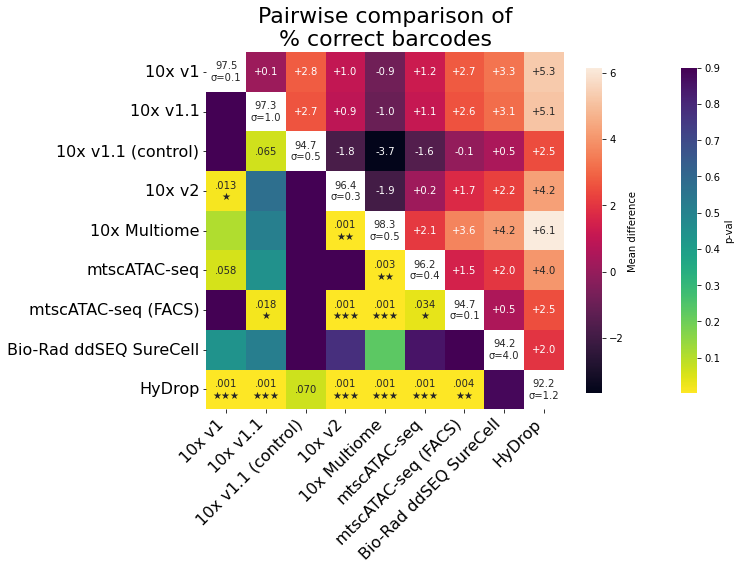

%_mapq30
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9

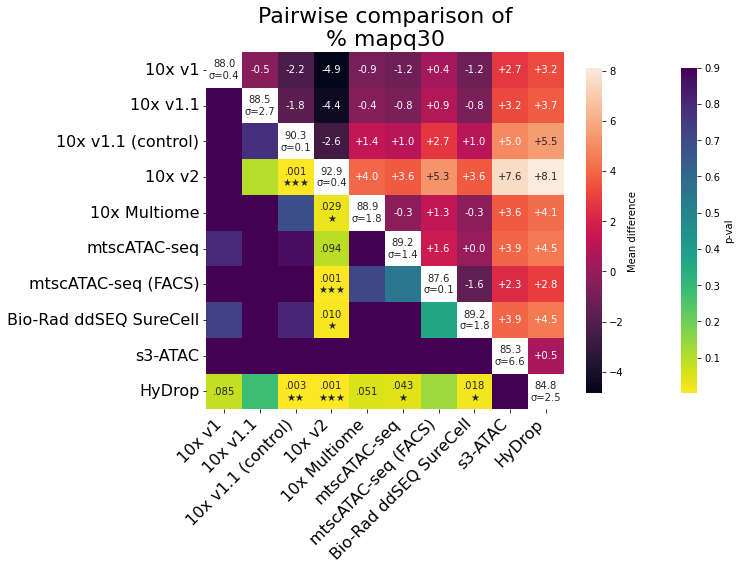

B_cell
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val wit

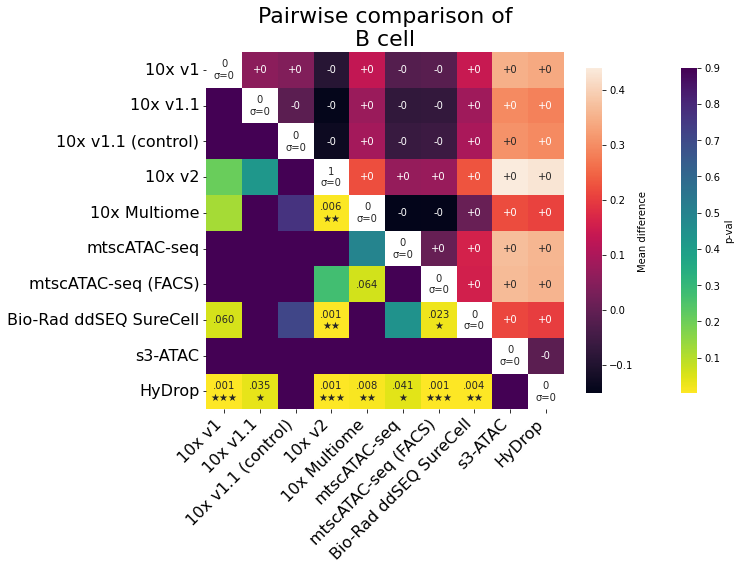

B_cell_top20dars_recovery
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> repl

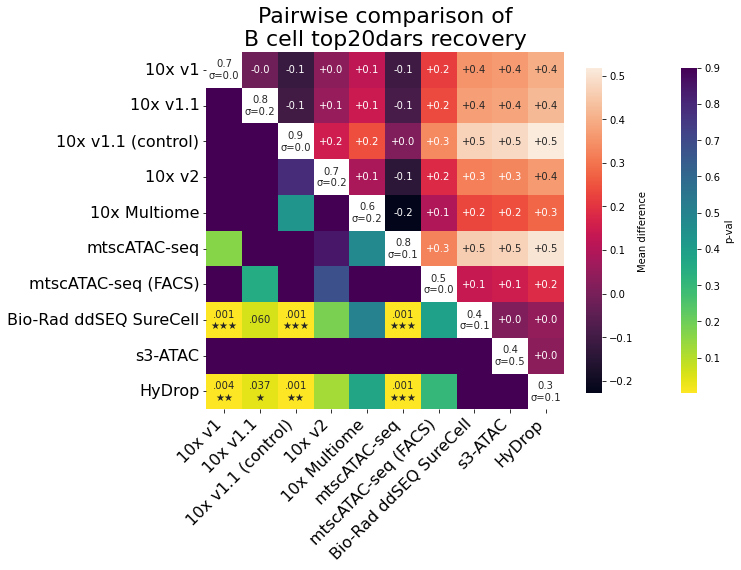

B_cells_bot20peaks_recovery
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some

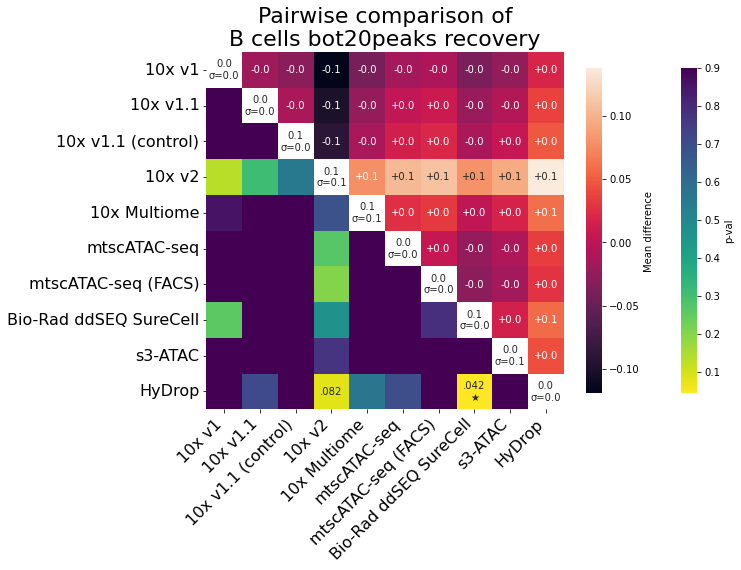

B_cells_top20peaks_recovery
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some

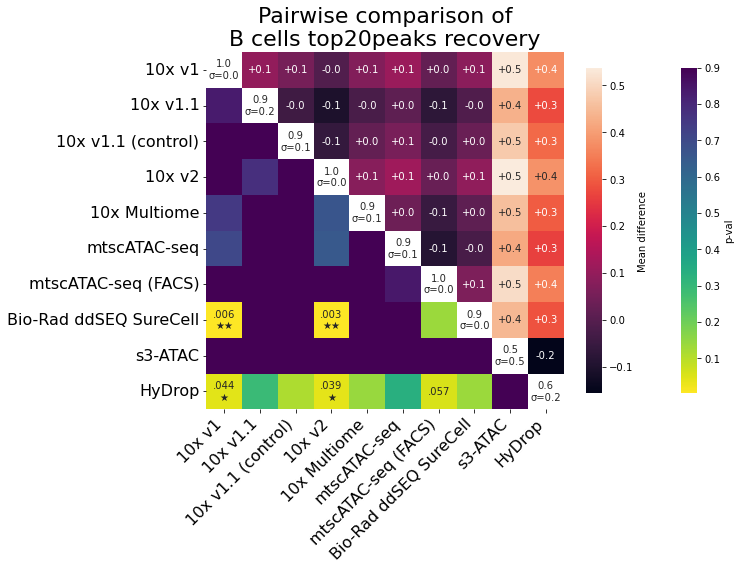

CD14+_monocyte
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')!

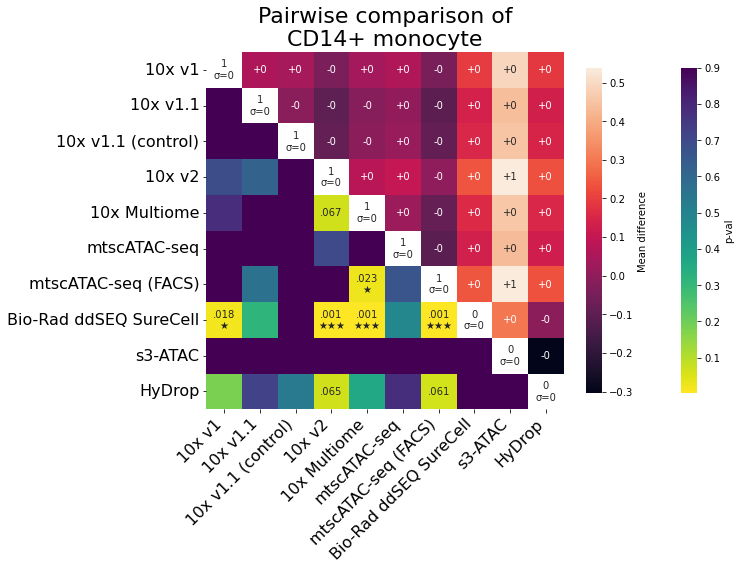

CD14+_monocyte_top20dars_recovery
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace

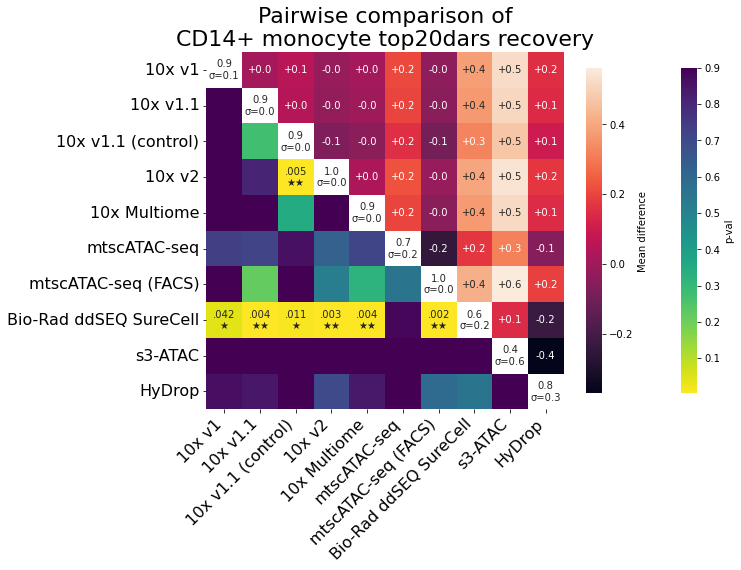

CD14+_monocytes_bot20peaks_recovery
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 'mtscATAC-se

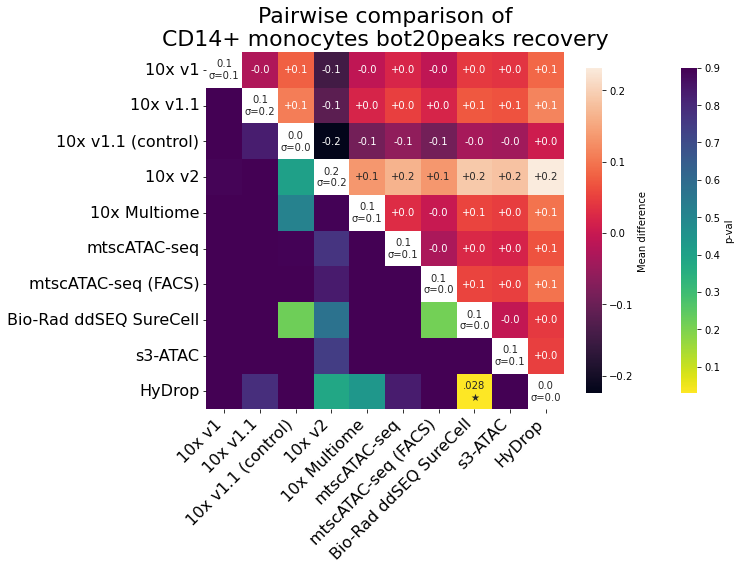

CD14+_monocytes_top20peaks_recovery
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replac

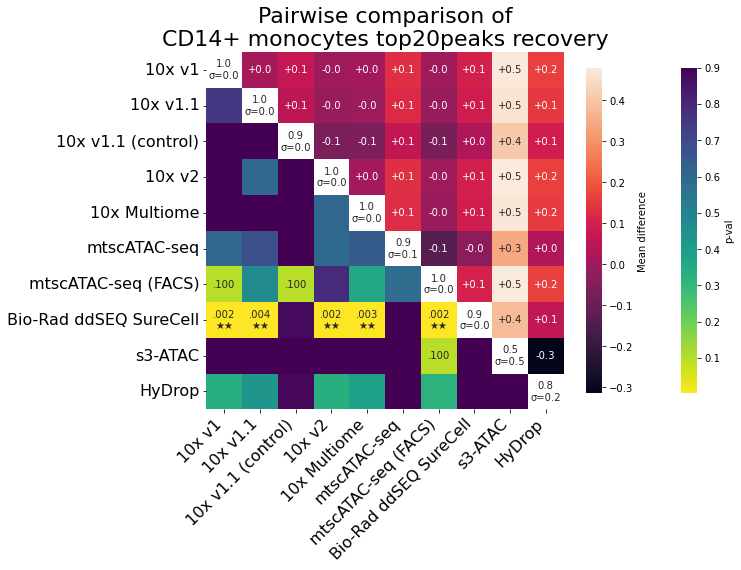

CD16+_monocyte
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> re

/staging/leuven/stg_00002/lcb/fderop/software_2/anaconda3/lib/python3.7/site-packages/hypothetical/descriptive.py:904: RuntimeWarning: invalid value encountered in double_scalars
  np.power(np.sum(xx - np.mean(xx)), 2)) / d


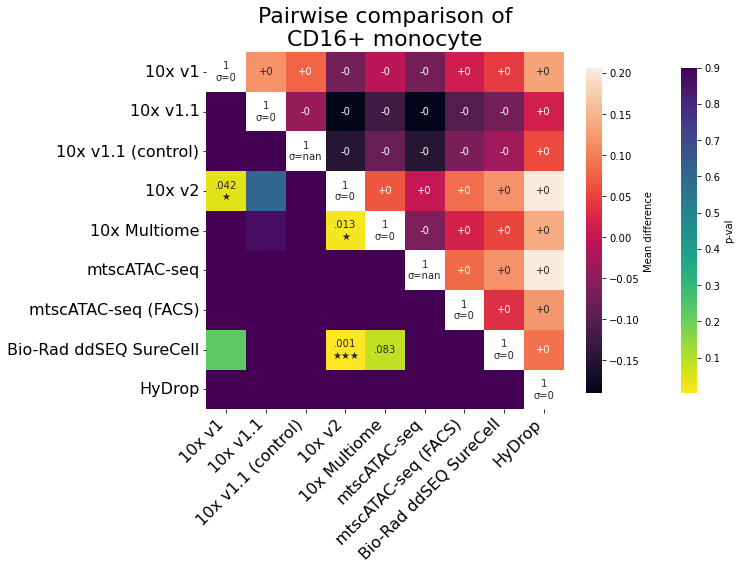

CD16+_monocyte_top20dars_recovery
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 -

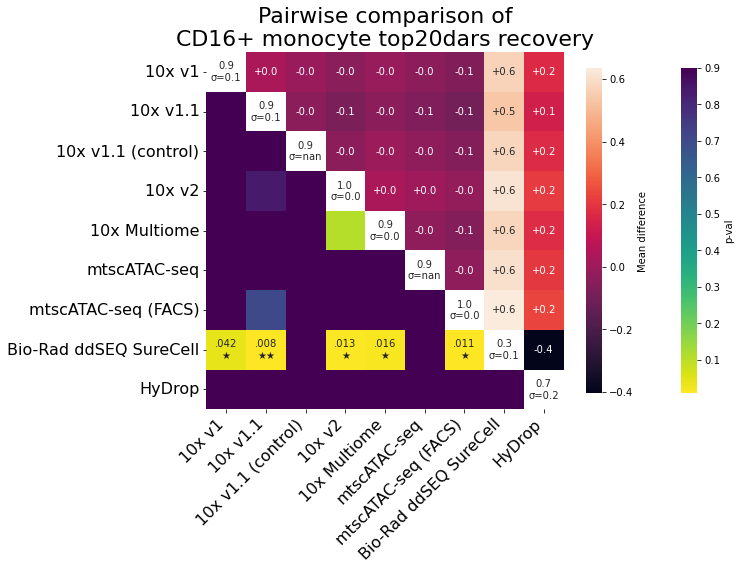

CD16+_monocytes_bot20peaks_recovery
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)

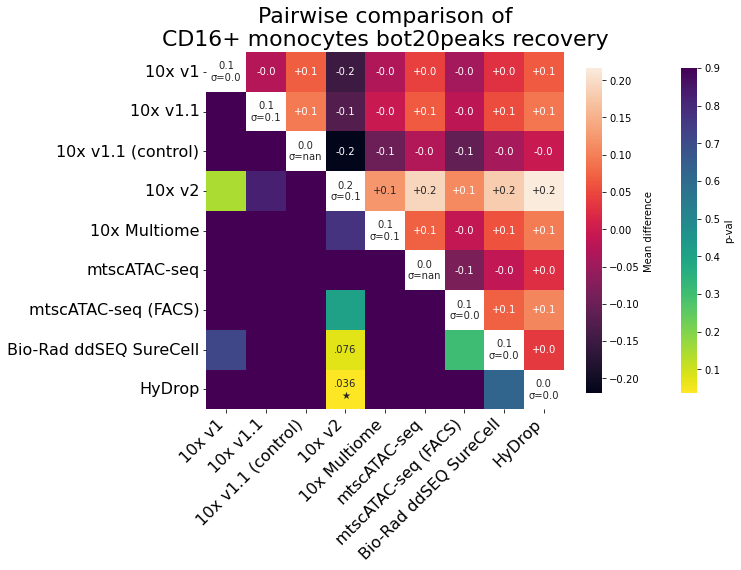

CD16+_monocytes_top20peaks_recovery
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! s

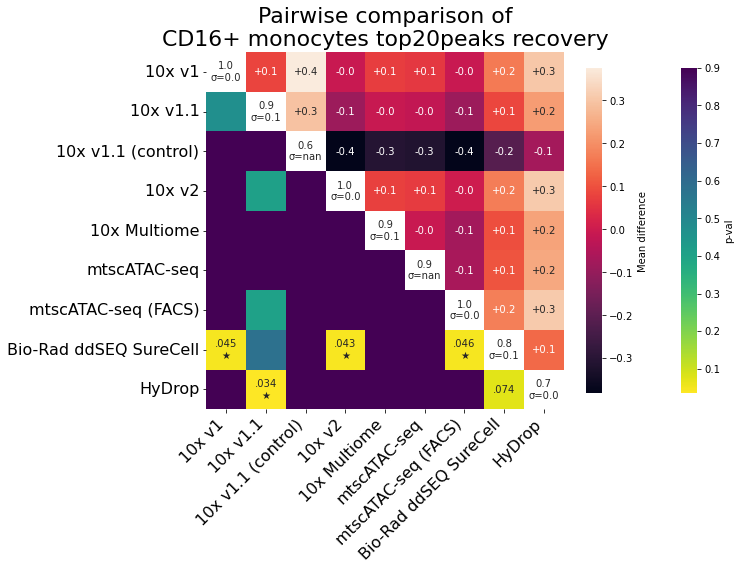

CD4+_T_cell
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception 

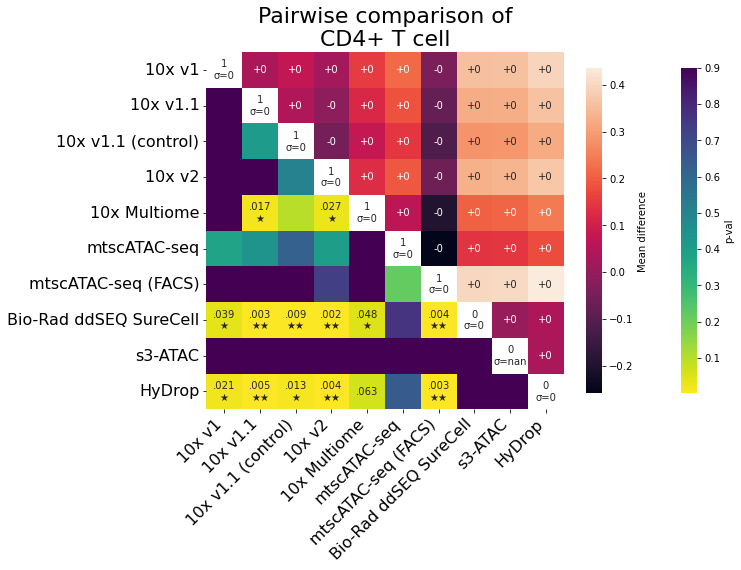

CD4+_T_cell_top20dars_recovery
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 -->

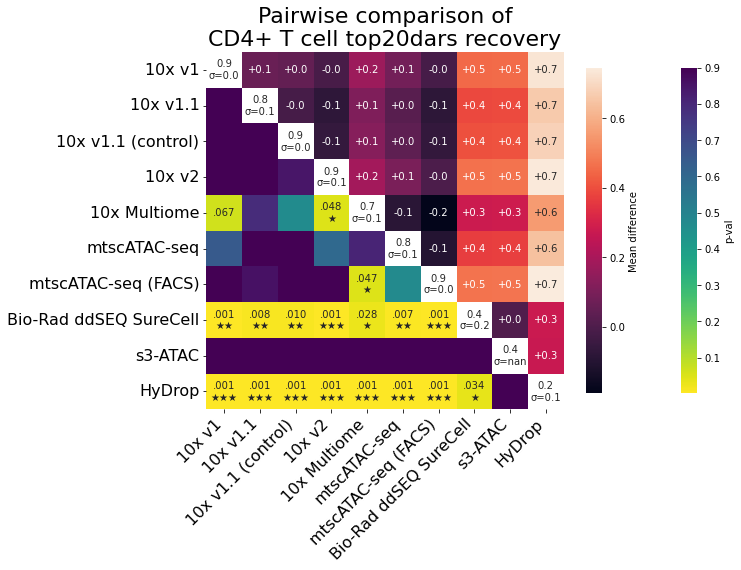

Cytotoxic_T_cell
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val w

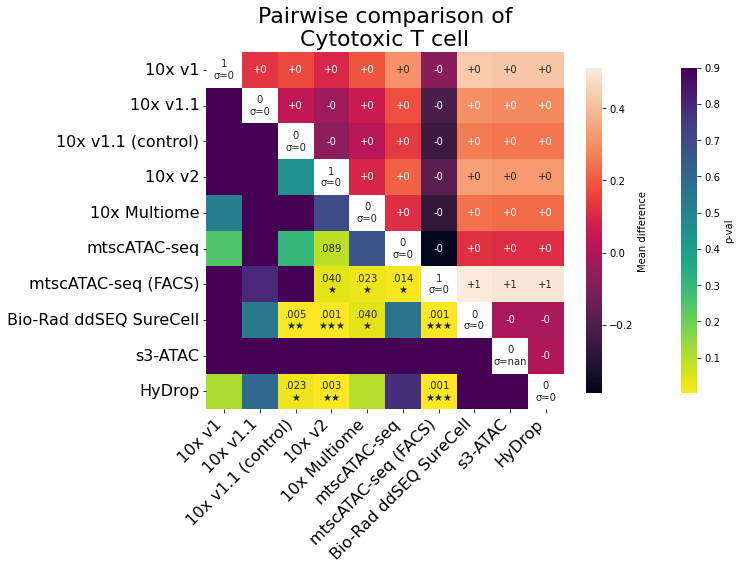

Cytotoxic_T_cell_top20dars_recovery
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 

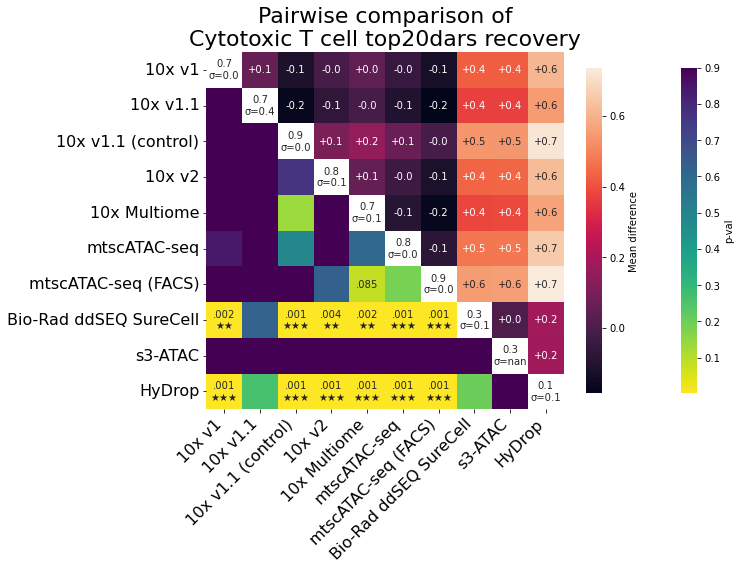

Cytotoxic_T_cells_bot20peaks_recovery
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


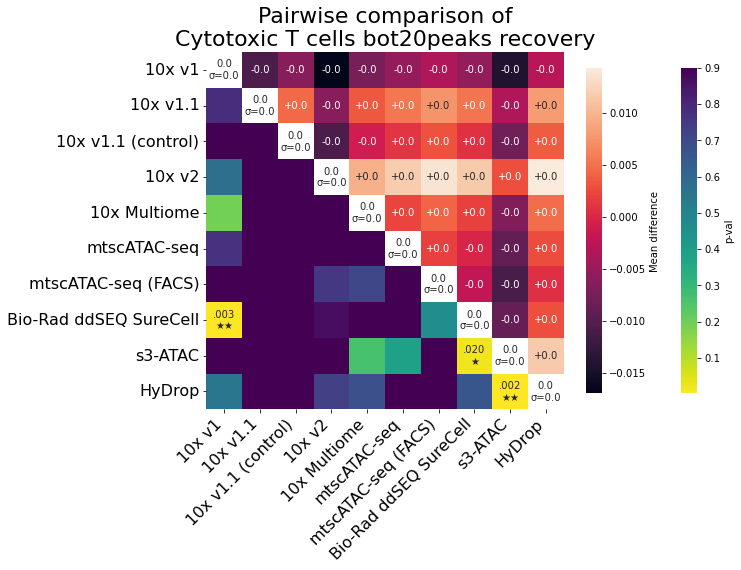

Cytotoxic_T_cells_top20peaks_recovery
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ Su

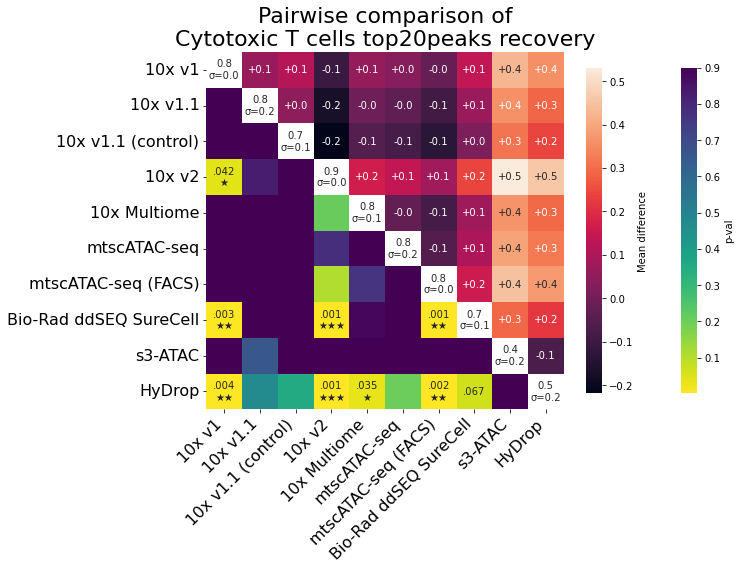

Dendritic_cell
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'HyDrop')! some samples n < 2 --> replace p_val wi

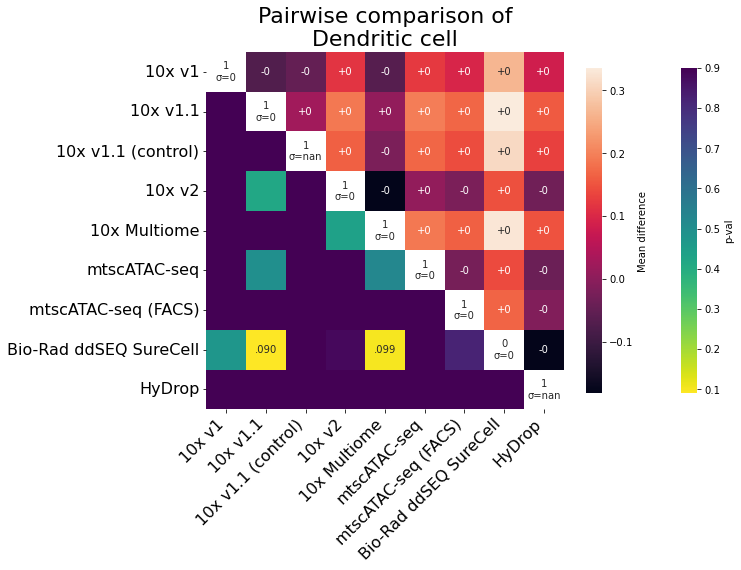

Dendritic_cell_top20dars_recovery
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'HyDrop')! some samples n < 2 --> replace p_val wi

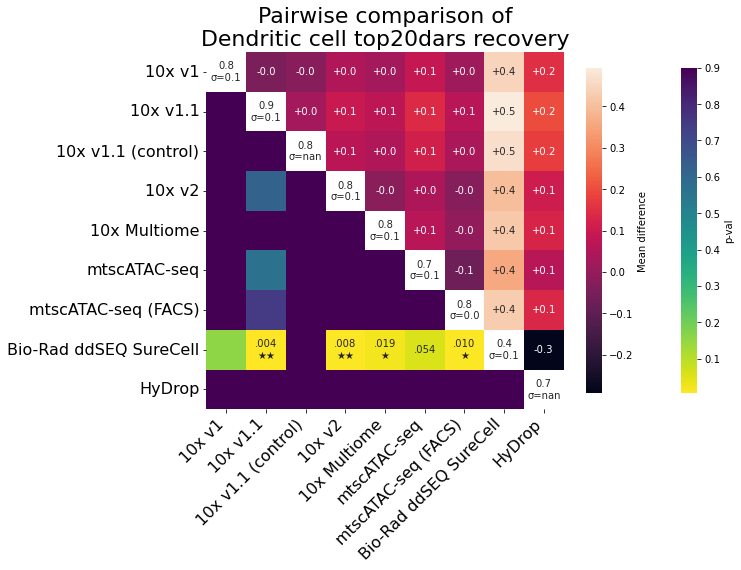

Dendritic_cells_bot20peaks_recovery
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'HyDrop')! some

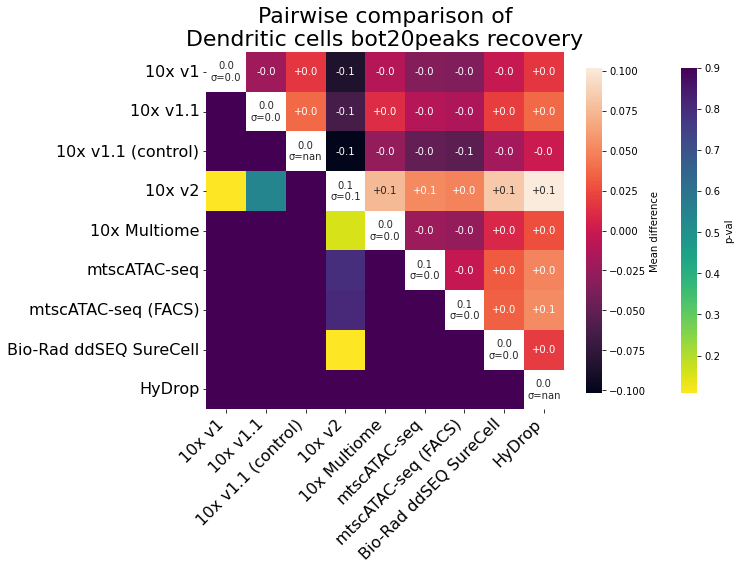

Dendritic_cells_top20peaks_recovery
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 

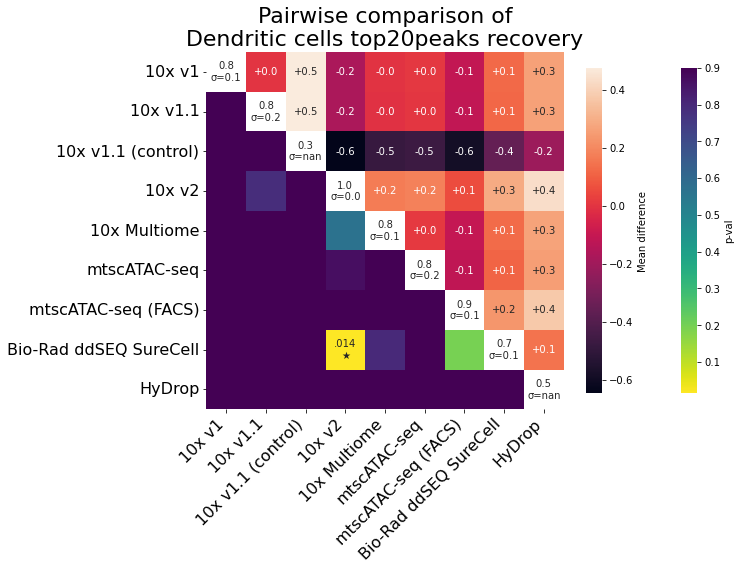

Duplicate fragments in cells
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


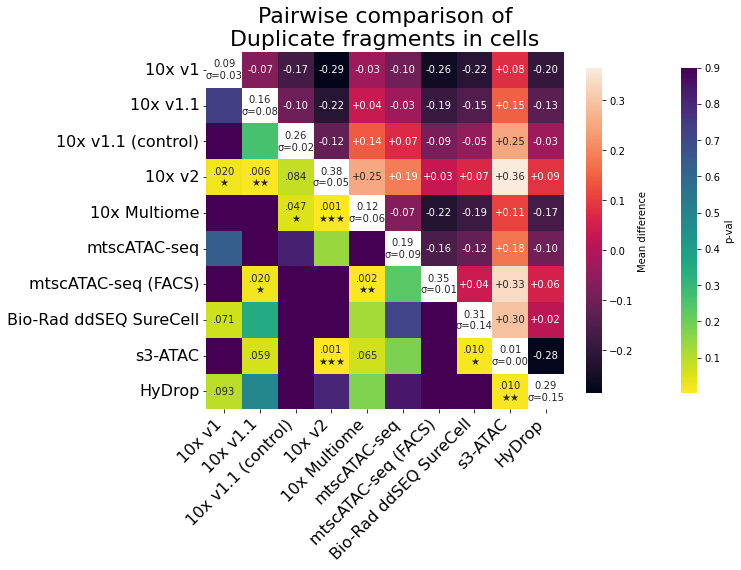

Duplicate fragments in cells, normalized to fragments in cells
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


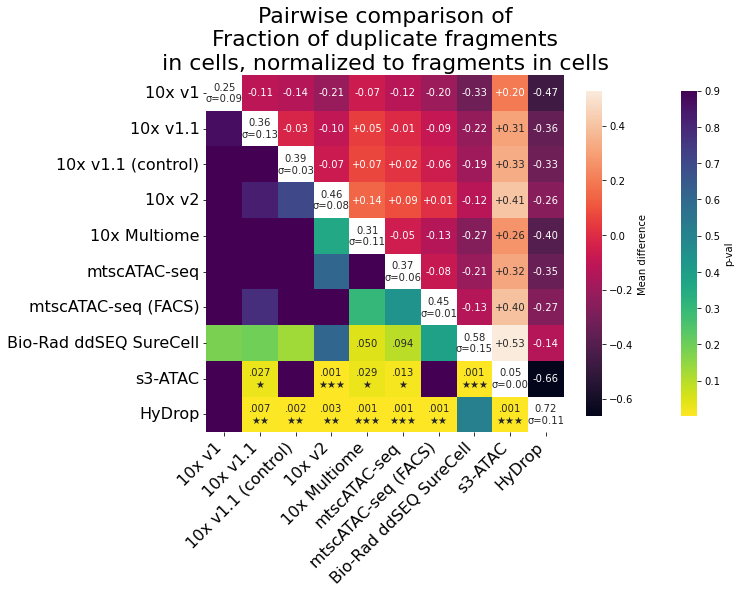

Fragments in background noise barcodes
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! s

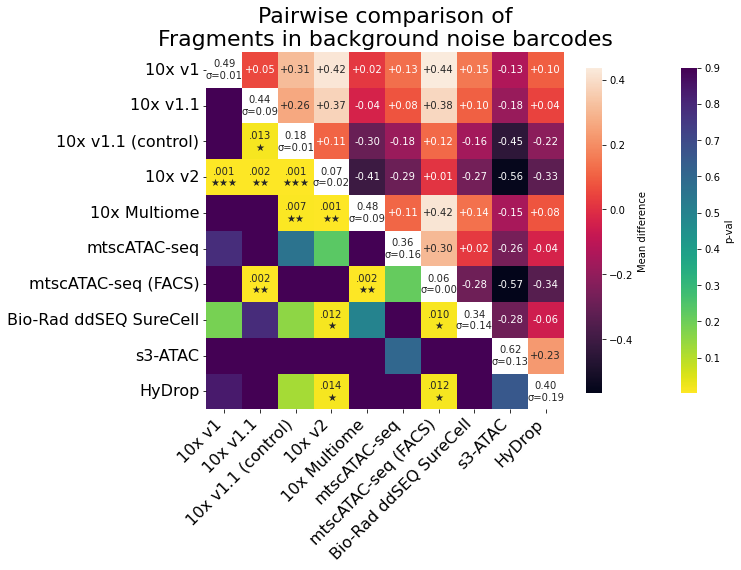

Mean_Unique_nr_frag_in_regions
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n

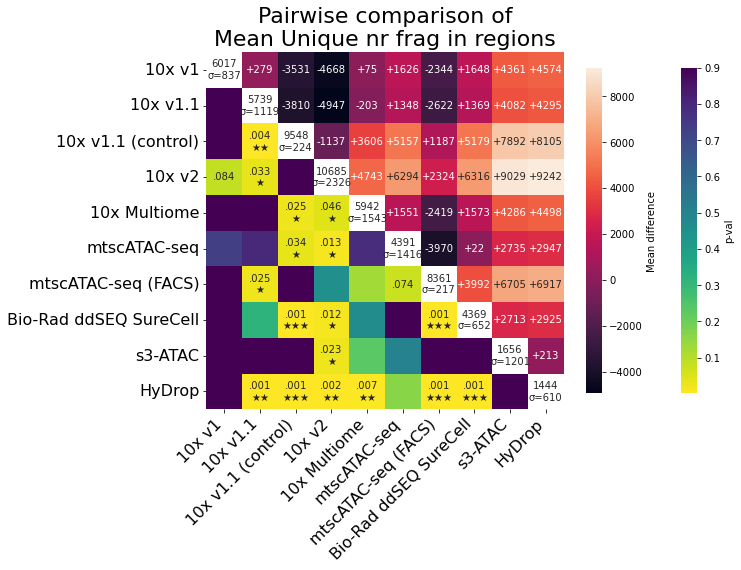

Mean_scrublet_doublet_scores_fragments
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


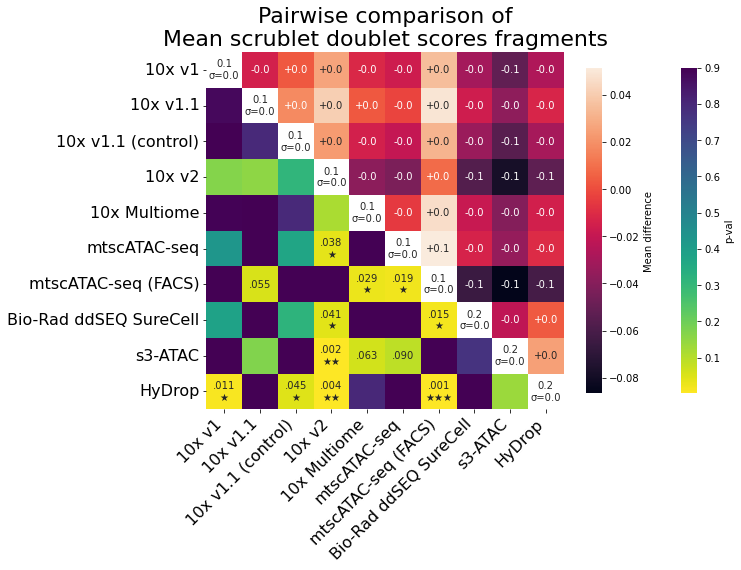

Median_Unique_nr_frag_in_regions
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


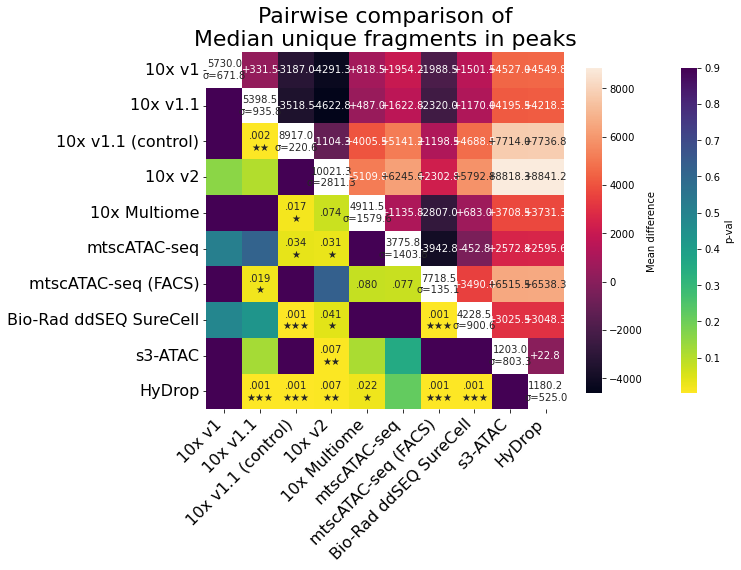

Median_Unique_nr_frag_in_regions_thousands
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


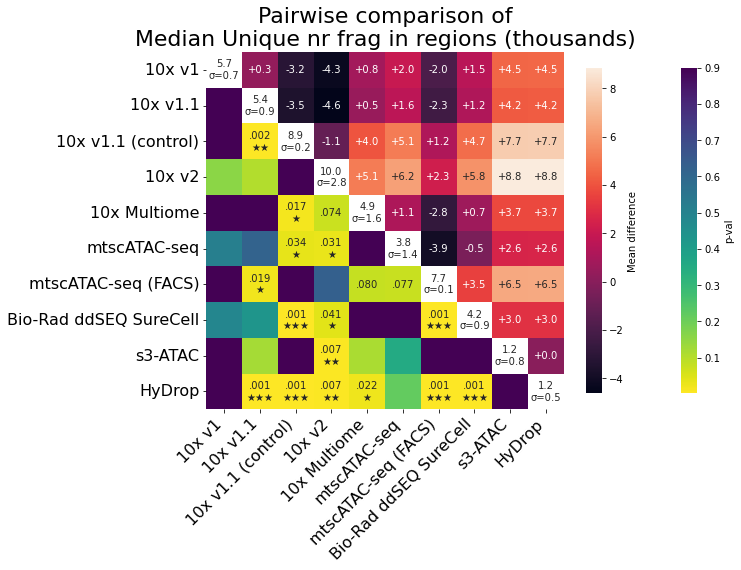

Median_dupl_rate
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


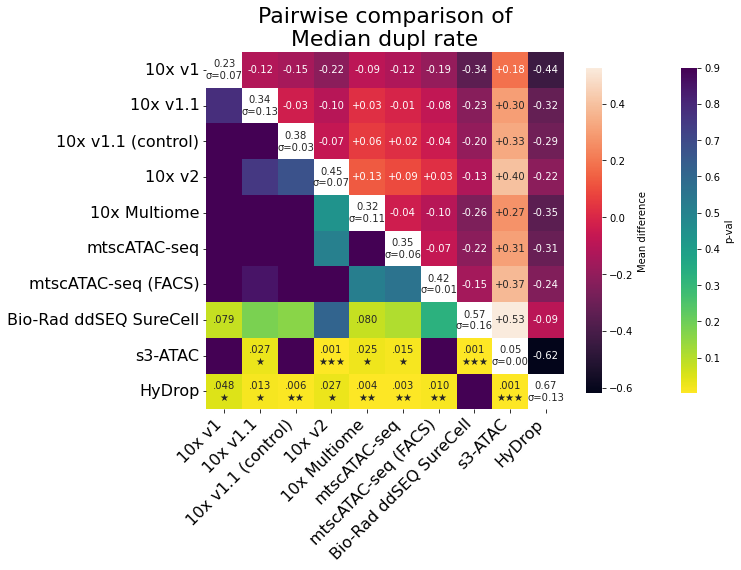

Median_frip
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('1

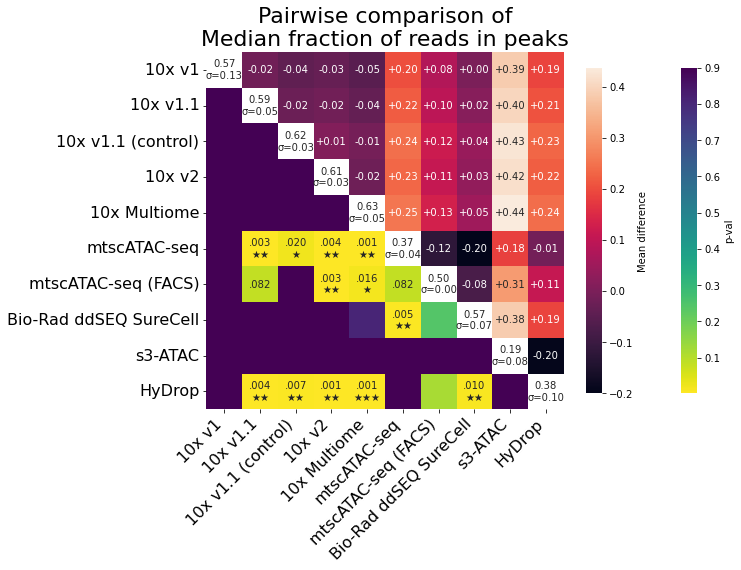

Median_scrublet_doublet_scores_fragments
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


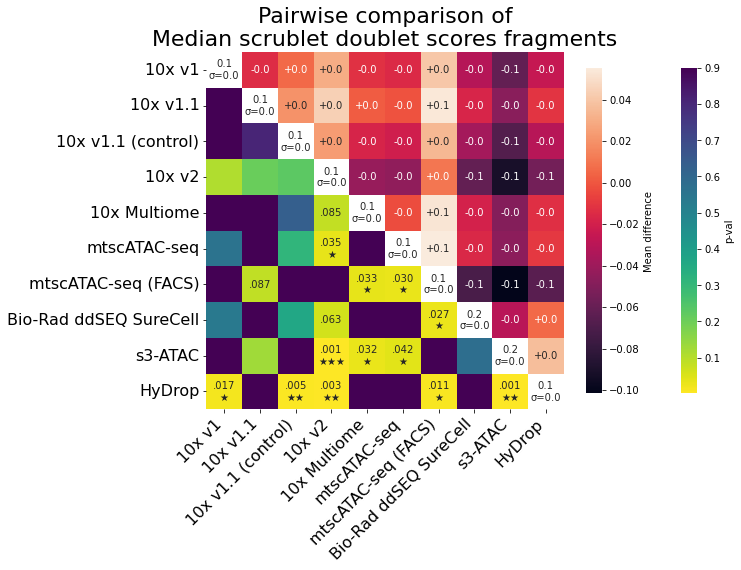

Median_total_nr_frag
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


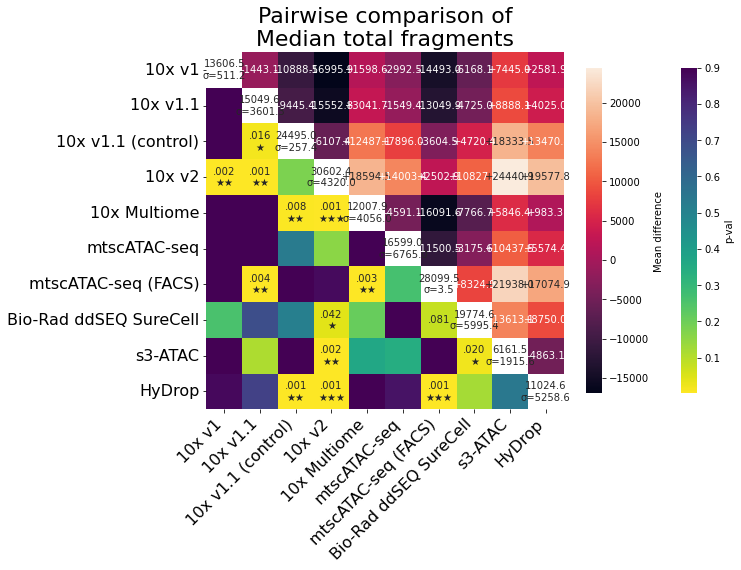

Median_total_nr_frag_in_regions
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


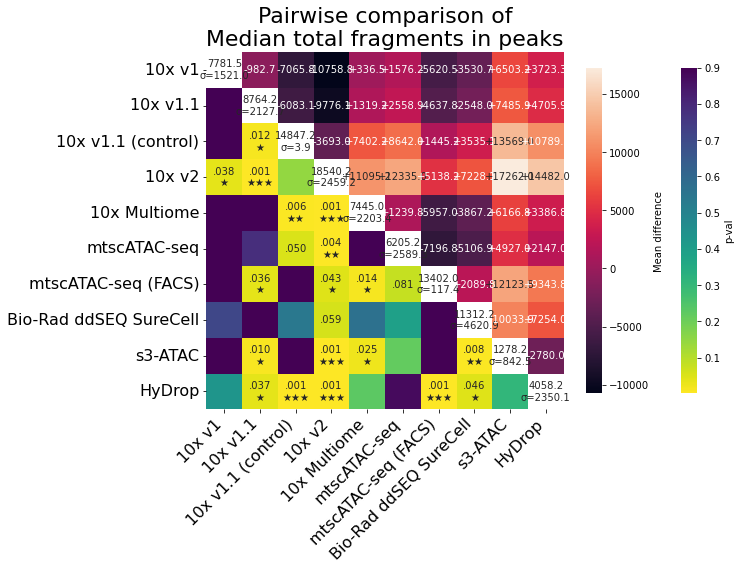

Median_total_nr_frag_in_regions_thousands
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


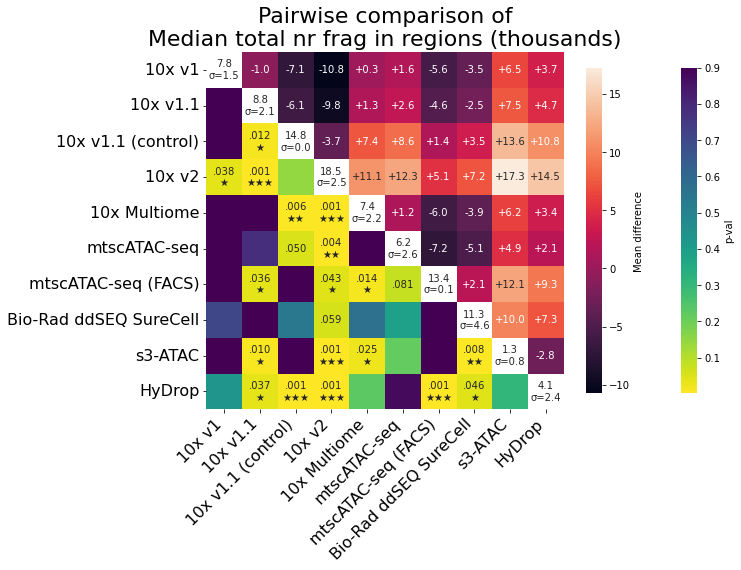

Median_total_nr_frag_thousands
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


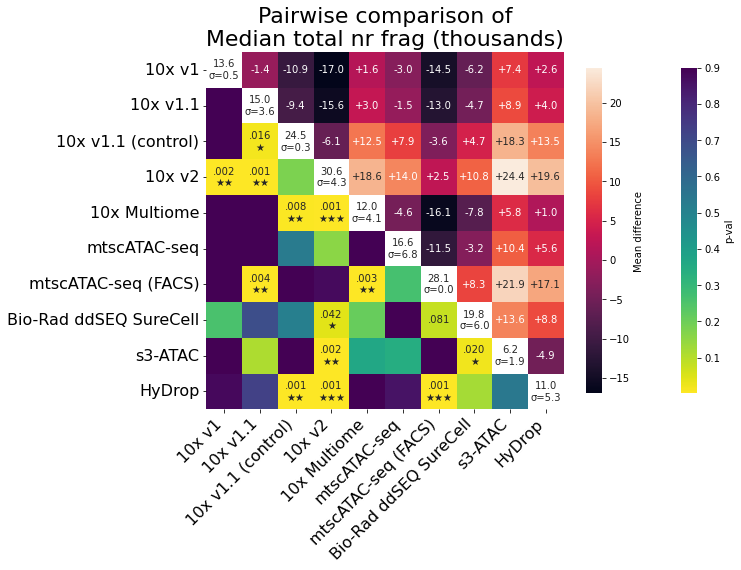

Median_tss_enrichment
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace

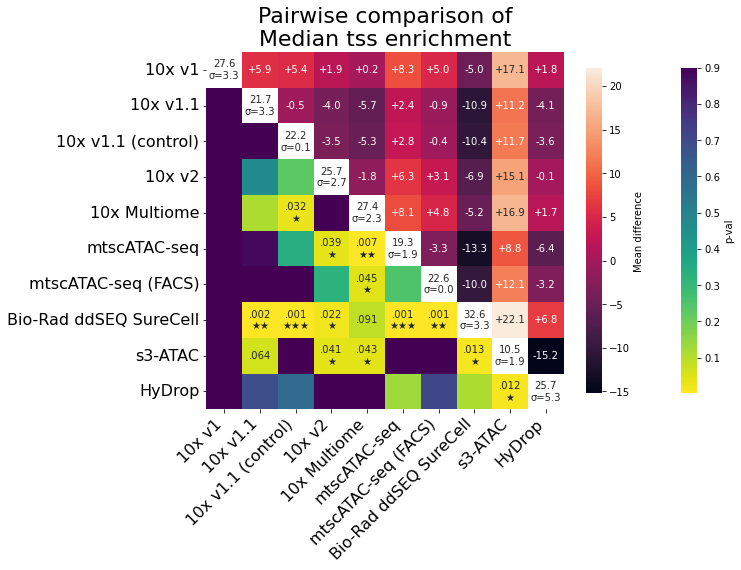

Median_unique_nr_frag
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell',

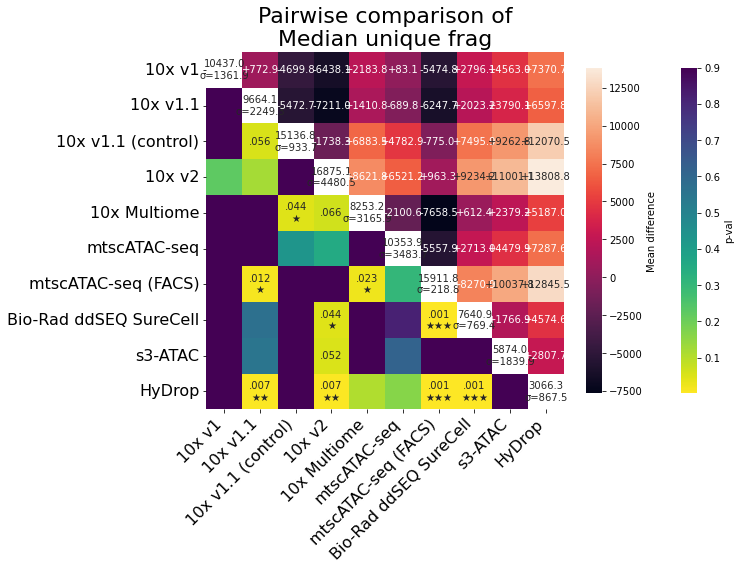

Median_unique_nr_frag_thousands
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ 

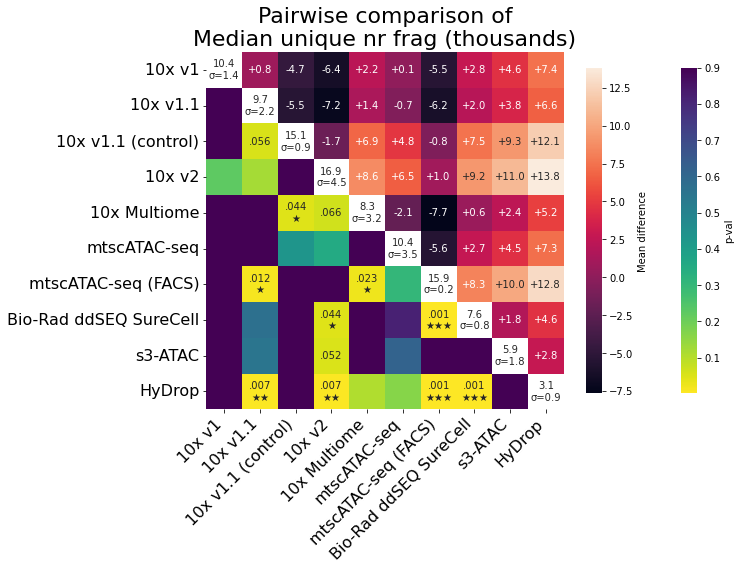

NK_cells_bot20peaks_recovery
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> repl

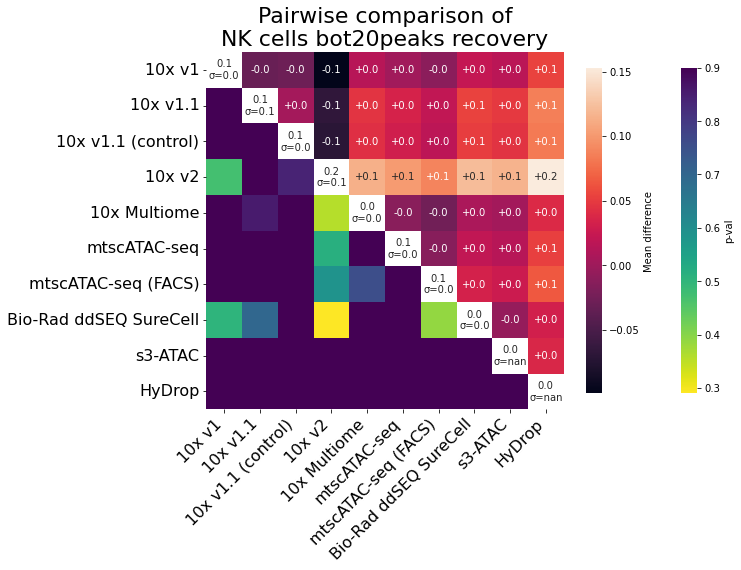

NK_cells_top20peaks_recovery
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occur

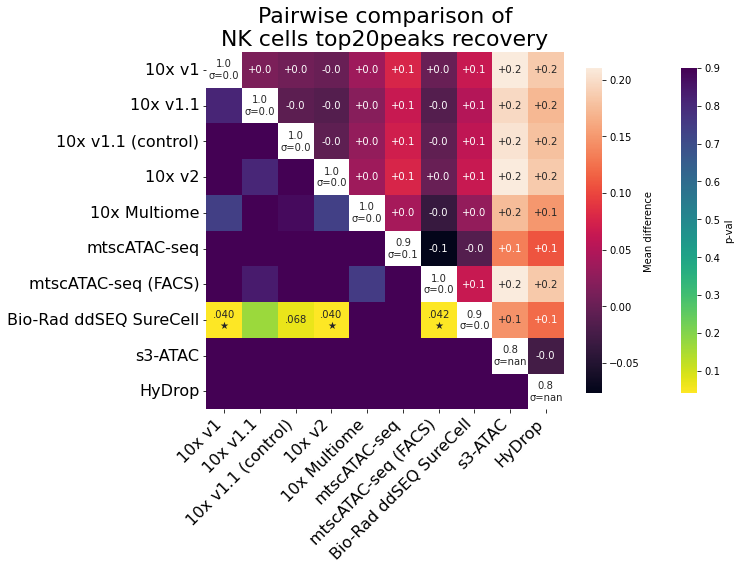

Naive_T_cells_bot20peaks_recovery
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some s

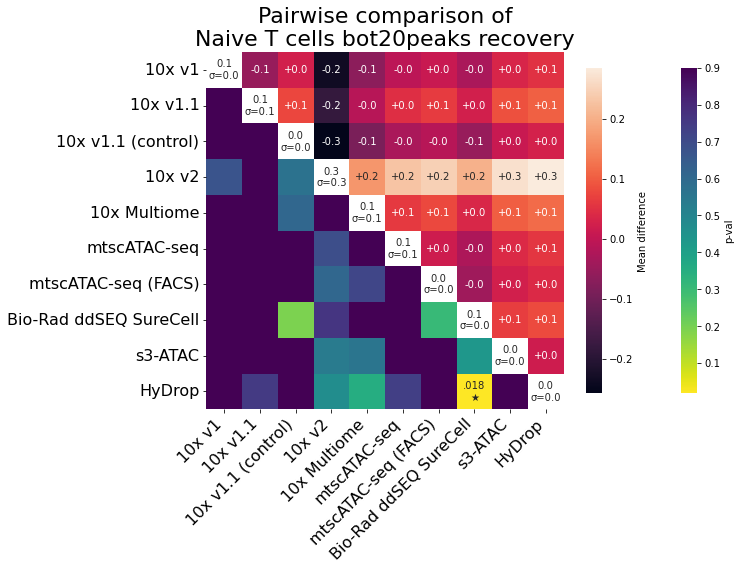

Naive_T_cells_top20peaks_recovery
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> re

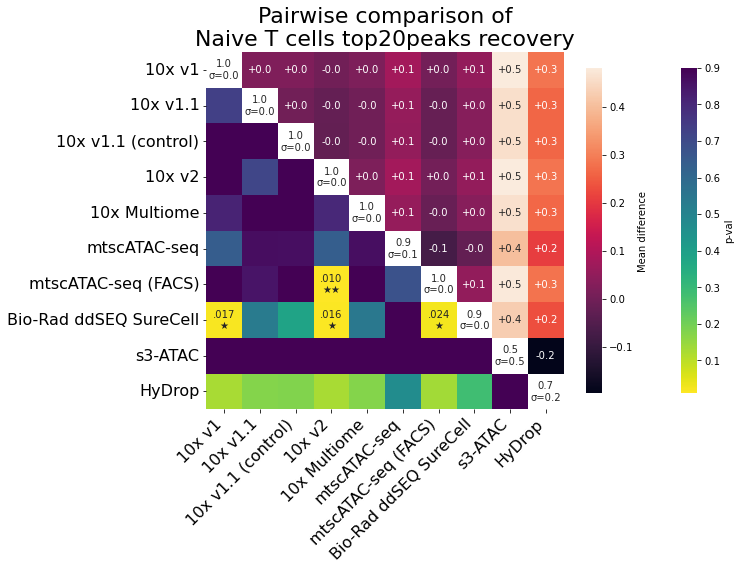

Natural_killer_cell
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
excepti

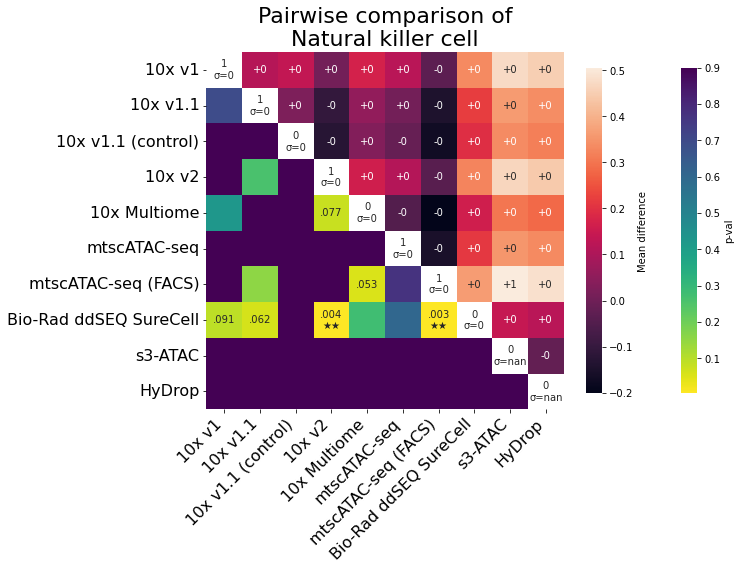

Natural_killer_cell_top20dars_recovery
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9

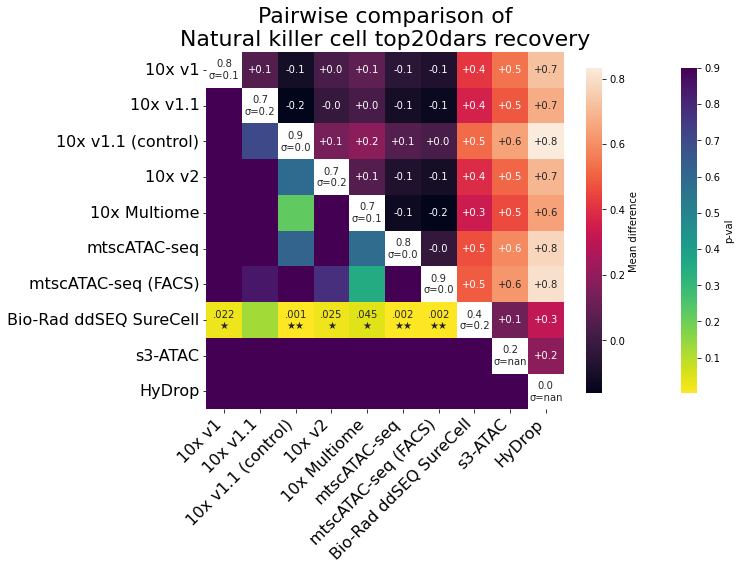

No correct barcode
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9


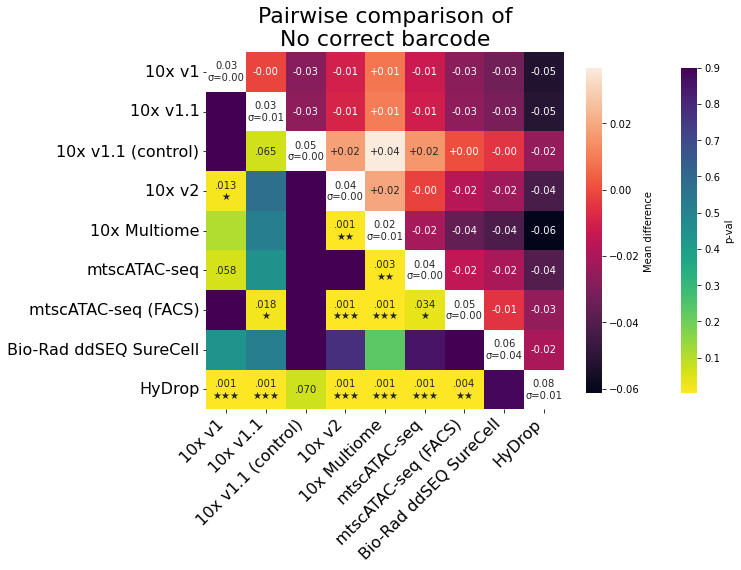

Not mapped properly
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_v

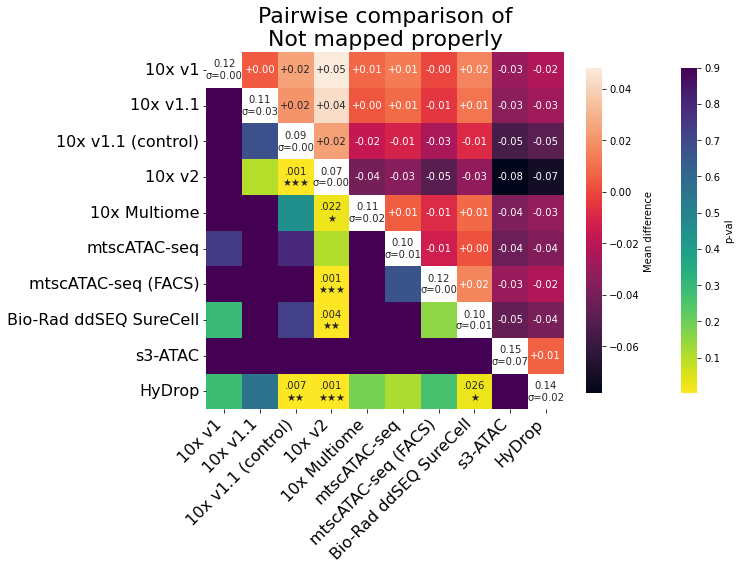

Unique fragments in cells and in peaks
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some s

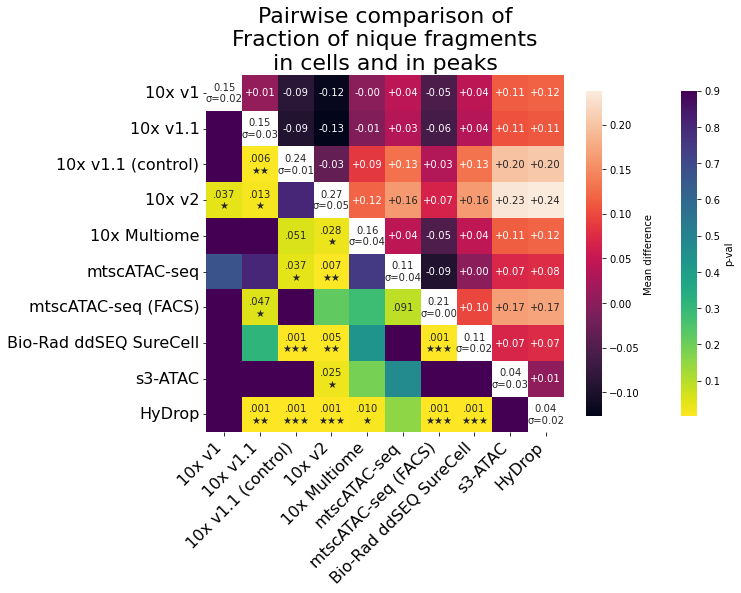

Unique fragments in cells and in peaks, normalized to unique fragments in cells
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! som

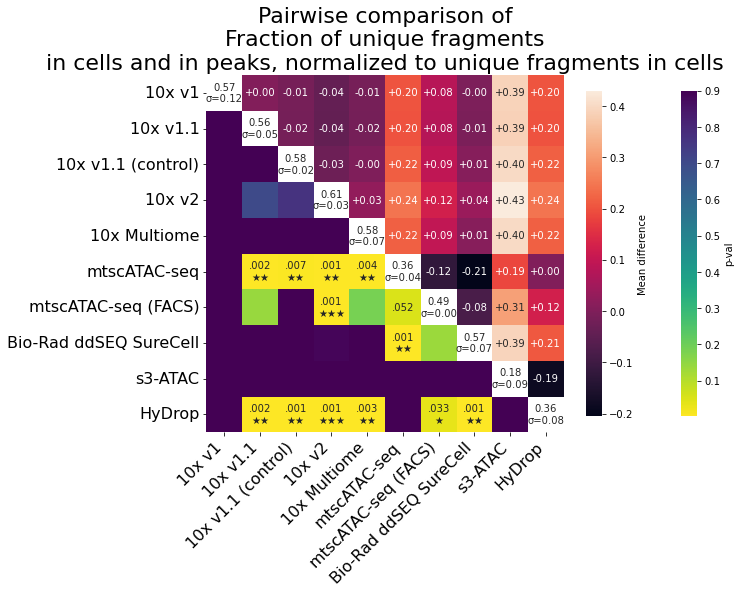

Unique fragments in cells, not in peaks
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 

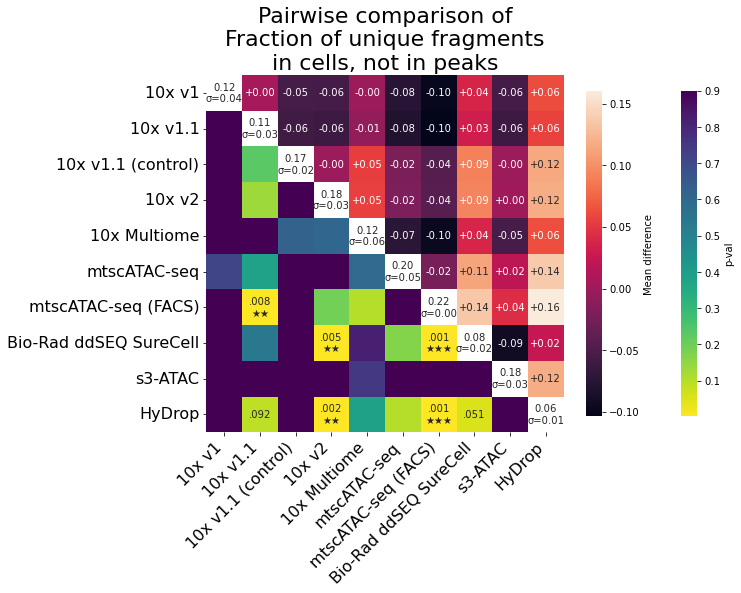

Unique fragments in cells, not in peaks, normalized to unique fragments in cells
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! so

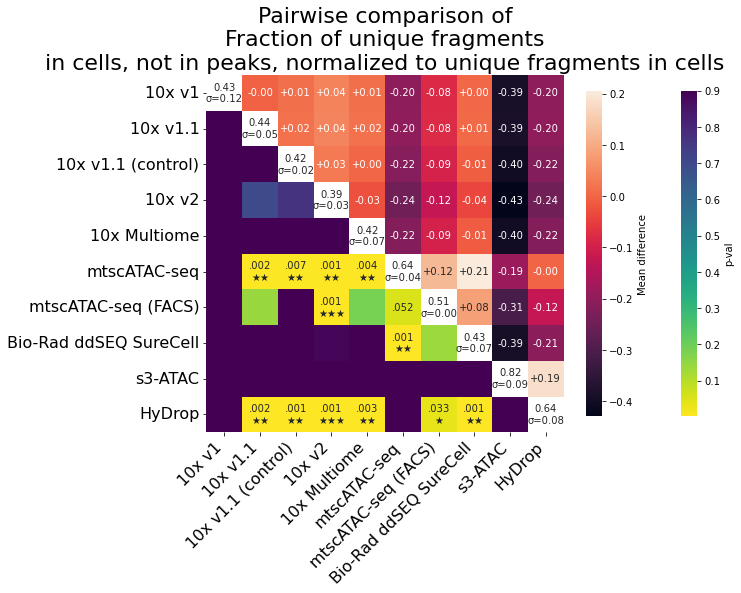

alldars_median_dar_logfc
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0

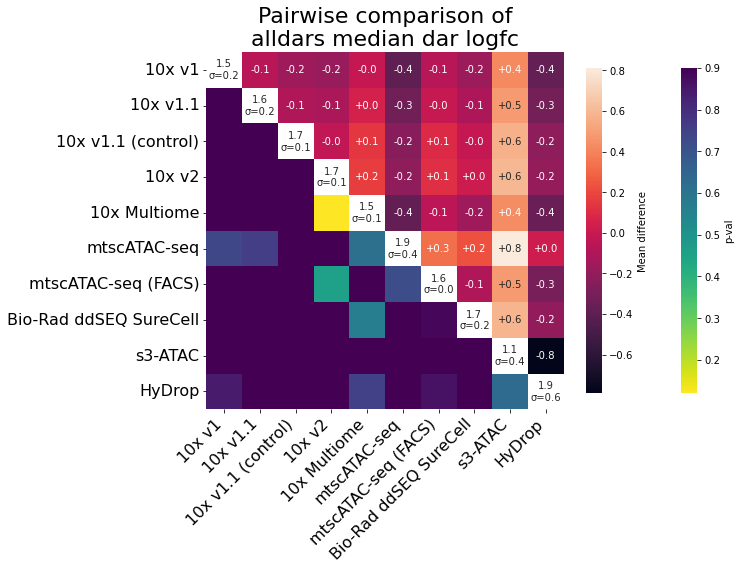

alldars_median_dar_tss_dist
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> re

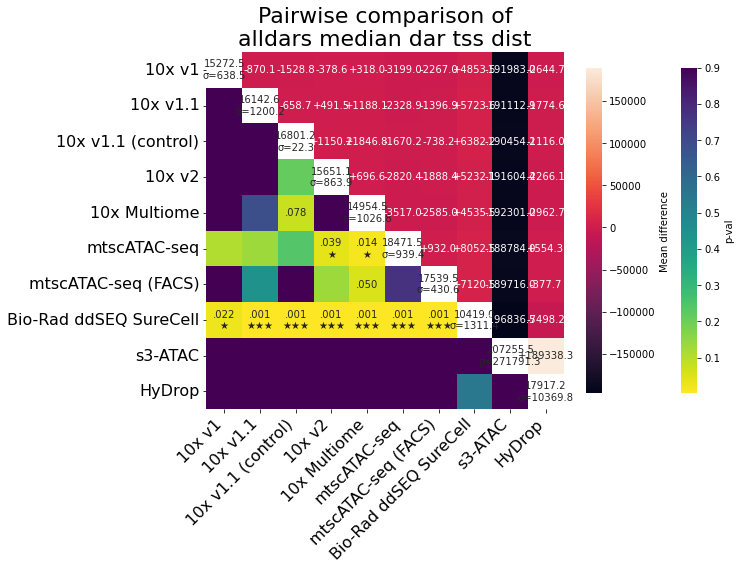

allpeaks_median_peak_logfc
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-A

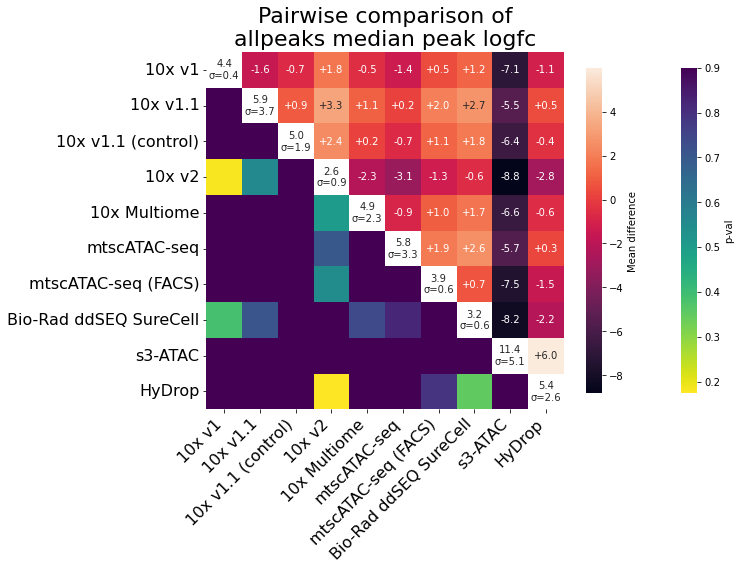

allpeaks_median_peak_tss_dist
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')

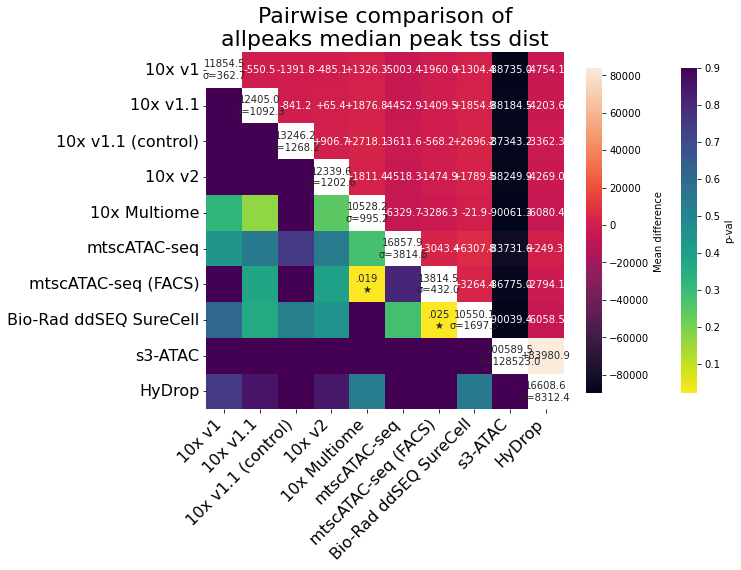

avg_insert_size
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


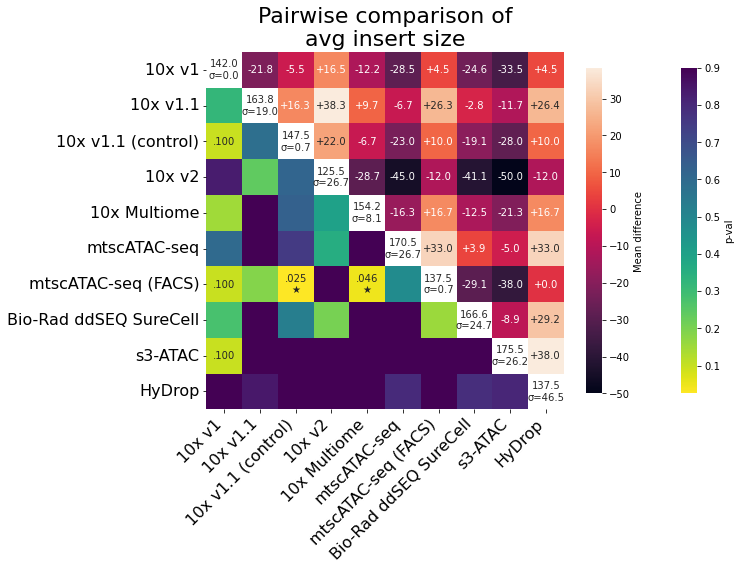

avg_map_quality
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
0.9111661786766325 10 1.0
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


/user/leuven/330/vsc33042/.local/lib/python3.7/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in double_scalars
/user/leuven/330/vsc33042/.local/lib/python3.7/site-packages/ipykernel_launcher.py:65: RuntimeWarning: invalid value encountered in double_scalars


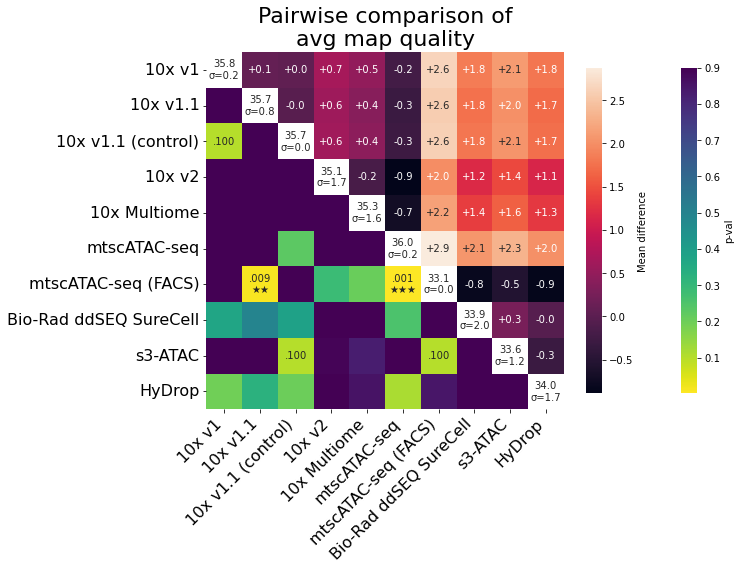

cells
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occ

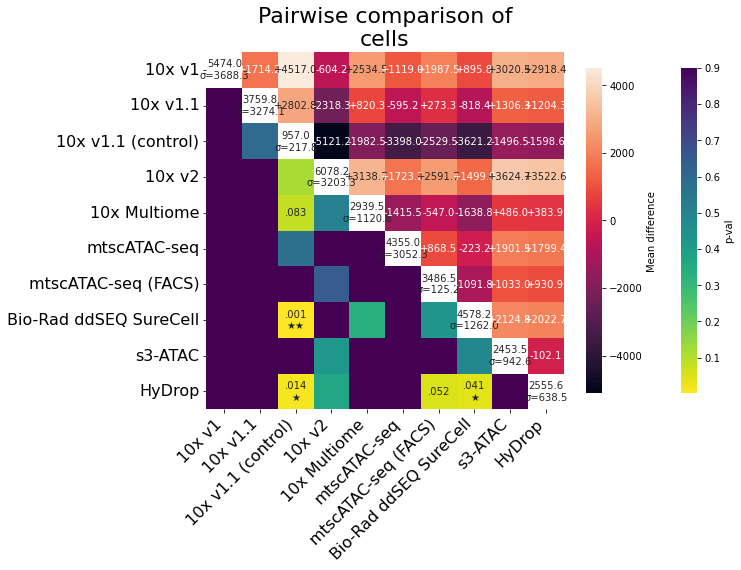

chr1
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
ex

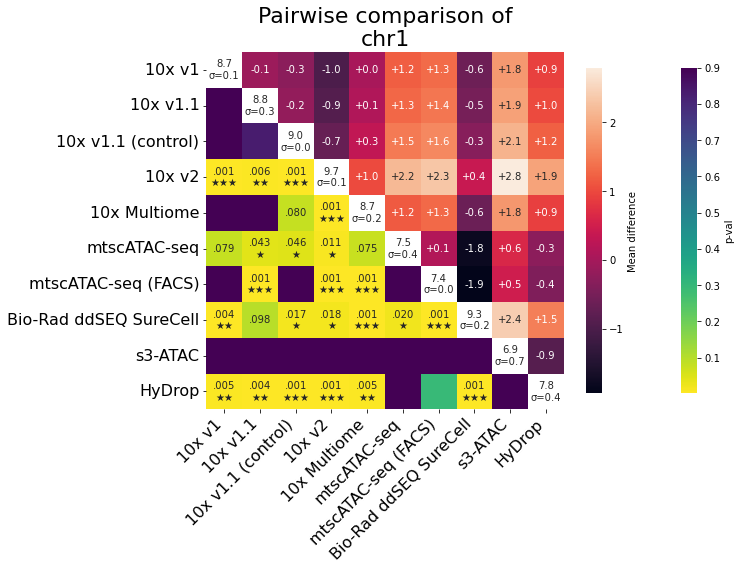

chr10
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples 

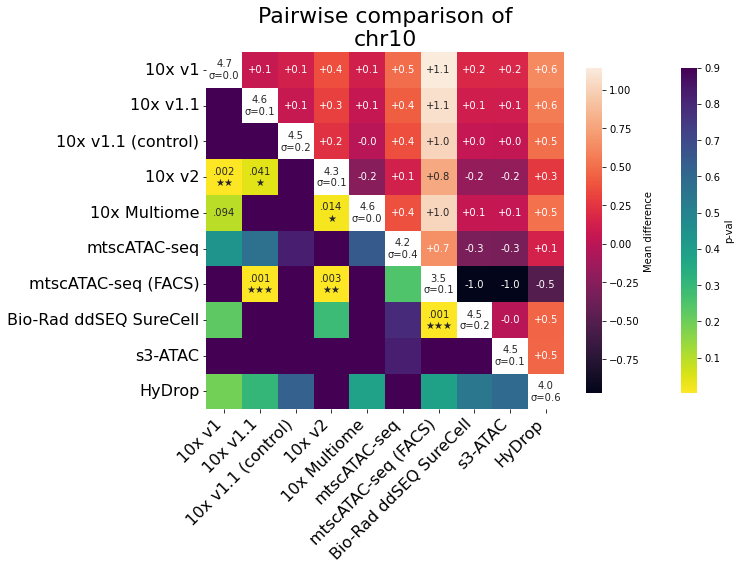

chr11
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_va

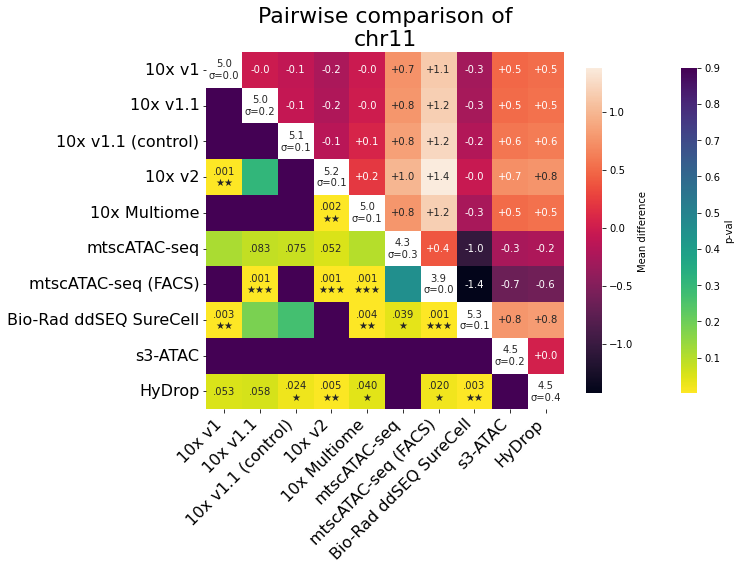

chr12
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some sample

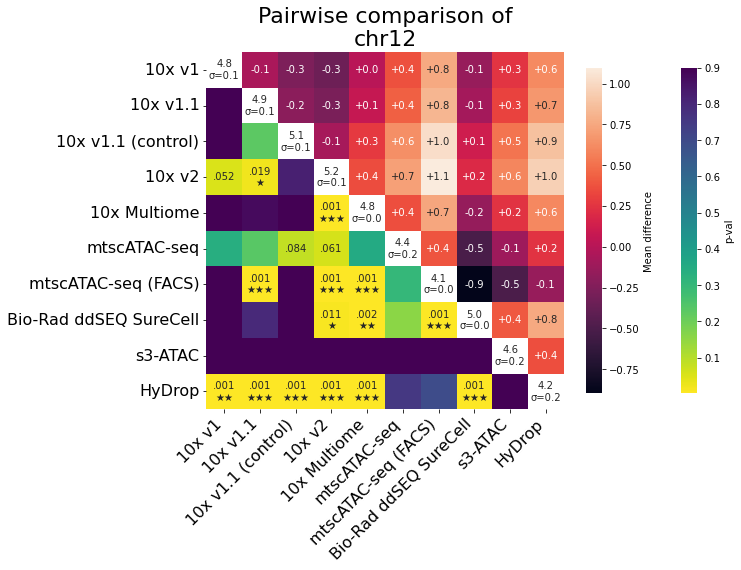

chr13
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
e

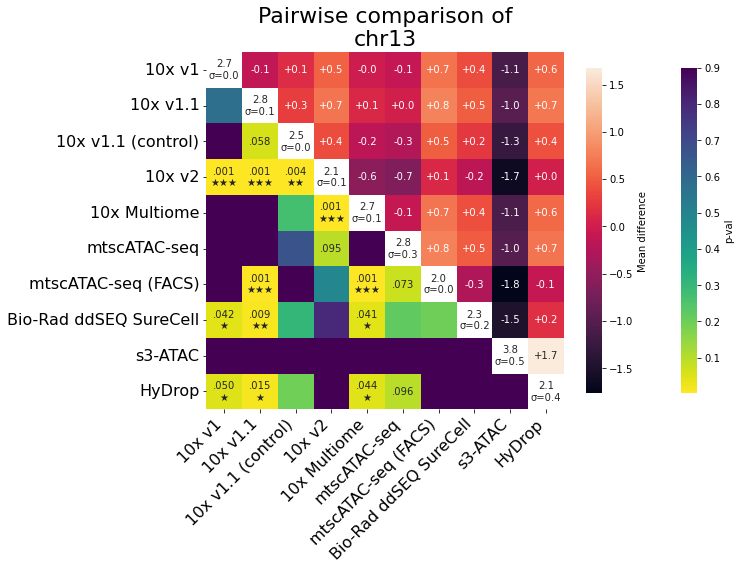

chr14
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some 

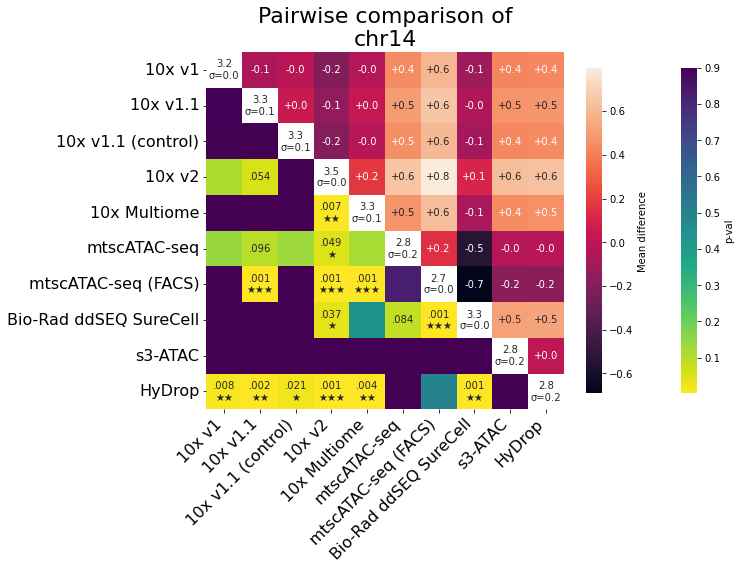

chr15
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
excep

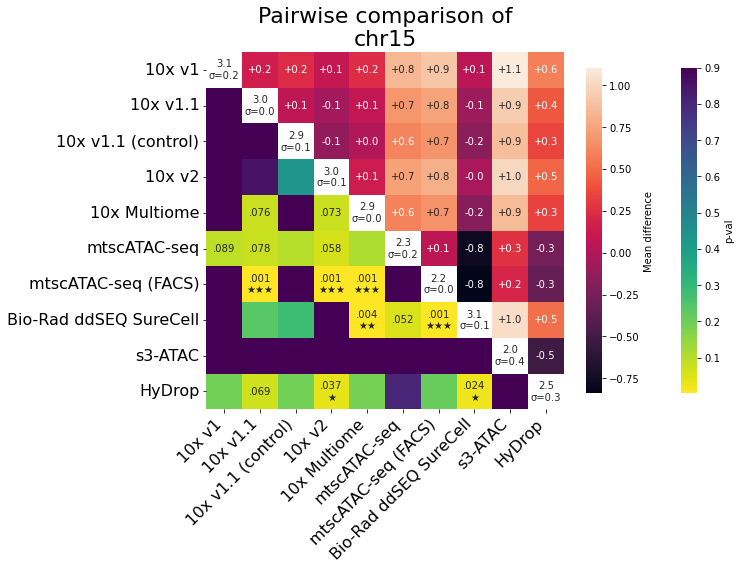

chr16
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
ex

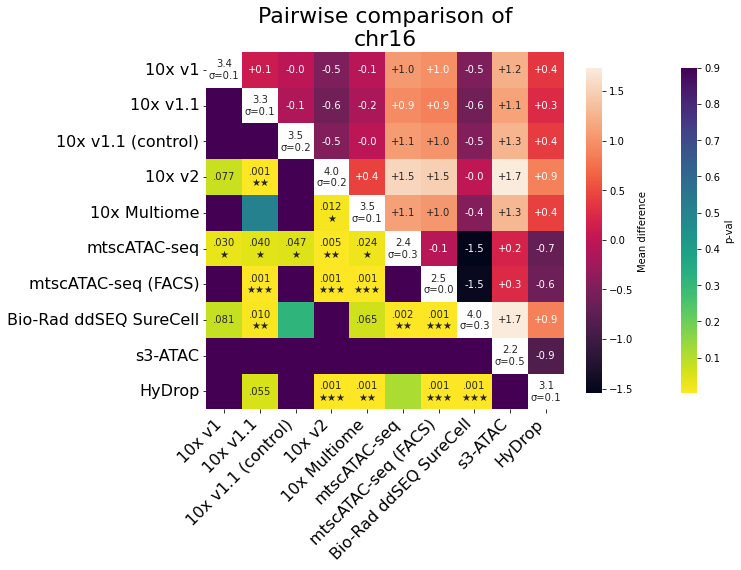

chr17
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
e

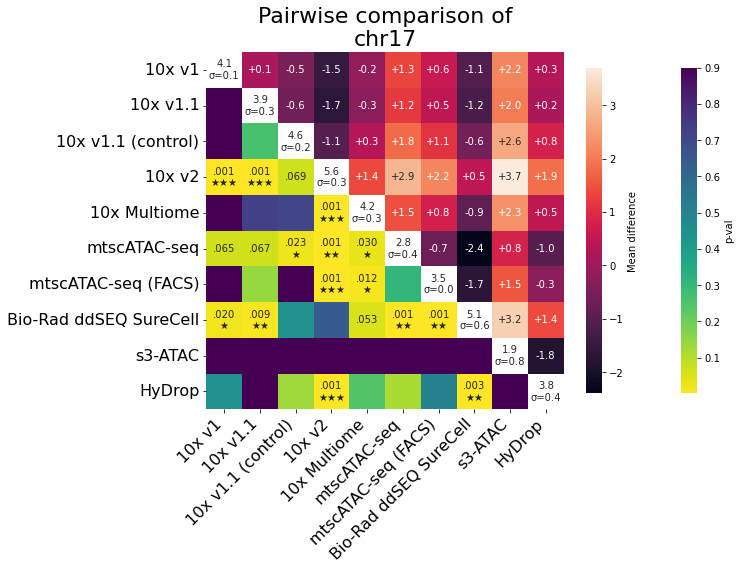

chr18
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception oc

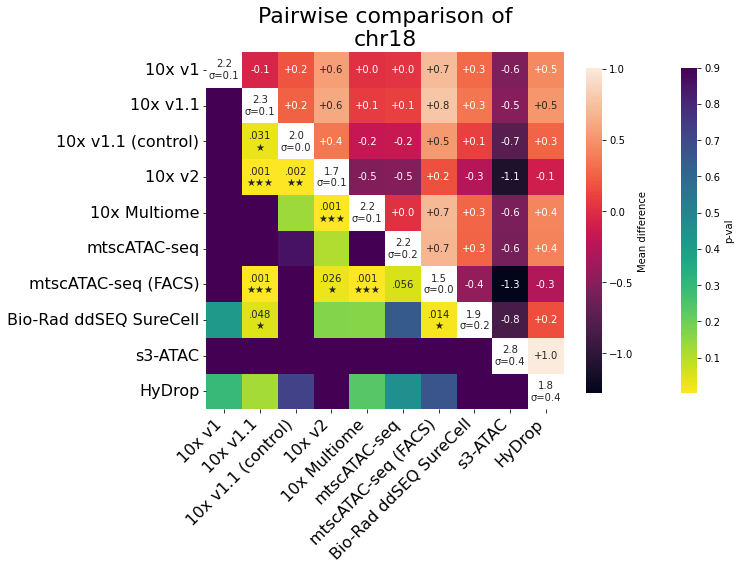

chr19
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception o

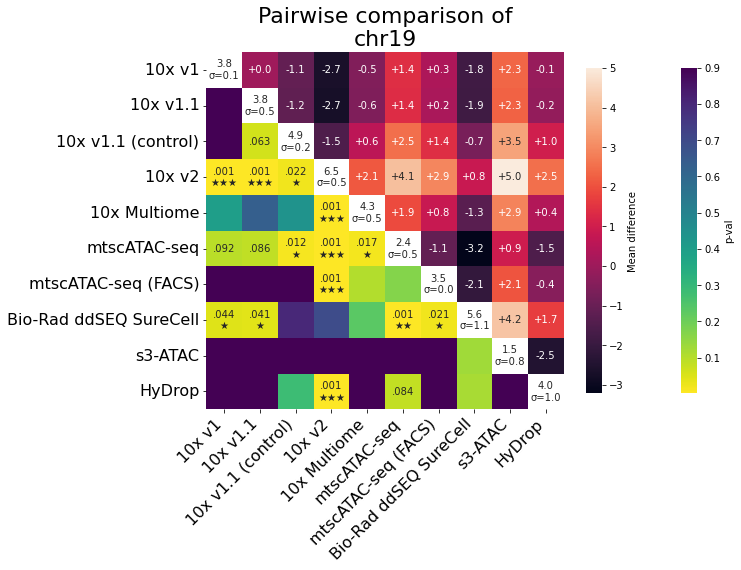

chr2
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occu

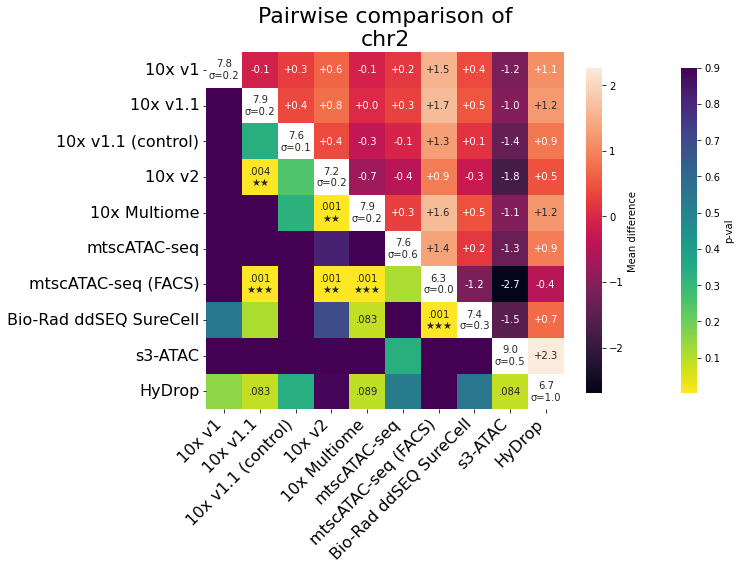

chr20
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
excep

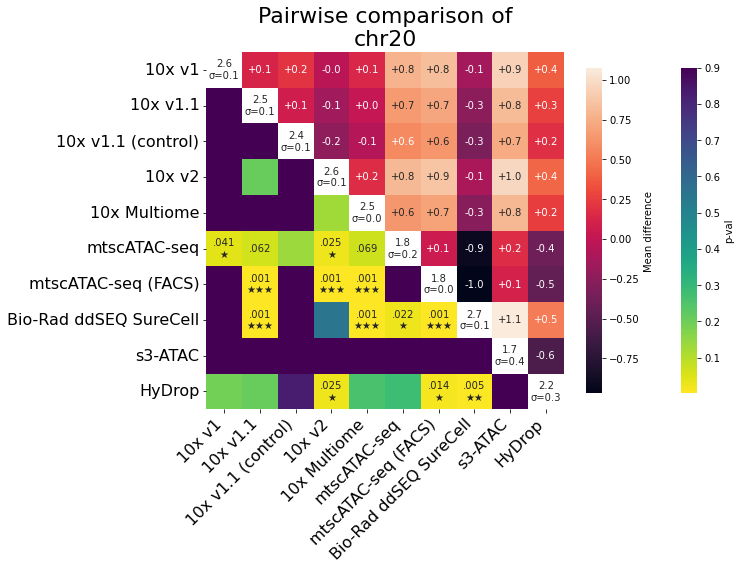

chr21
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.

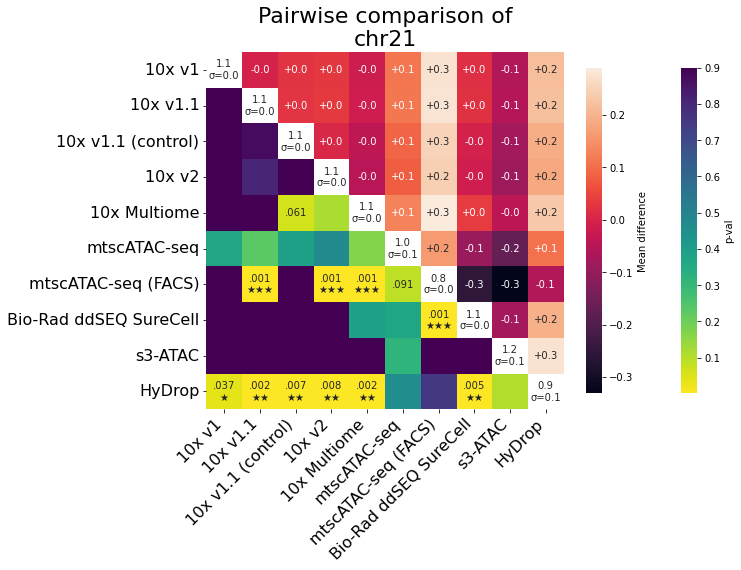

chr22
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val

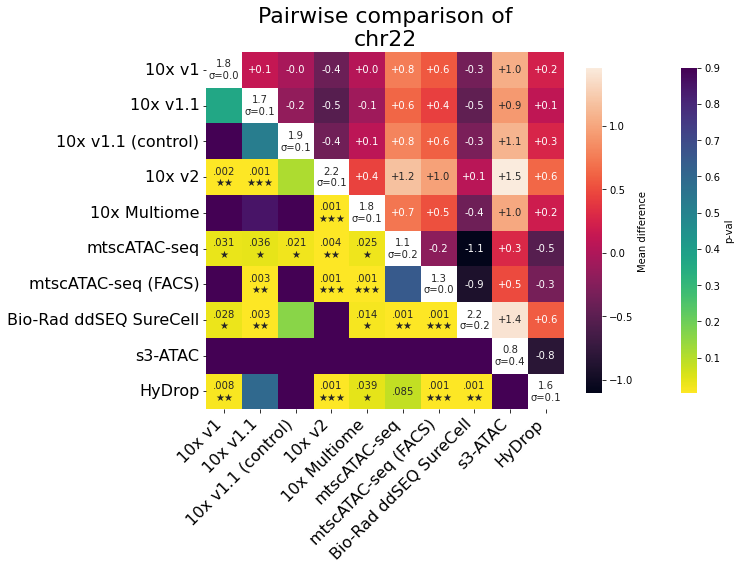

chr3
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred 

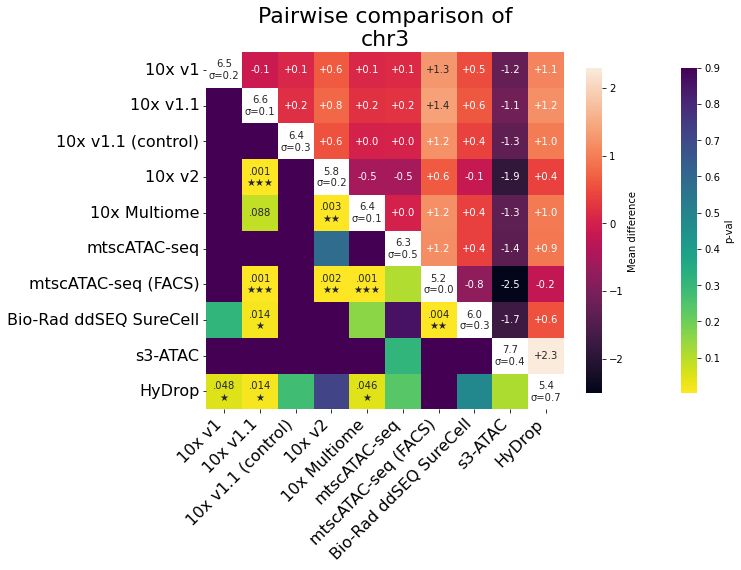

chr4
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
ex

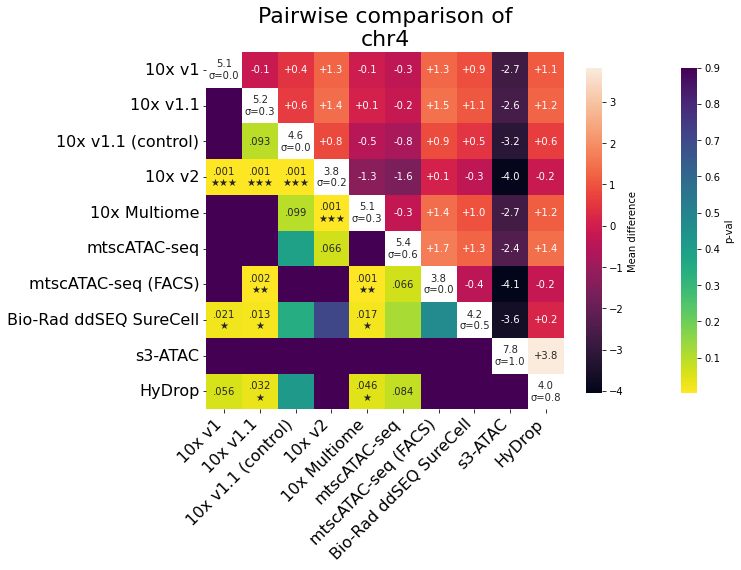

chr5
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
ex

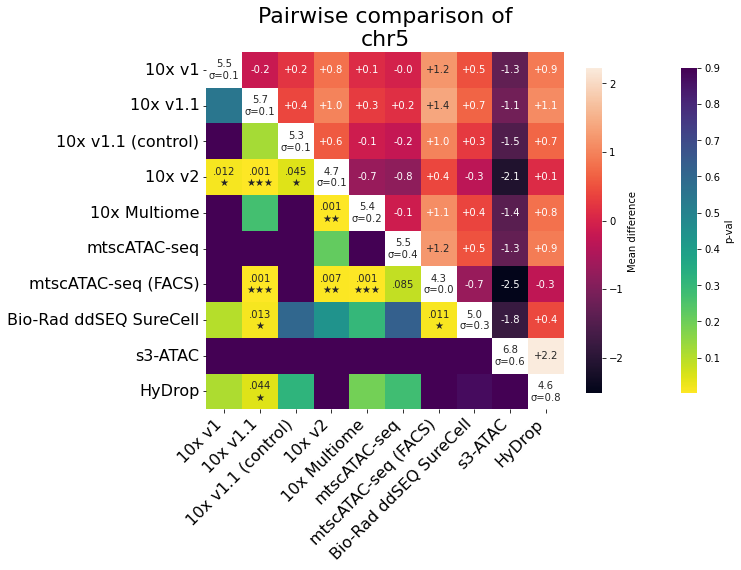

chr6
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
excepti

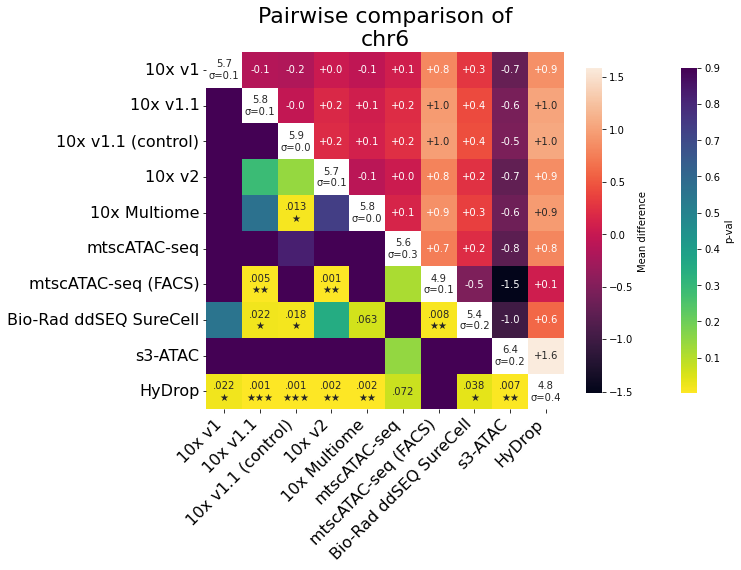

chr7
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception 

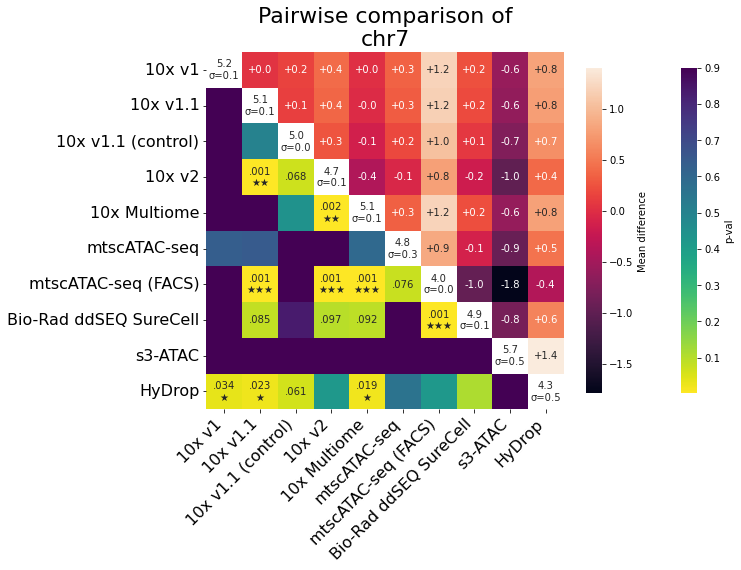

chr8
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occu

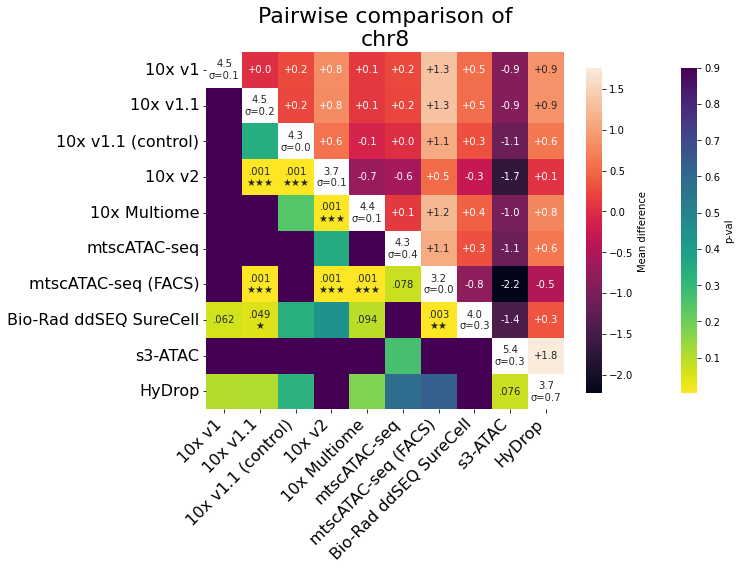

chr9
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples 

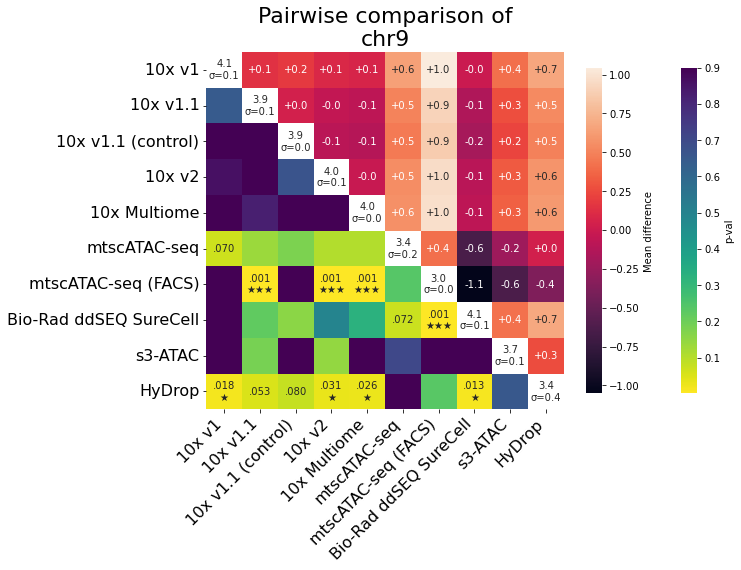

chrM
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 

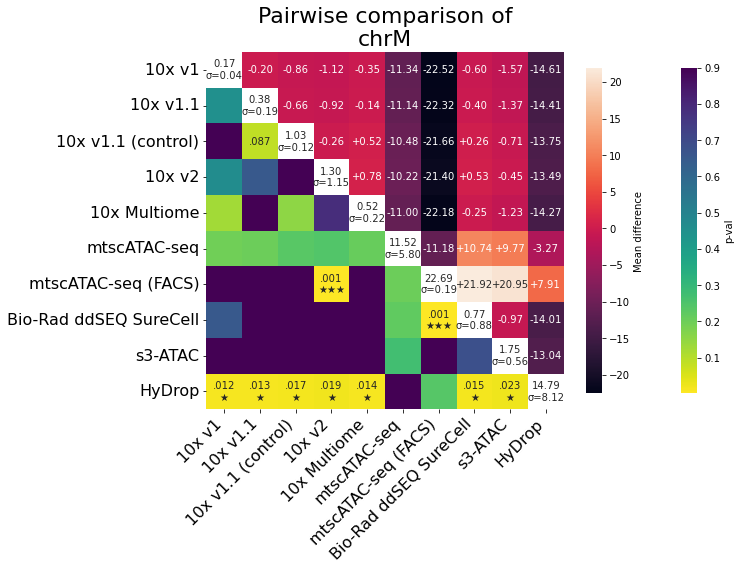

chrX
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


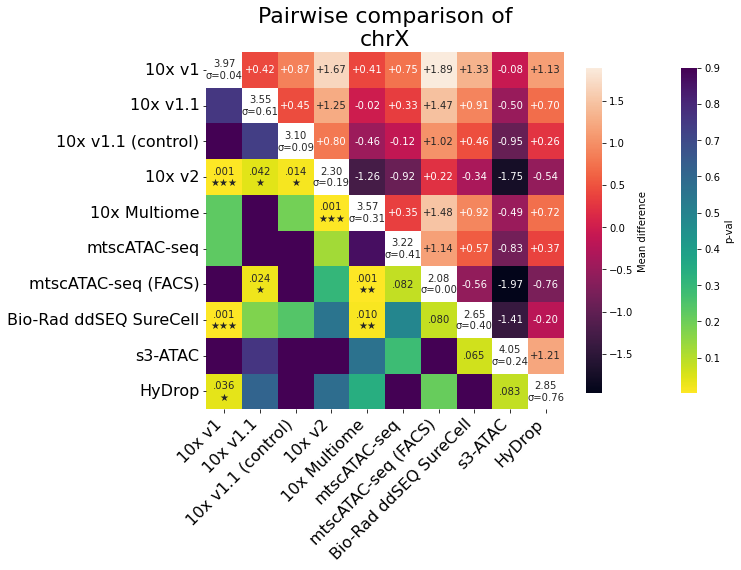

chrY
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace

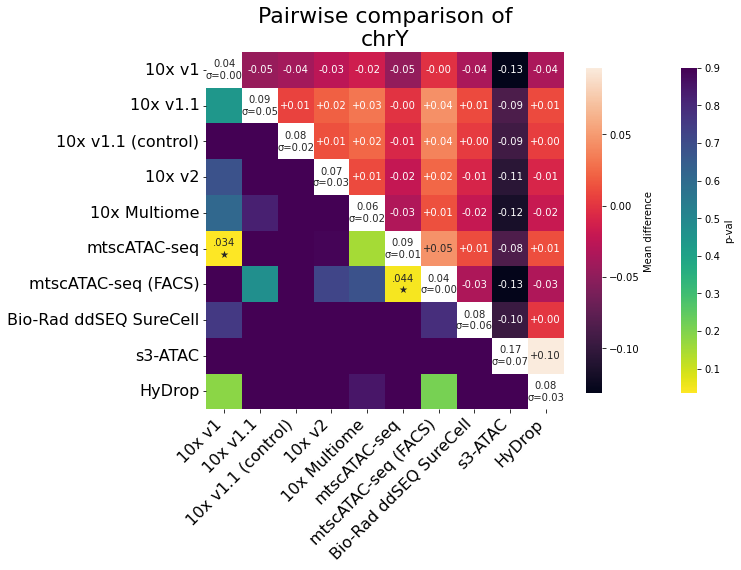

common_doublets
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val

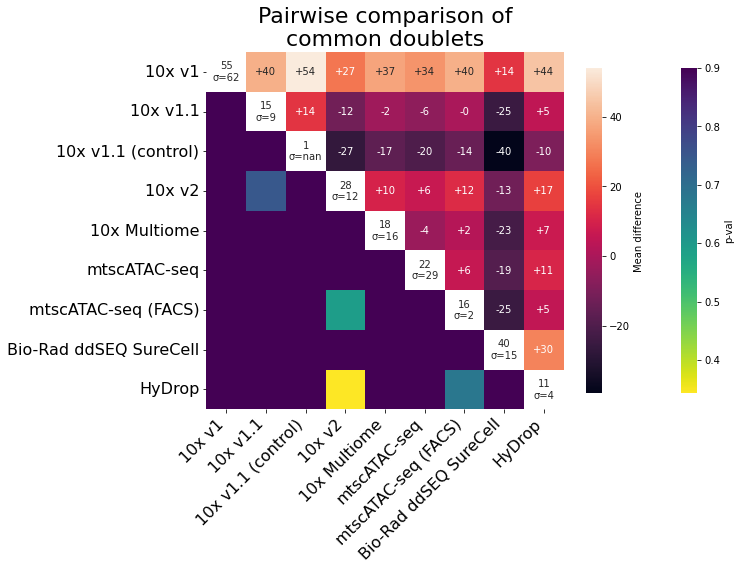

common_doublets_pct
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val wi

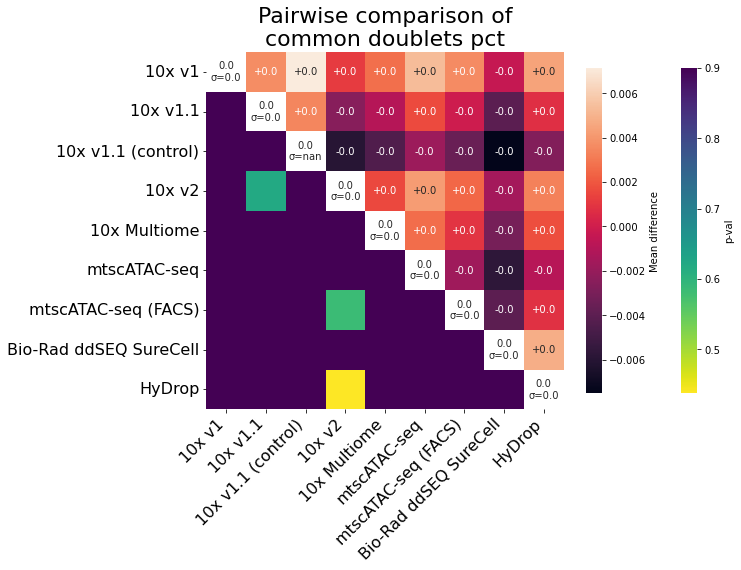

common_doublets_pct_of_doublets
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'm

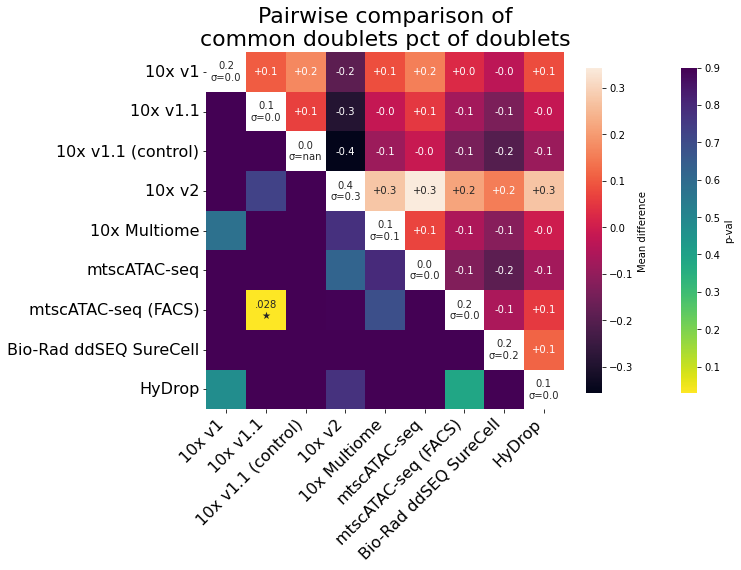

distal
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9

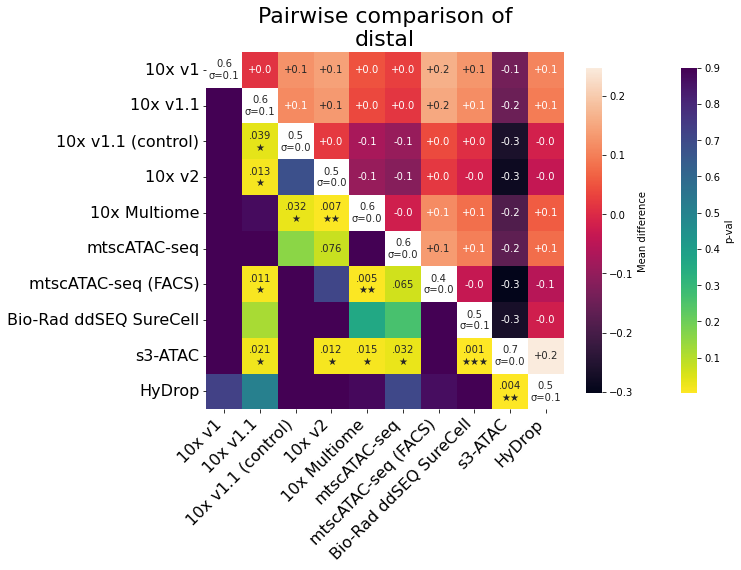

efficiency
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> replace p_v

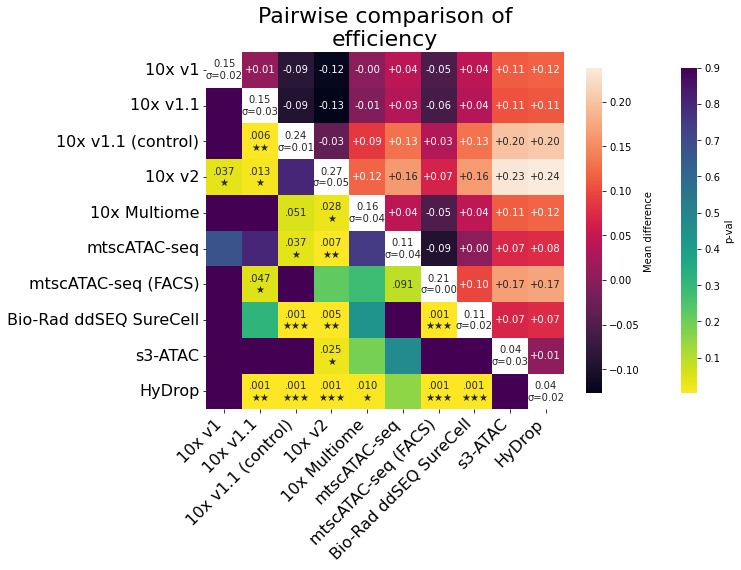

fmx_best_llk
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n <

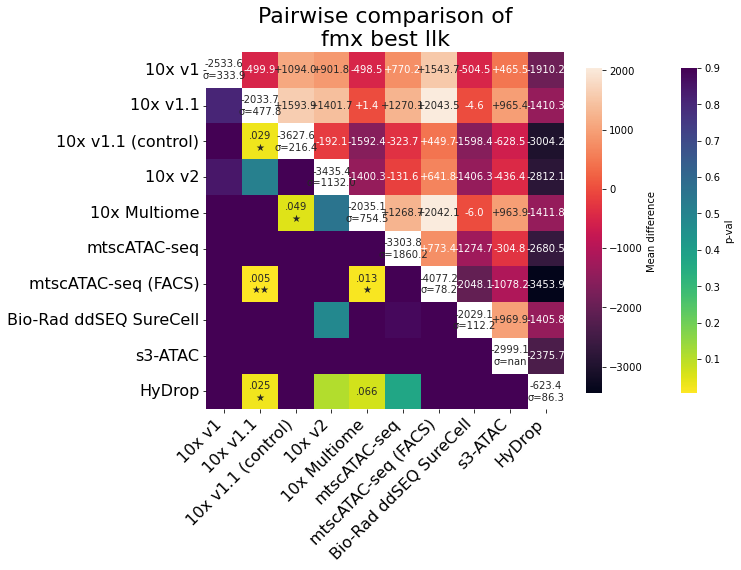

fmx_exclusive_doublets
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_va

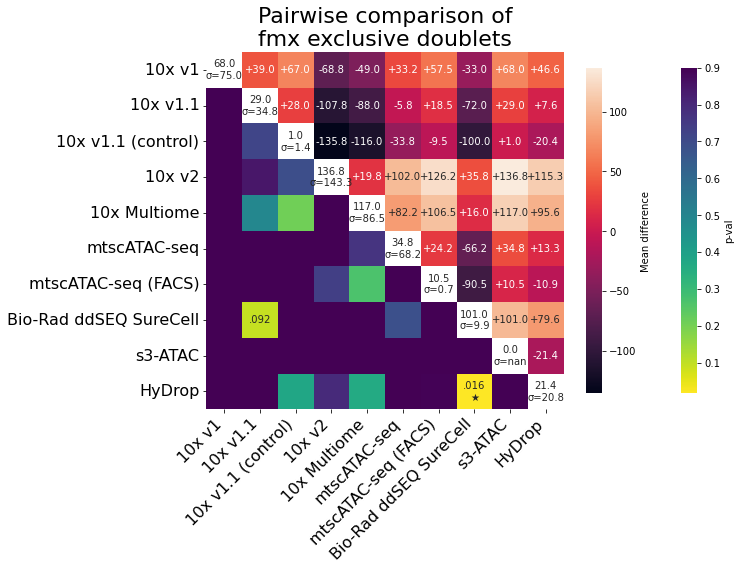

fmx_exclusive_doublets_pct
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! s

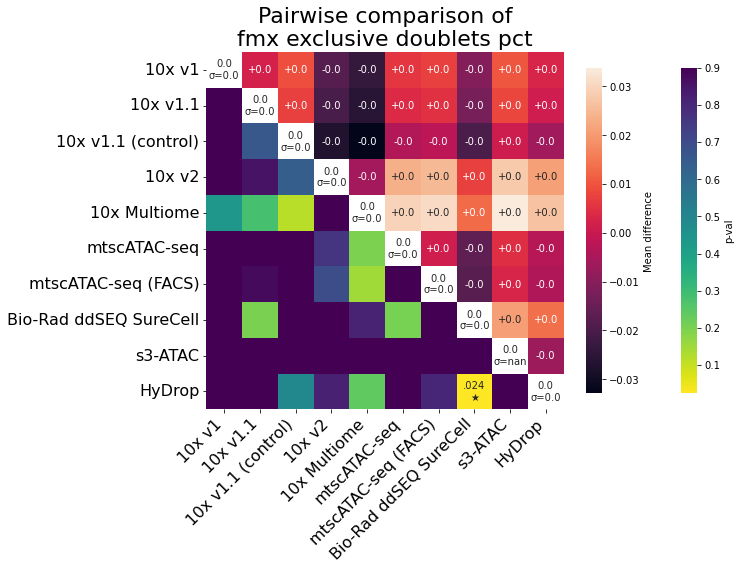

fmx_n_snps
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 

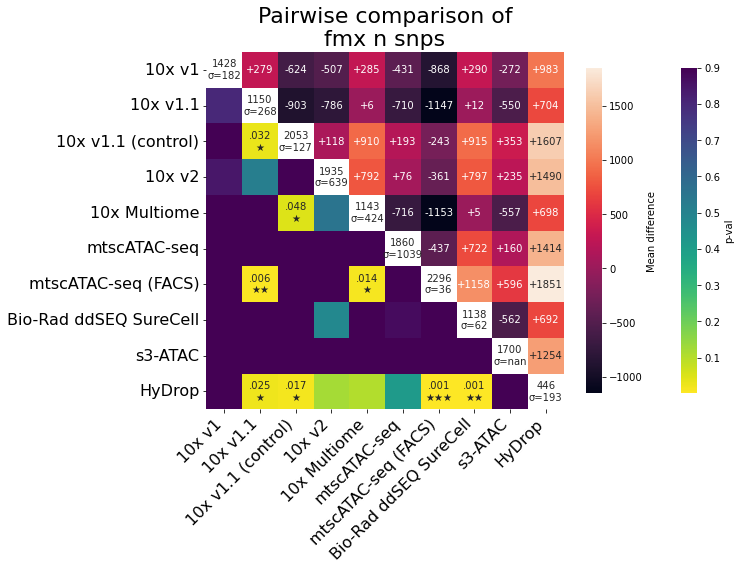

frac_barcodes_merged
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9


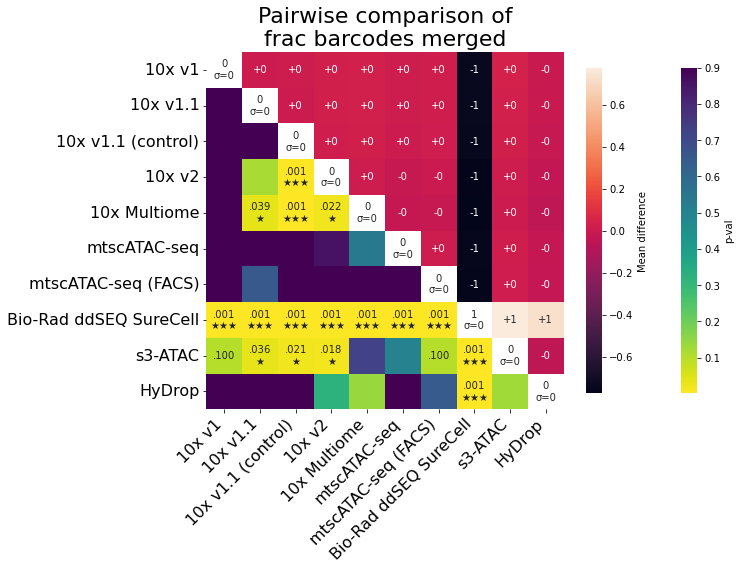

log_median_unique_nr_frag_in_regions
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n <

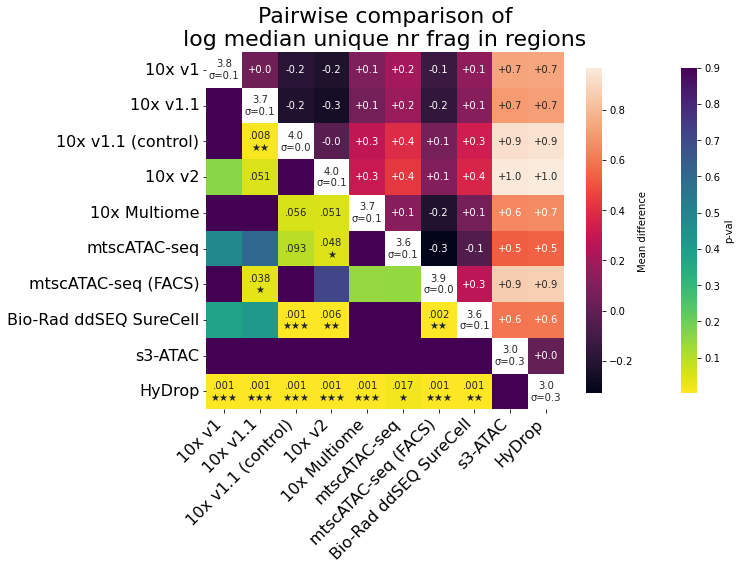

mean_bot20dars_recovery
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> r

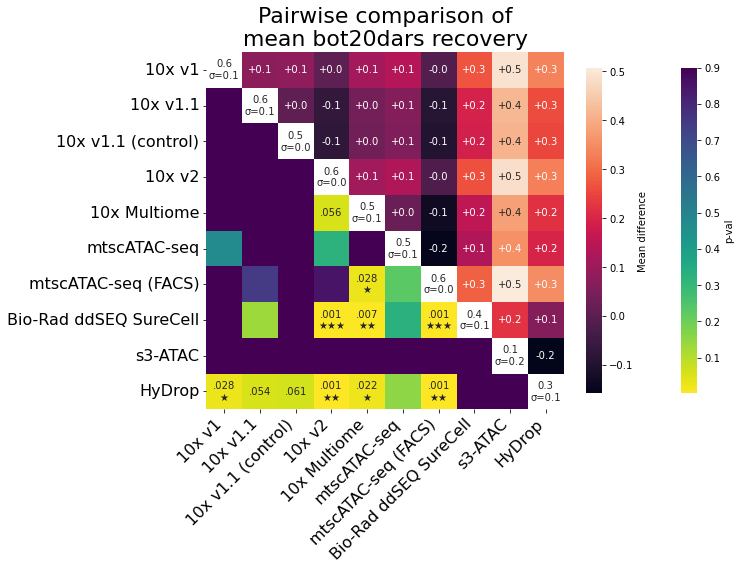

mean_bot20peaks_recovery
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCel

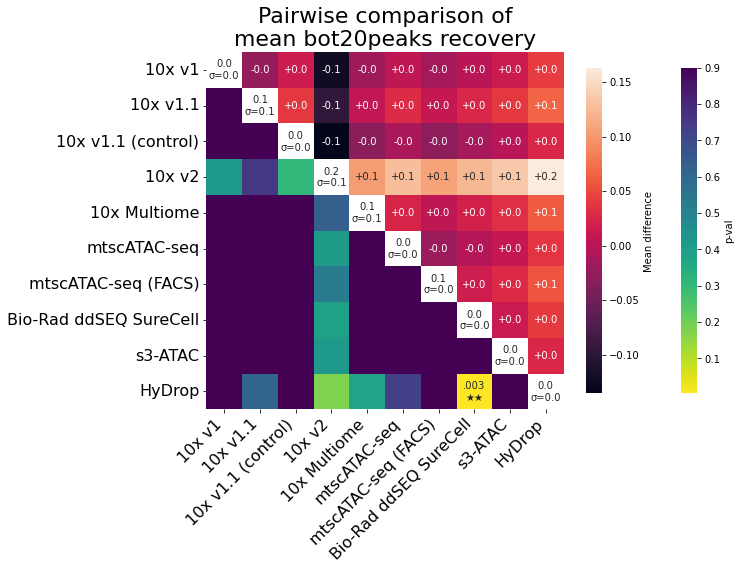

mean_top20dars_recovery
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> replac

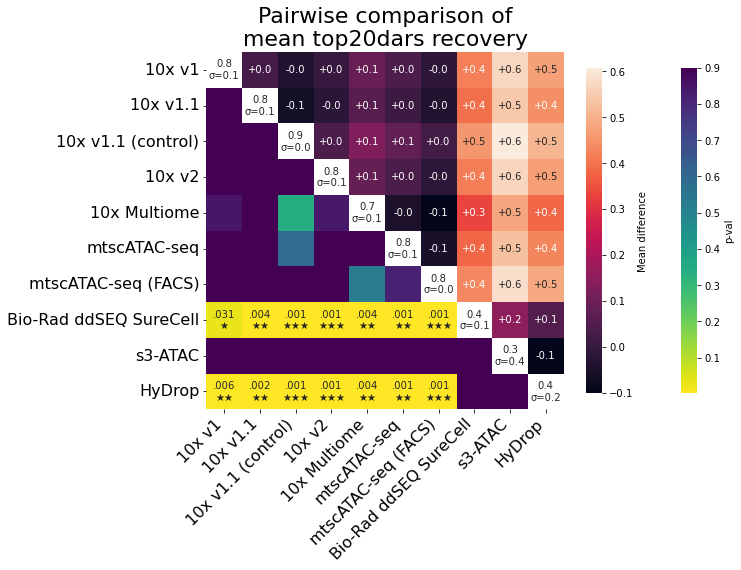

mean_top20peaks_recovery
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_

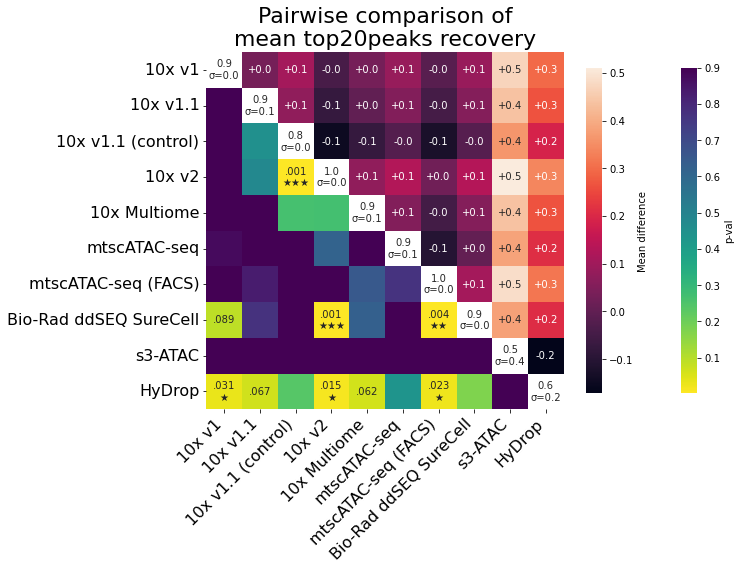

median_frag_dist_nearest_tss
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
excep

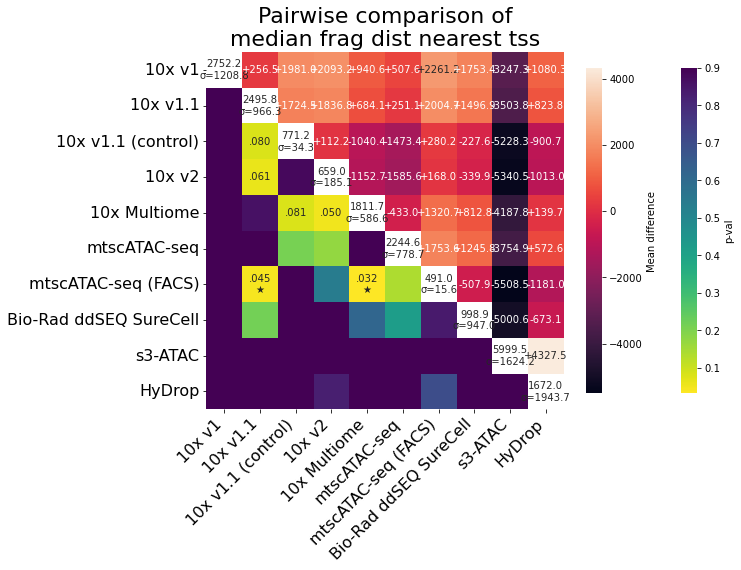

median_frag_len
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


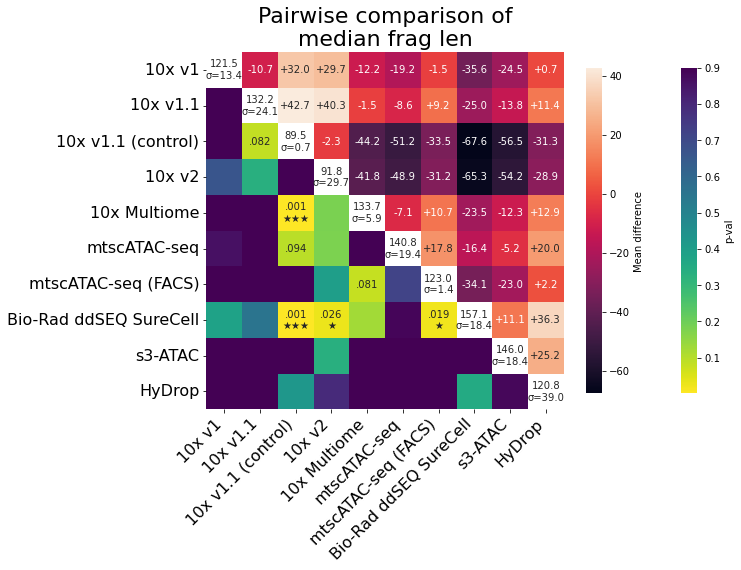

median_log10_frag_dist_nearest_tss
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p

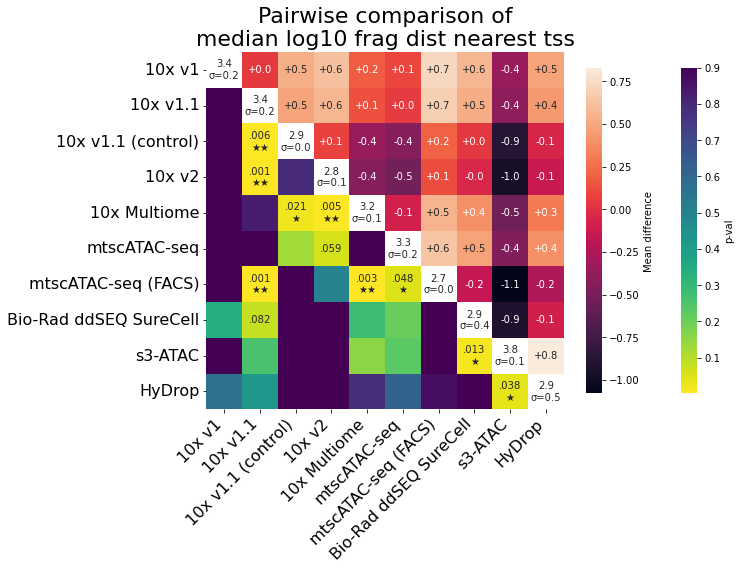

mononucleosomal
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> repla

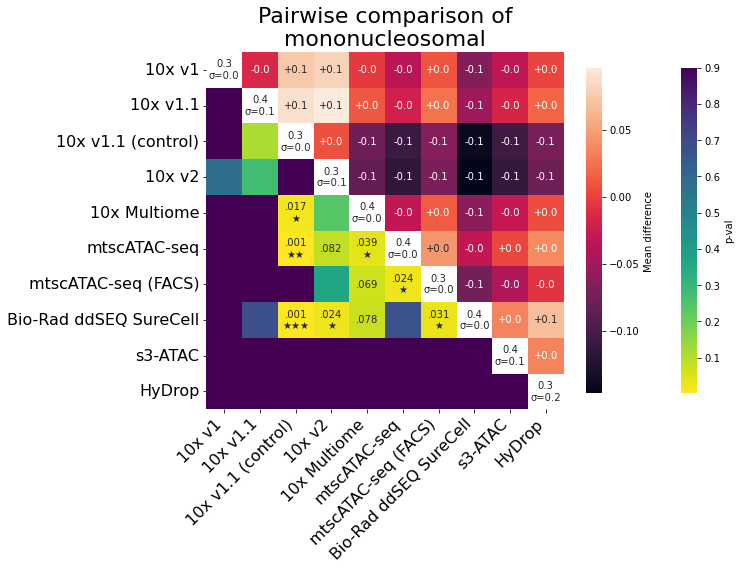

mononucleosomal_distal
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception o

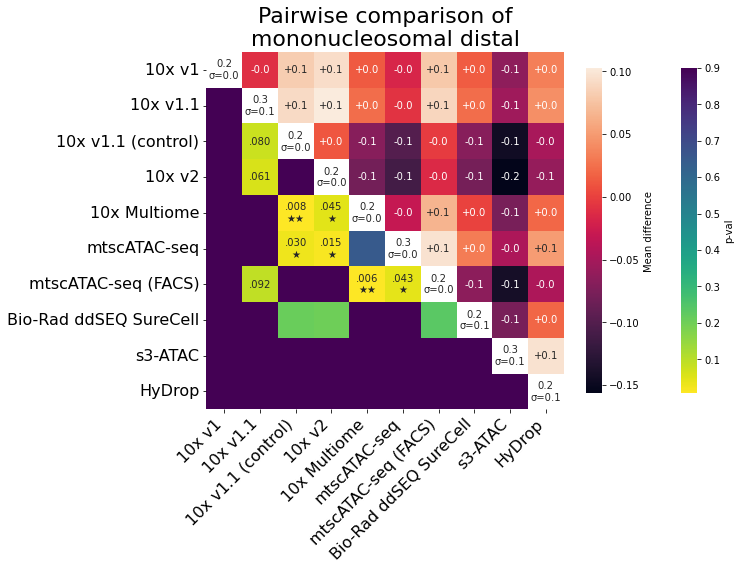

mononucleosomal_proximal
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


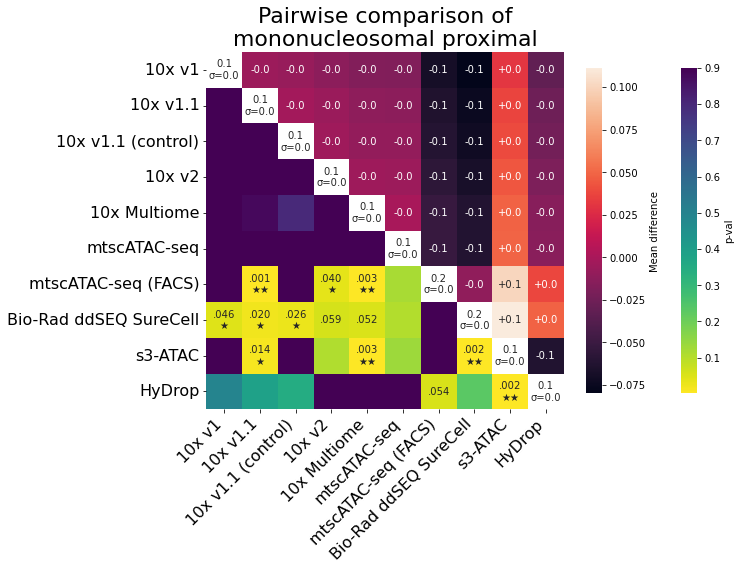

multinucleosomal
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


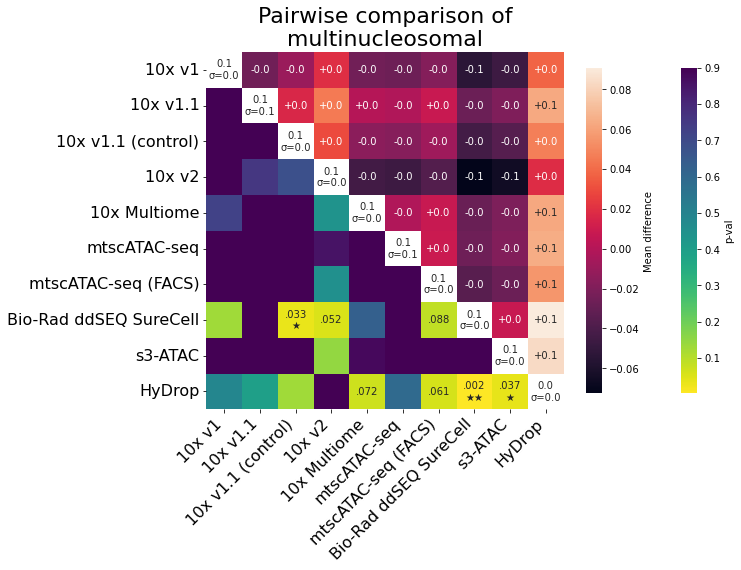

multinucleosomal_distal
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


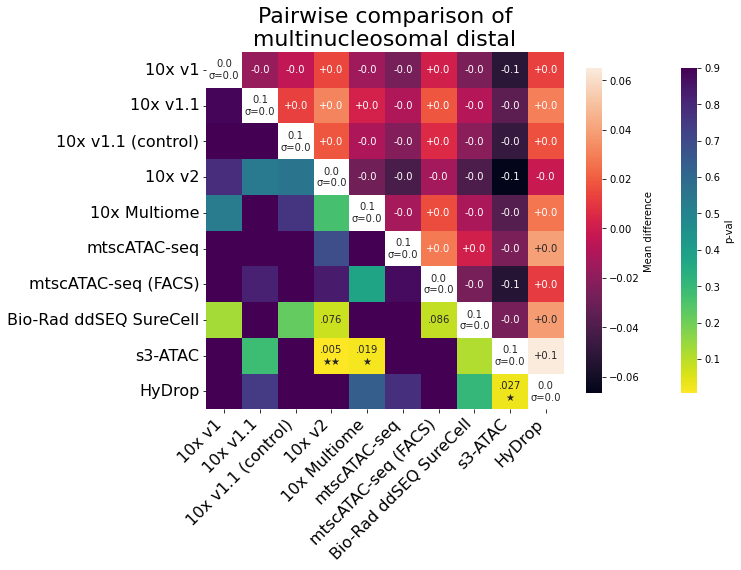

multinucleosomal_proximal
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


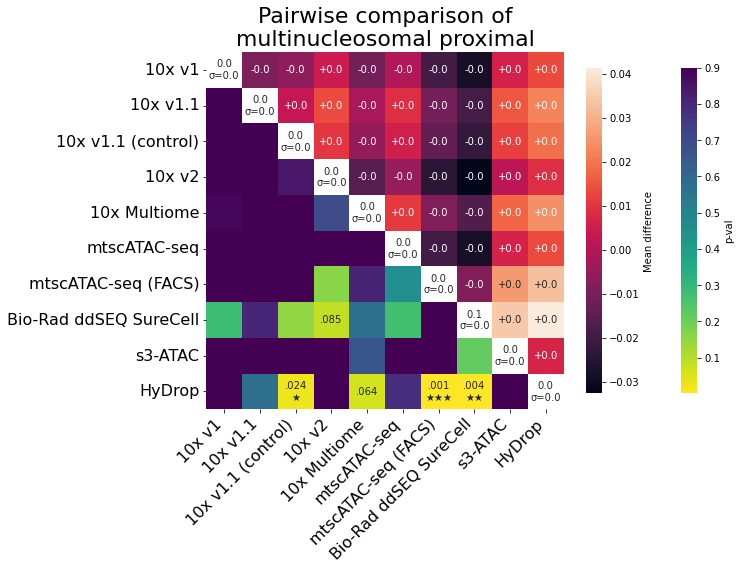

n_barcodes_merged
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9


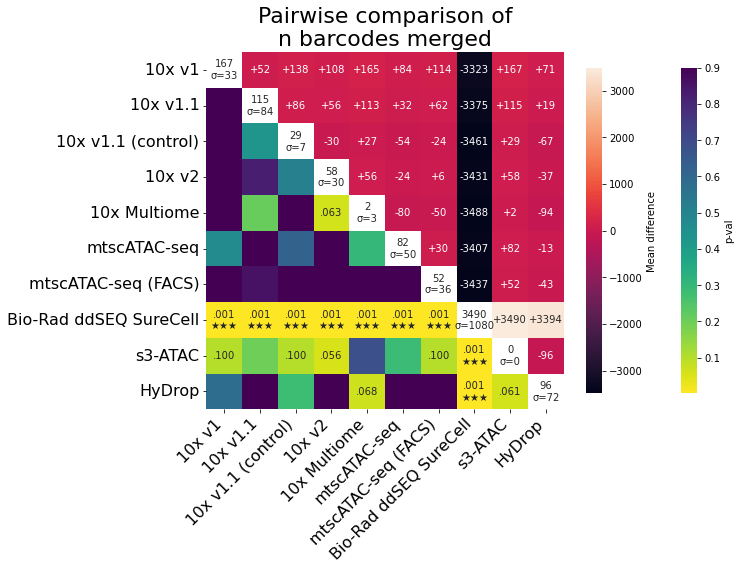

n_dars__B_cell
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some

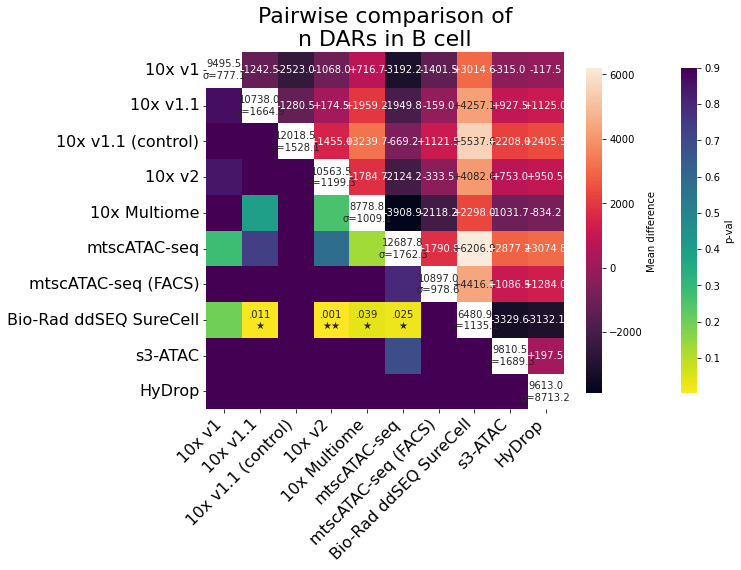

n_dars__B_cell_thousands
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCe

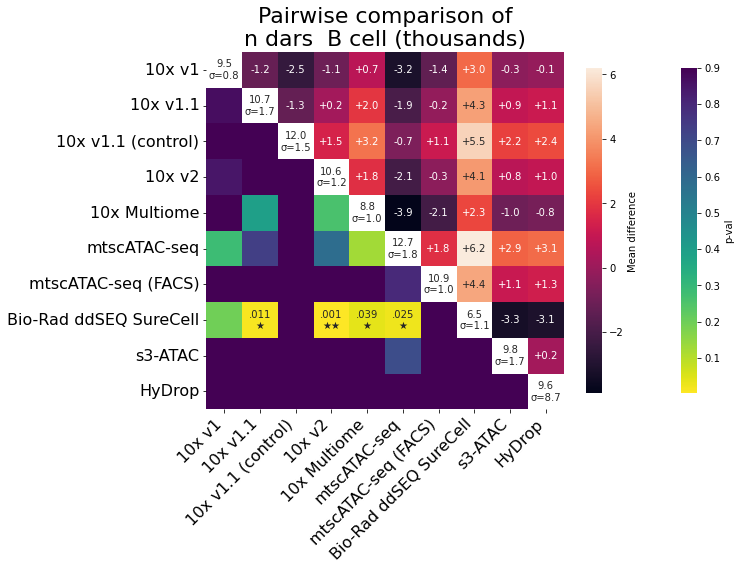

n_dars__CD14+_monocyte
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_va

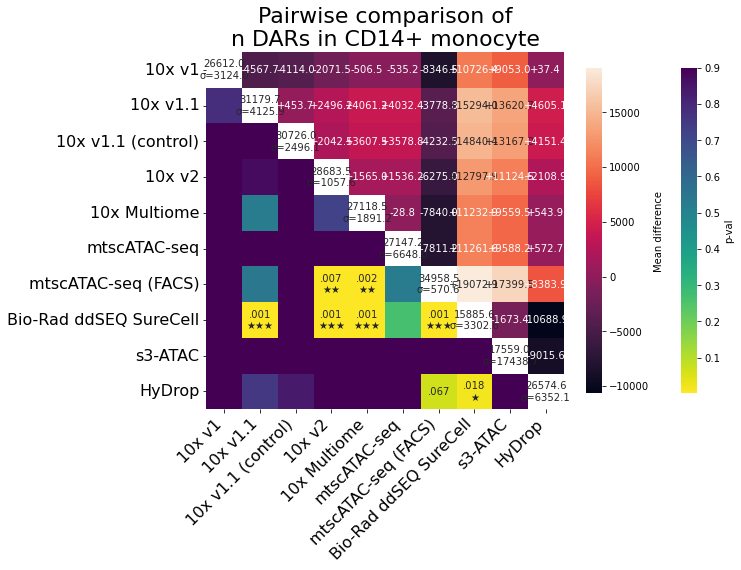

n_dars__CD14+_monocyte_thousands
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> re

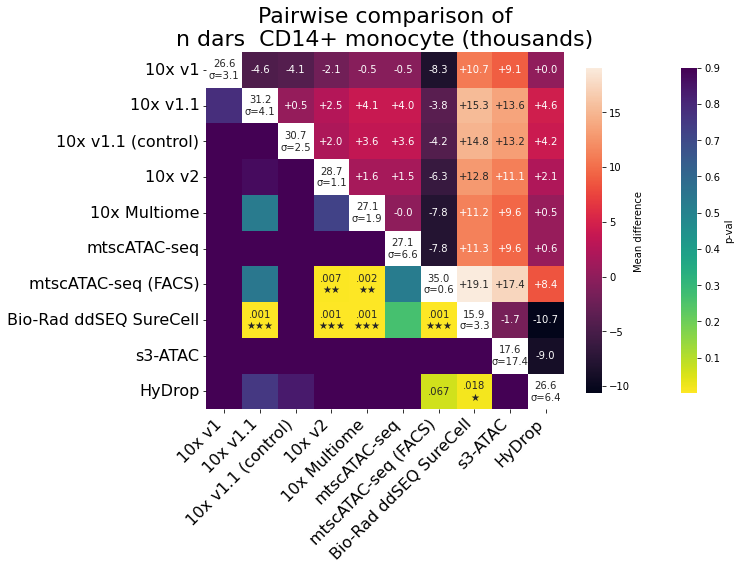

n_dars__CD16+_monocyte
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace 

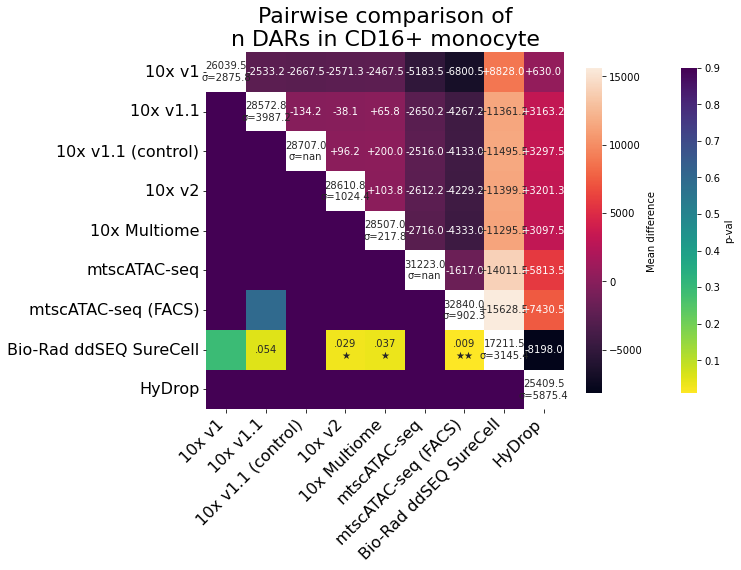

n_dars__CD16+_monocyte_thousands
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --

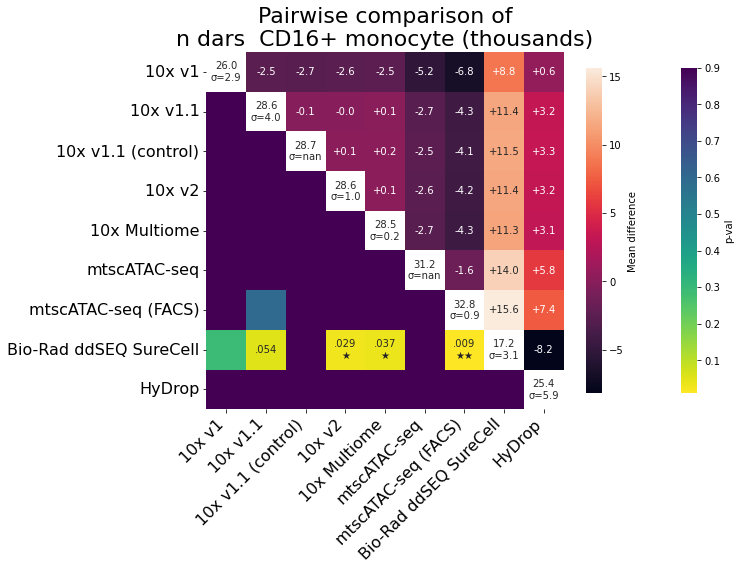

n_dars__CD4+_T_cell
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samp

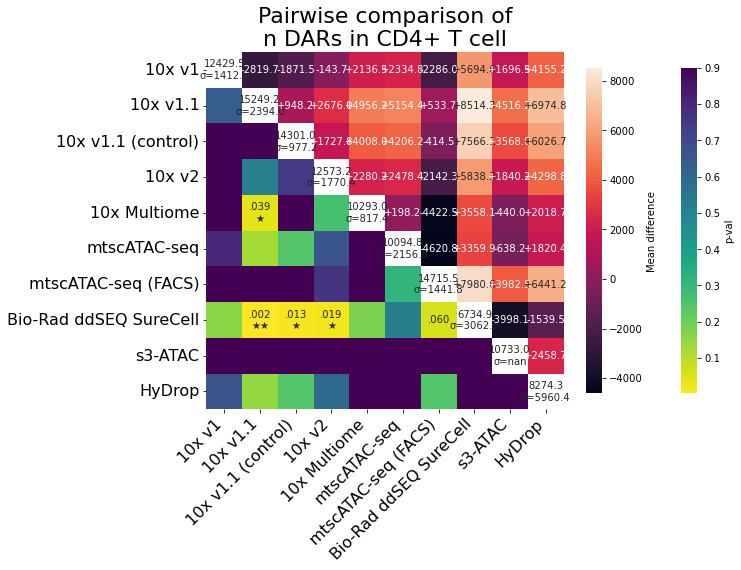

n_dars__CD4+_T_cell_thousands
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')!

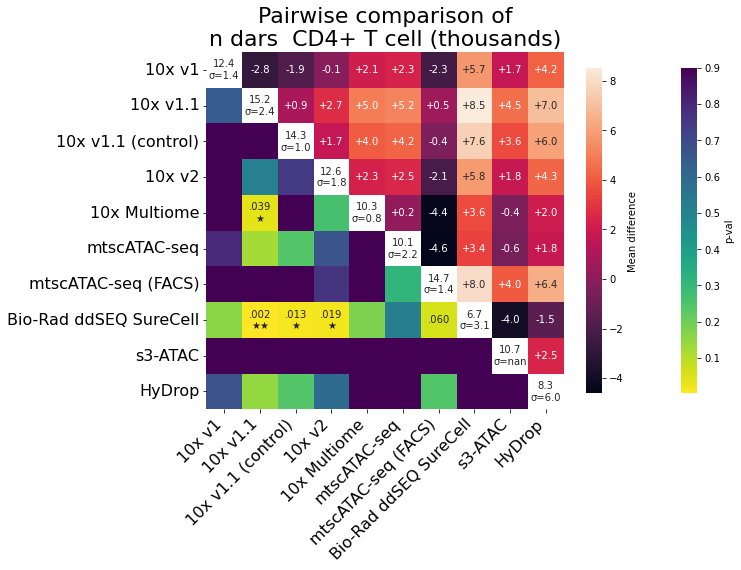

n_dars__Cytotoxic_T_cell
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p

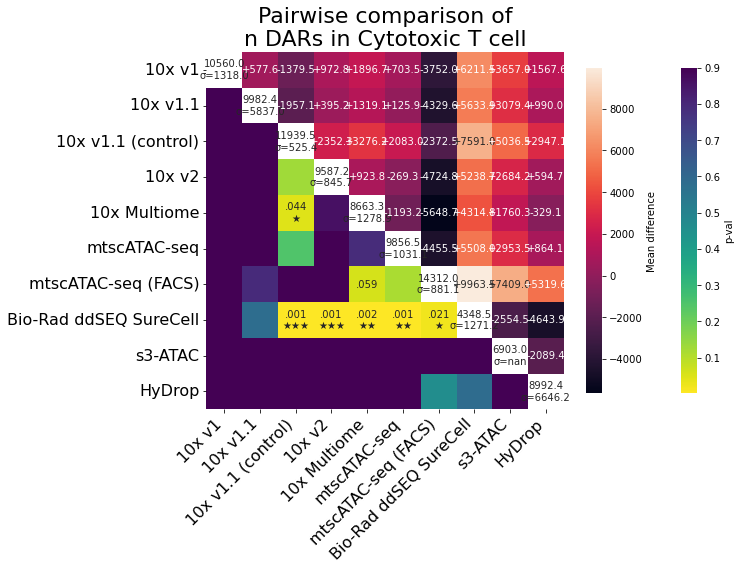

n_dars__Cytotoxic_T_cell_thousands
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 -->

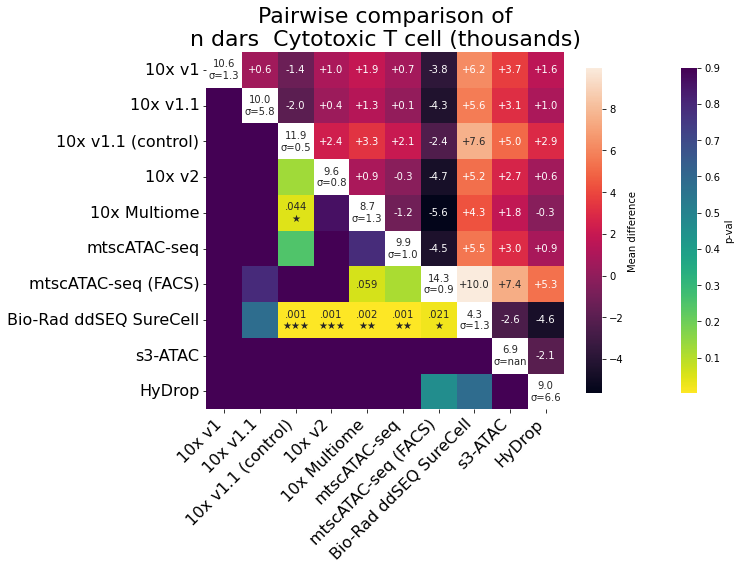

n_dars__Dendritic_cell
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val w

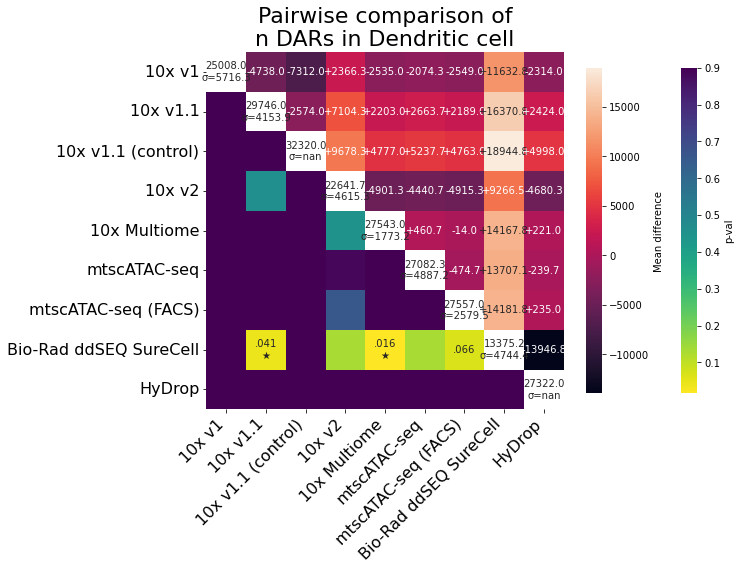

n_dars__Dendritic_cell_thousands
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> repla

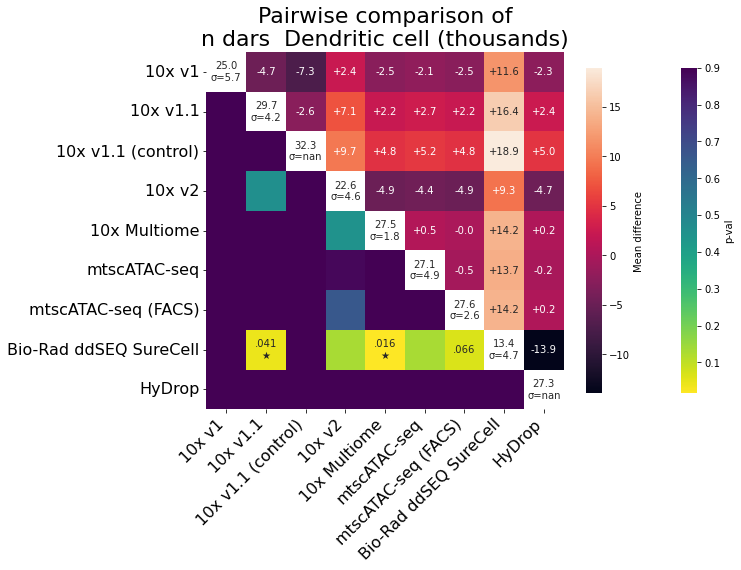

n_dars__Natural_killer_cell
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val

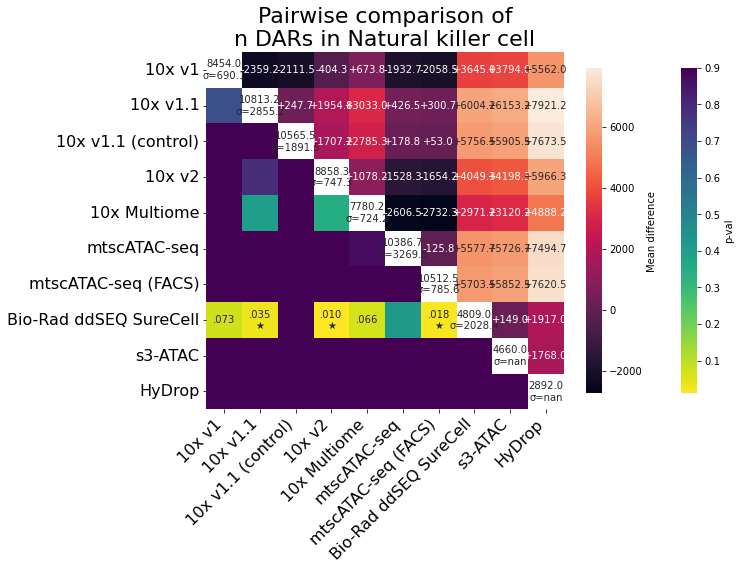

n_dars__Natural_killer_cell_thousands
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> rep

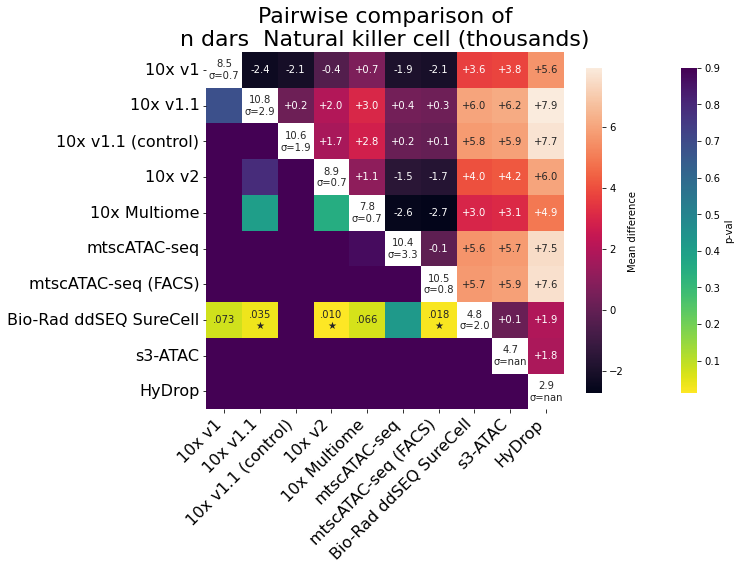

n_peaks__Bcell
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> repl

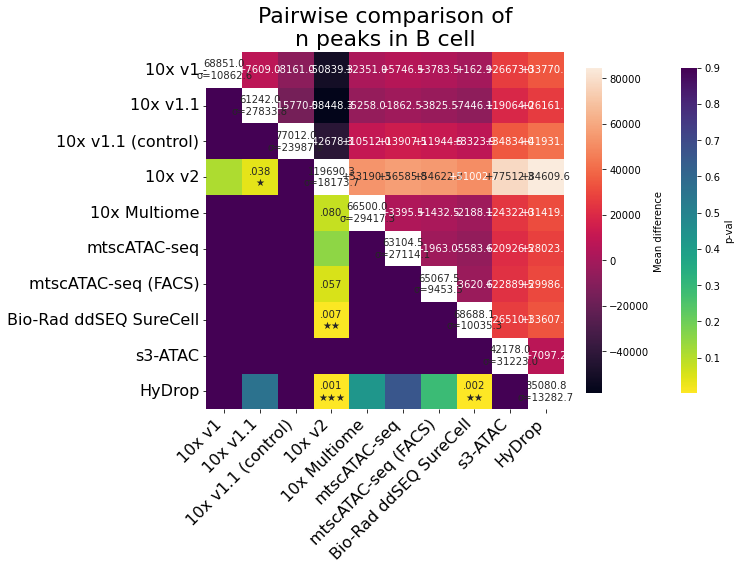

n_peaks__Bcell_thousands
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 

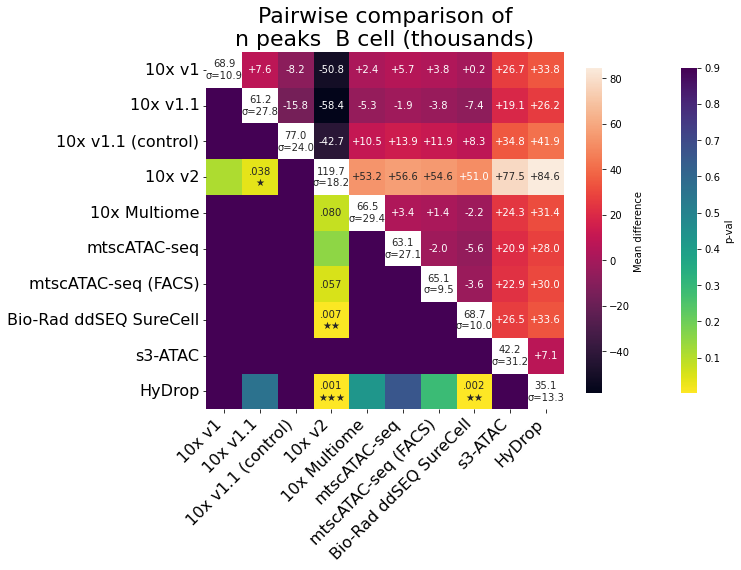

n_peaks__CD14_monocyte
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurre

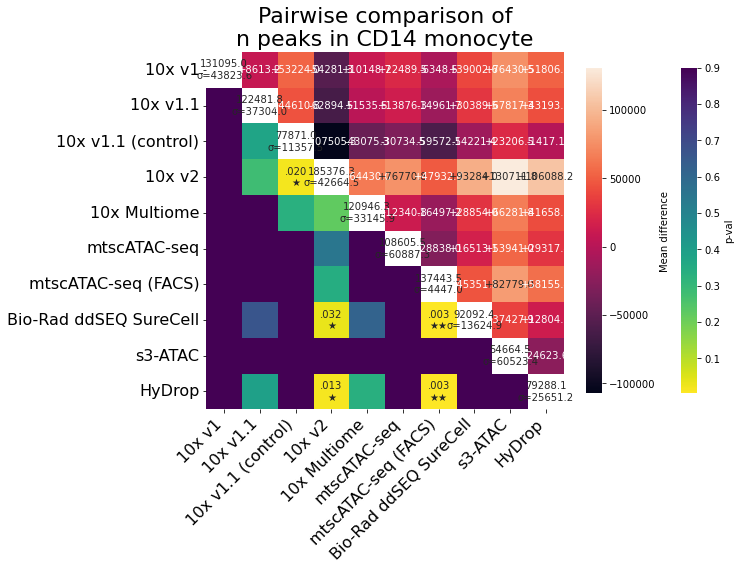

n_peaks__CD14_monocyte_thousands
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
excepti

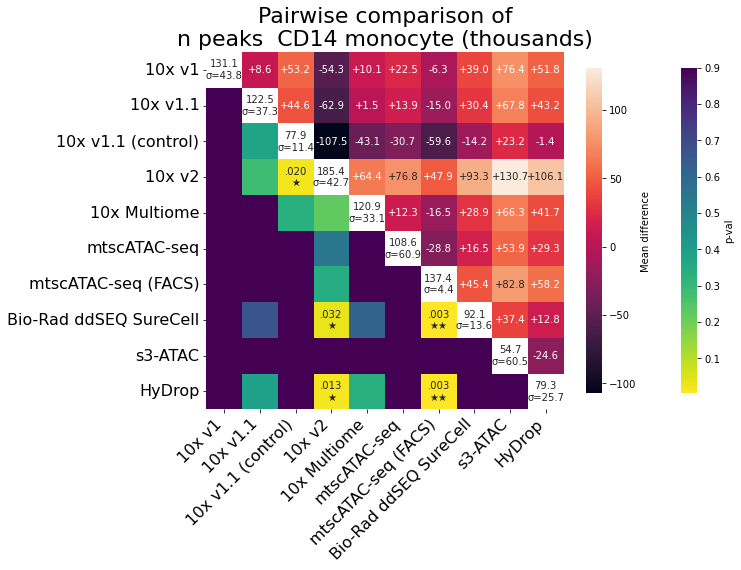

n_peaks__CD16_monocyte
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n

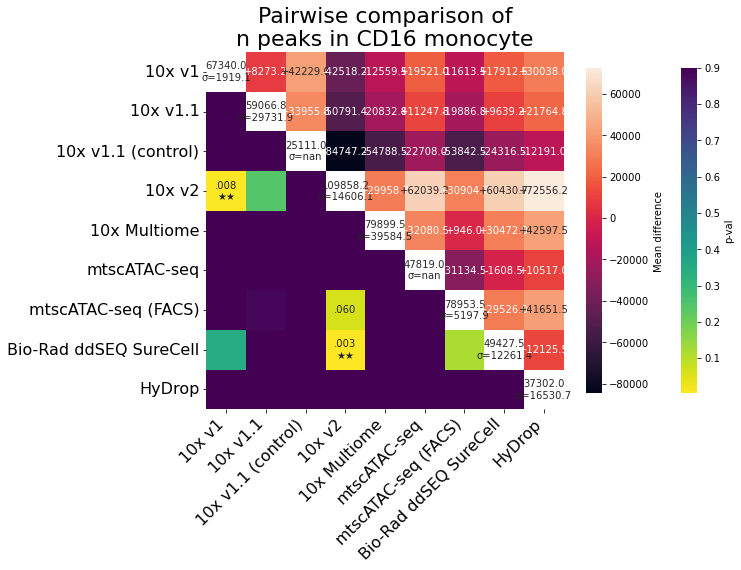

n_peaks__CD16_monocyte_thousands
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some

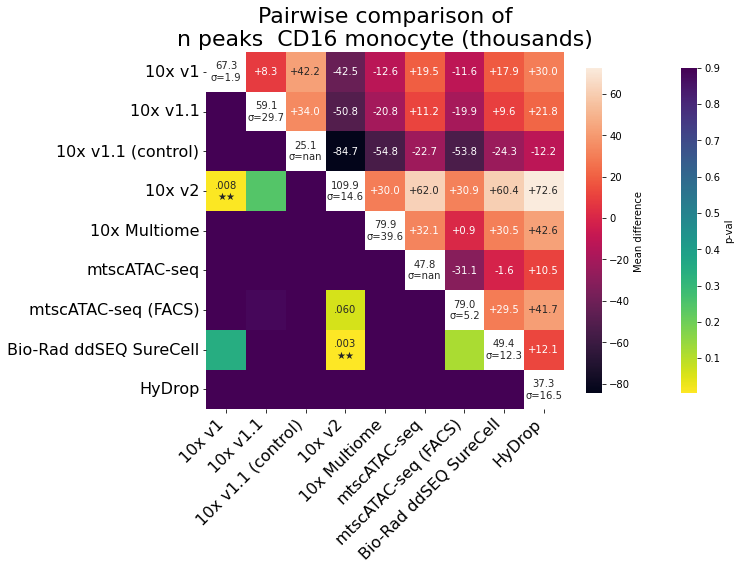

n_peaks__CD4_Tcell
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n 

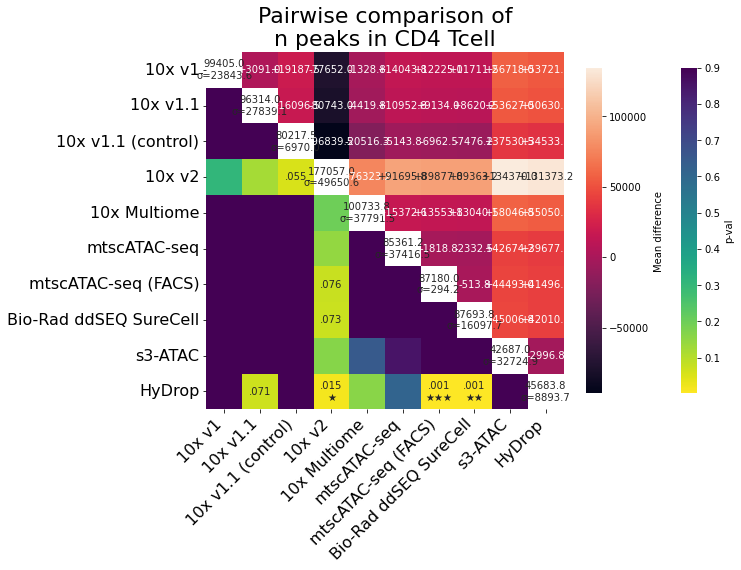

n_peaks__CD4_Tcell_thousands
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some 

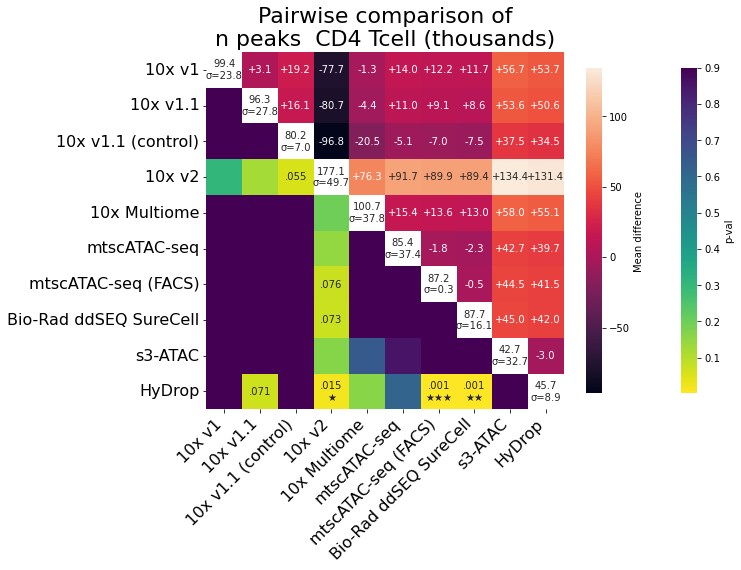

n_peaks__CytotoxicTcell
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-A

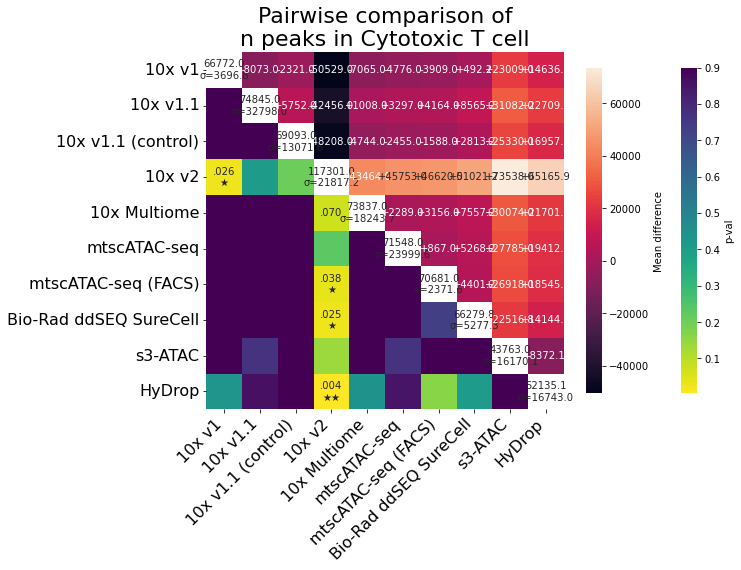

n_peaks__CytotoxicTcell_thousands
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDr

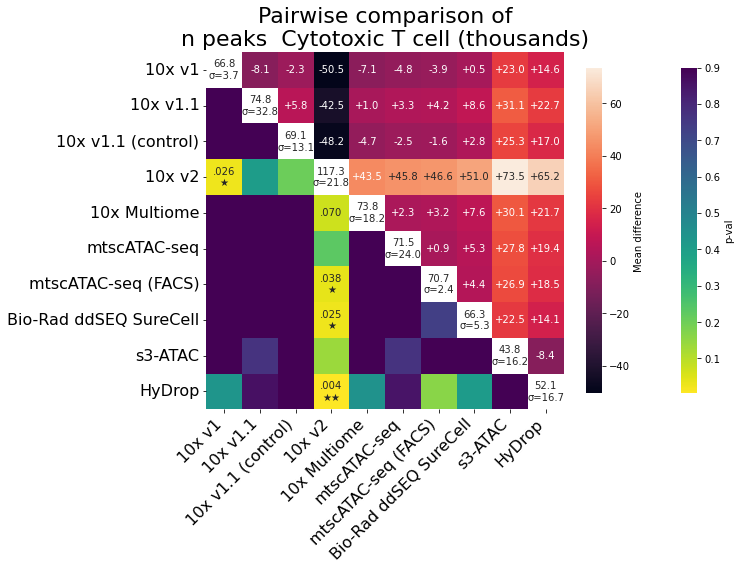

n_peaks__Dendriticcell
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some sample

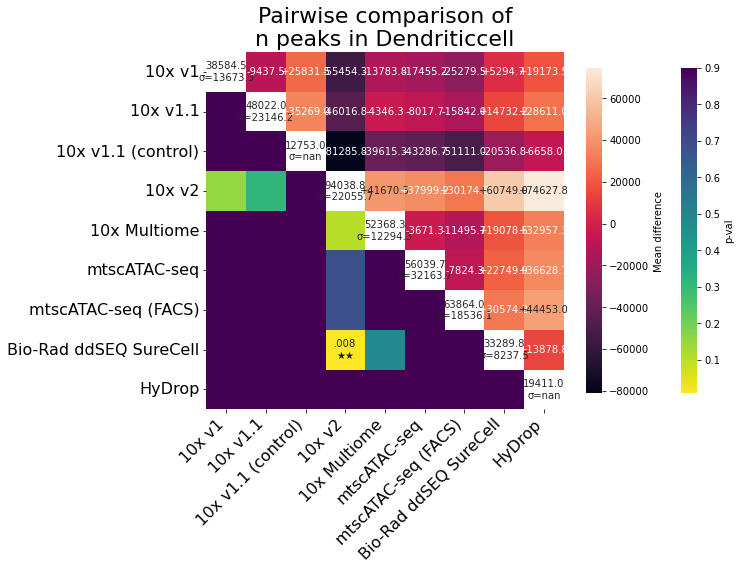

n_peaks__Dendriticcell_thousands
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! s

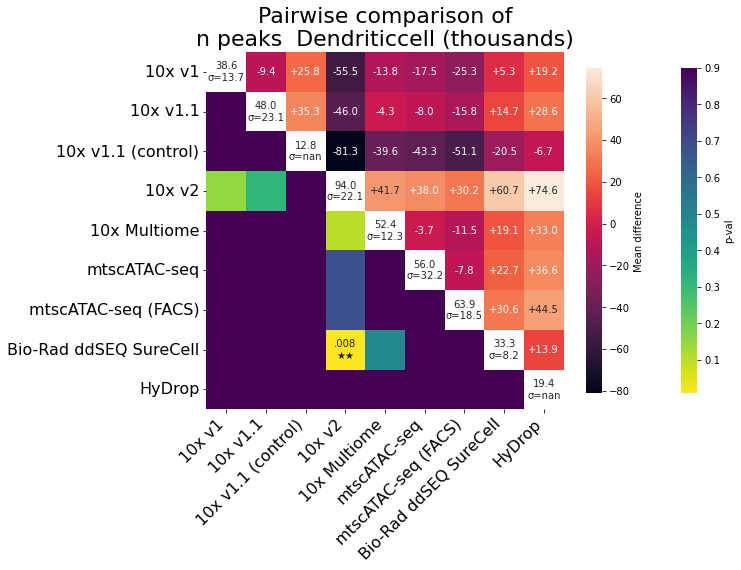

n_peaks__Naturalkillercell
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> replace p_va

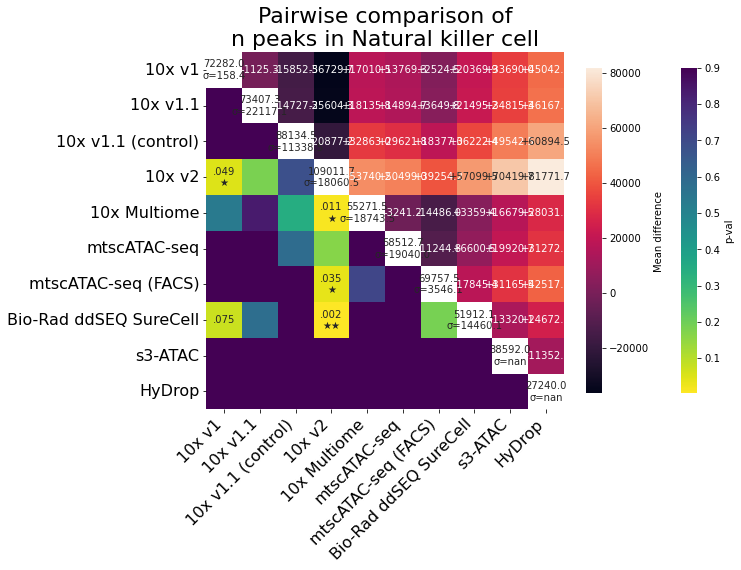

n_peaks__Naturalkillercell_thousands
exception occurred in ('10x Multiome', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'HyDrop')! some samples n < 2 --> re

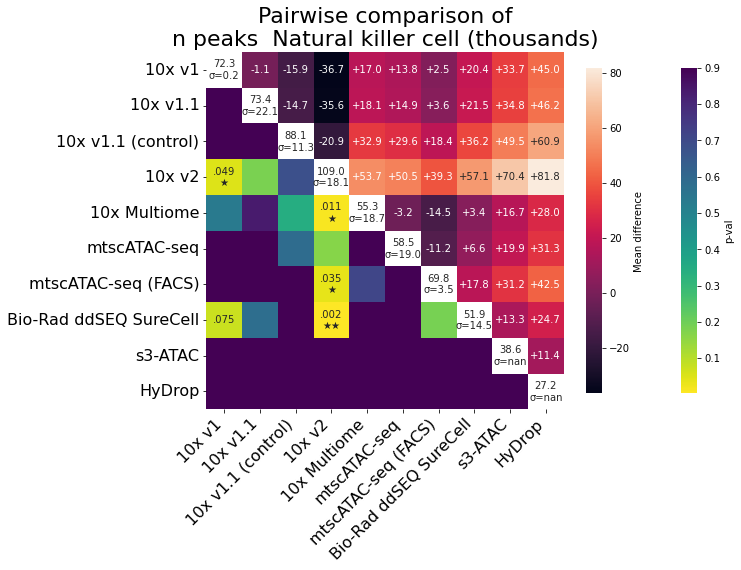

nonstandard
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replac

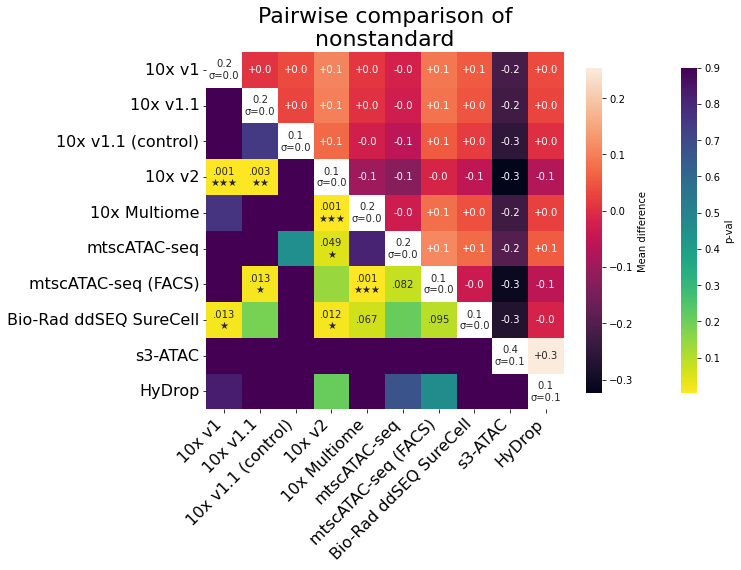

nucleosome-free
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq', 's3-ATAC')! some samples n < 2 --> rep

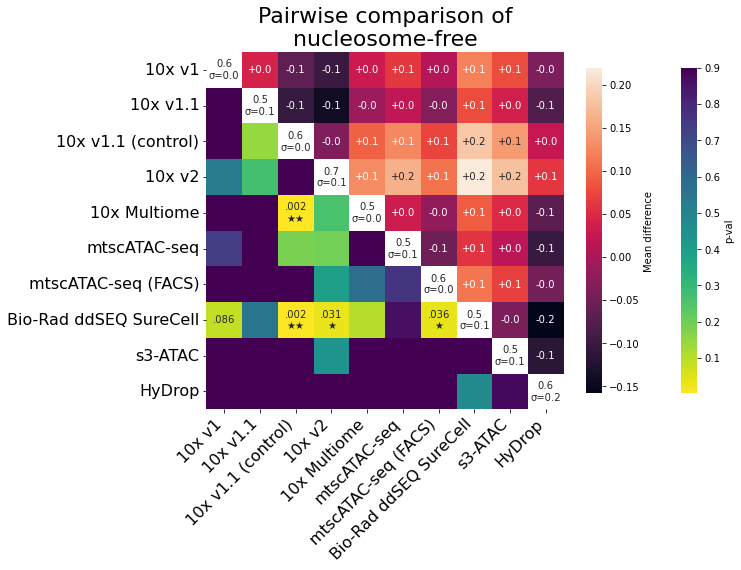

nucleosome-free_distal
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> replace

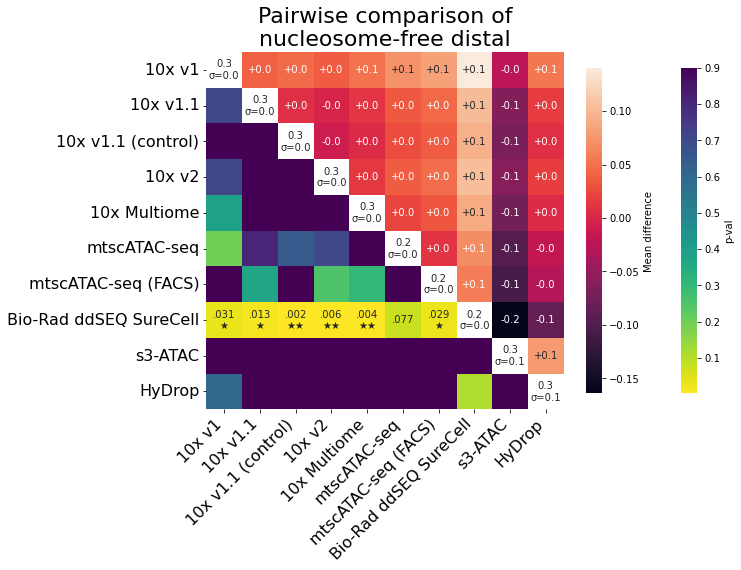

nucleosome-free_proximal
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some sam

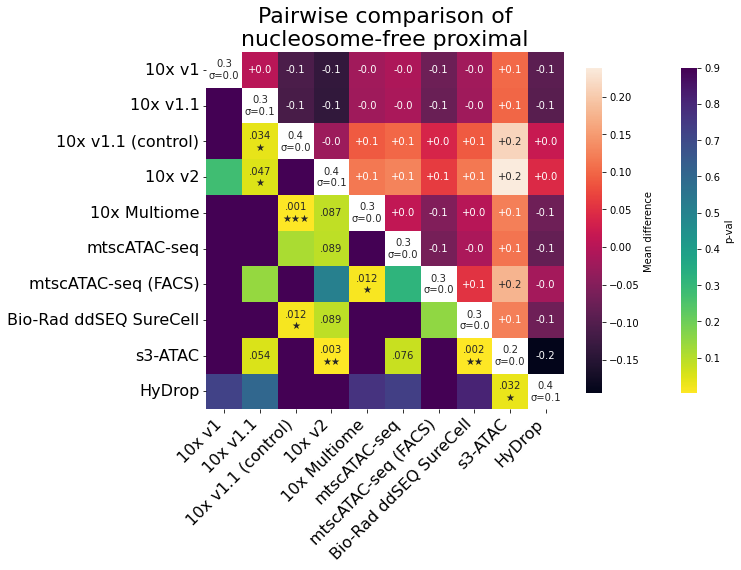

pct_consensus_cells__B_cell
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace 

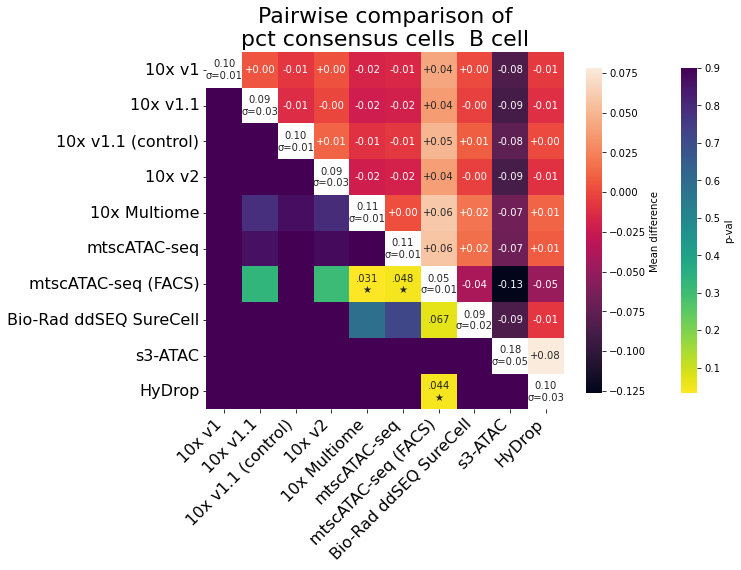

pct_consensus_cells__CD14+_monocyte
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq', 's3-ATAC')! some samples 

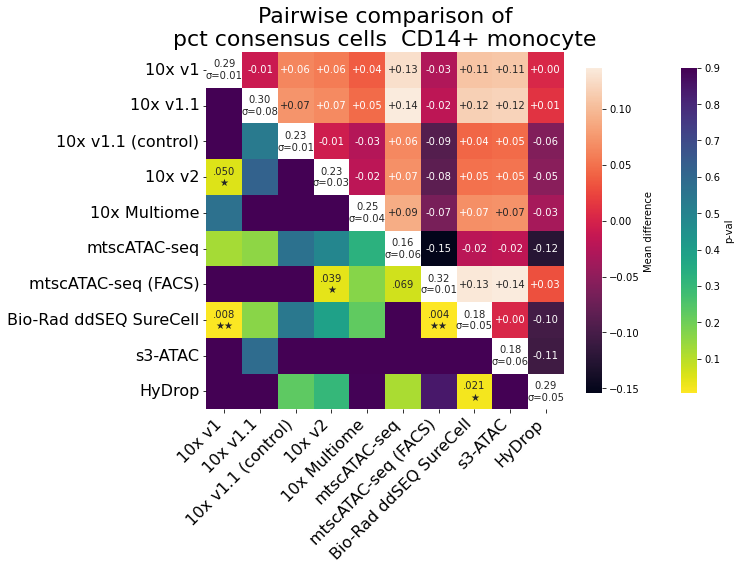

pct_consensus_cells__CD16+_monocyte
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


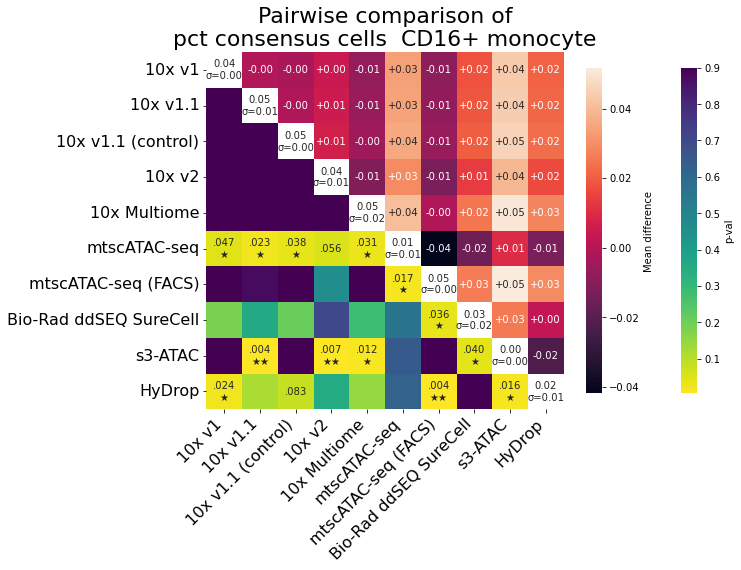

pct_consensus_cells__CD4+_T_cell
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> rep

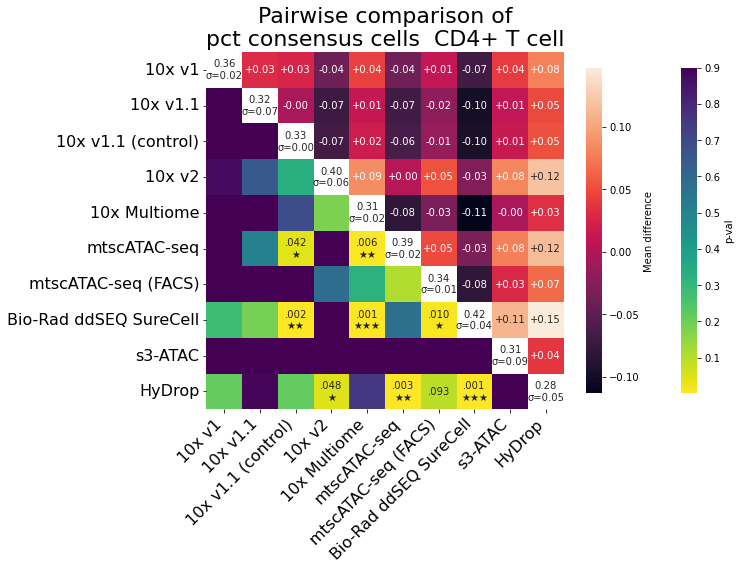

pct_consensus_cells__Cytotoxic_T_cell
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n 

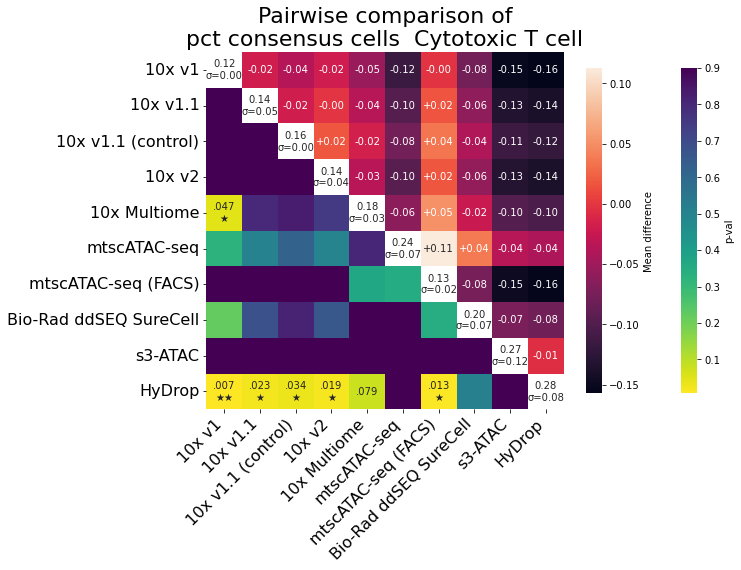

pct_consensus_cells__Dendritic_cell
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 

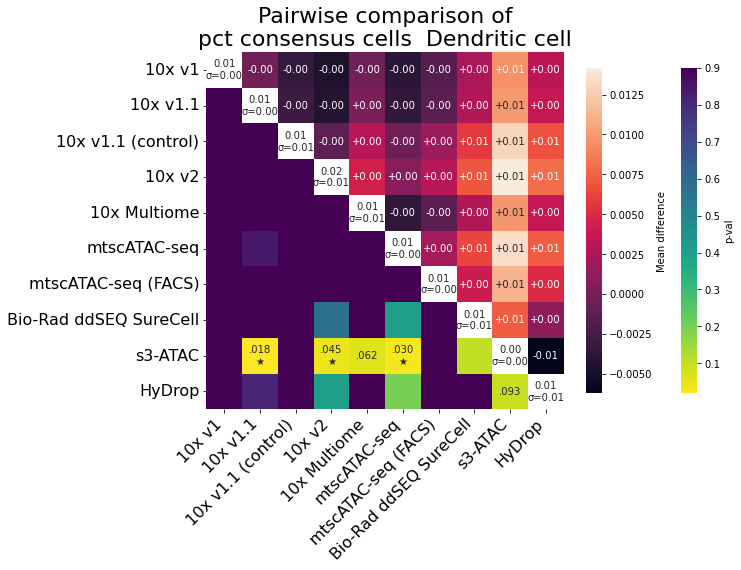

pct_consensus_cells__Natural_killer_cell
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val wit

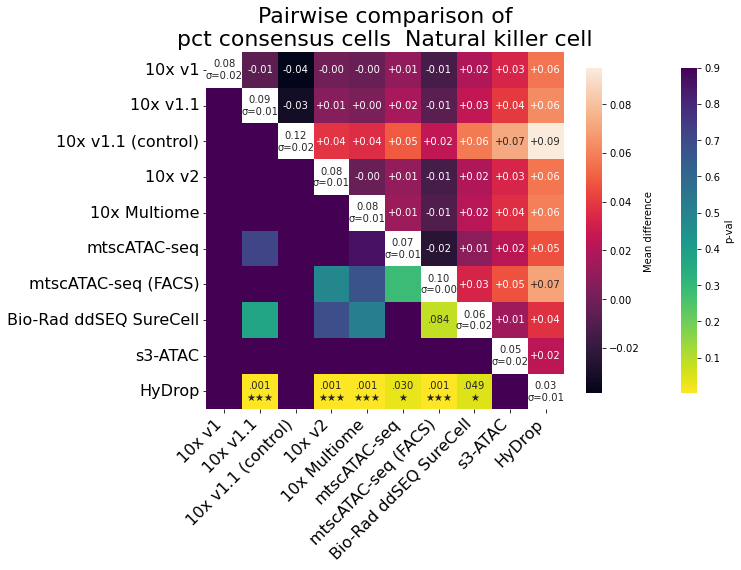

pct_seurat_cells__B_cell
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_v

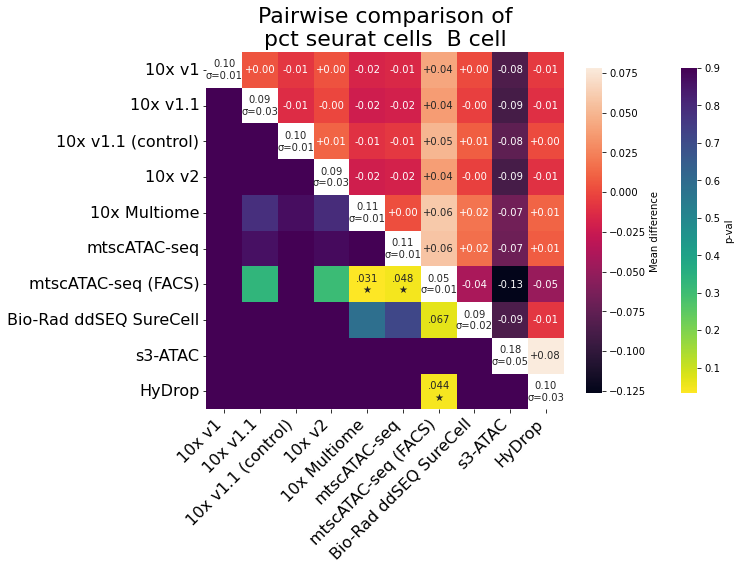

pct_seurat_cells__CD14+_monocyte
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq', 's3-ATAC')! some samples n <

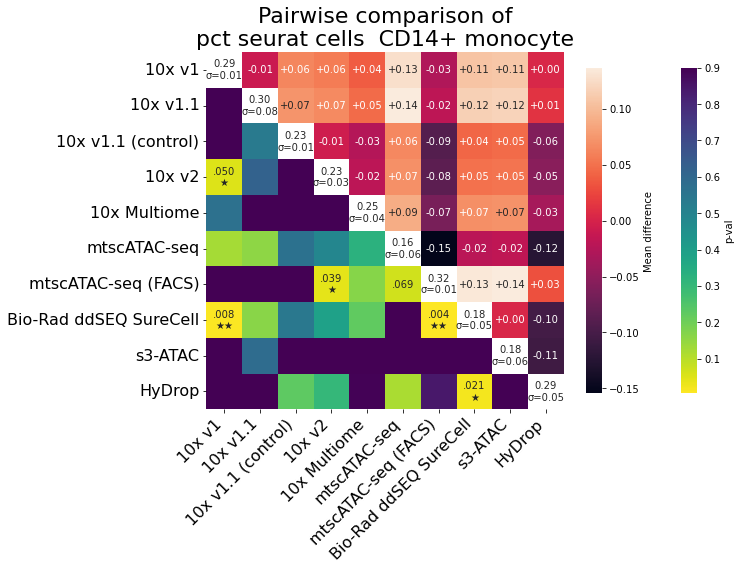

pct_seurat_cells__CD16+_monocyte
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mtscATAC-seq (FACS)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9


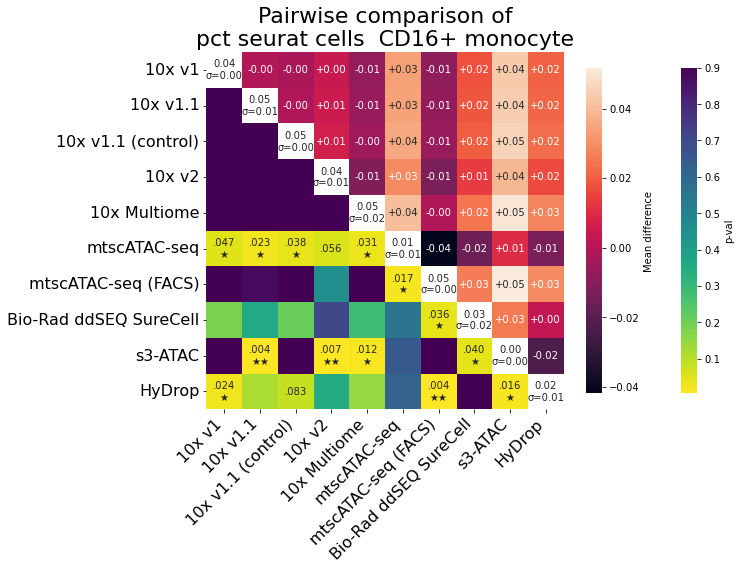

pct_seurat_cells__CD4+_T_cell
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replac

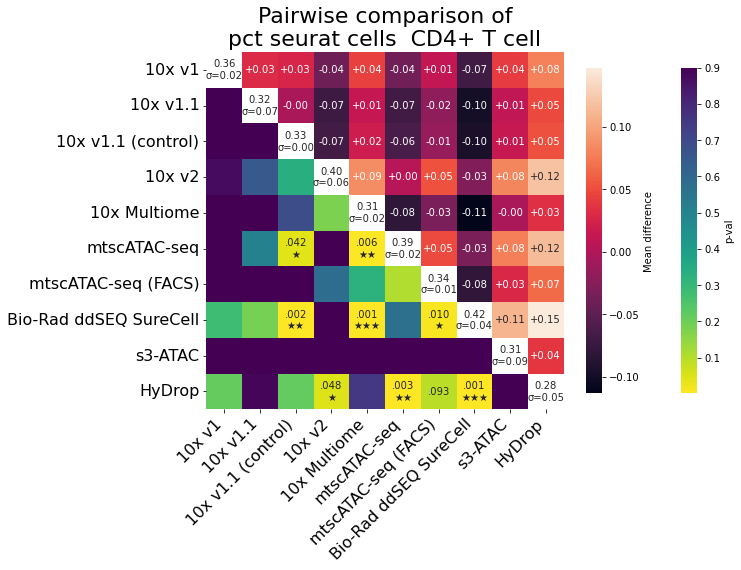

pct_seurat_cells__Cytotoxic_T_cell
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('HyDrop', 's3-ATAC')! some samples n < 2

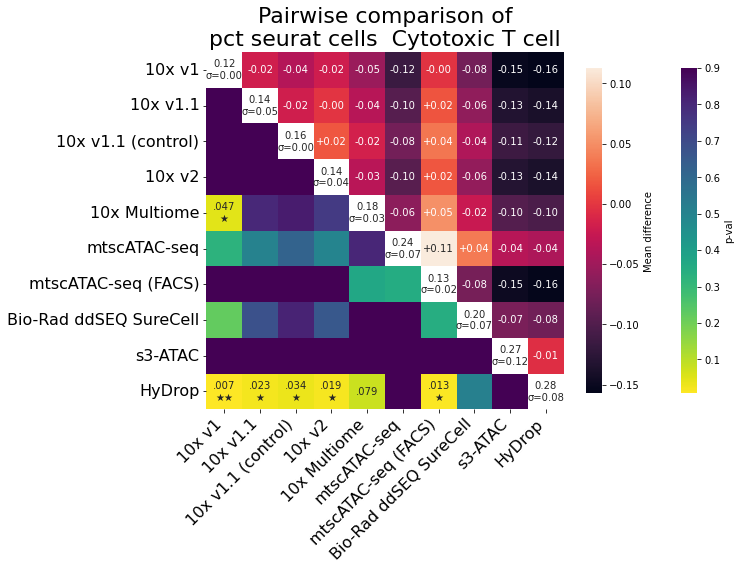

pct_seurat_cells__Dendritic_cell
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Hy

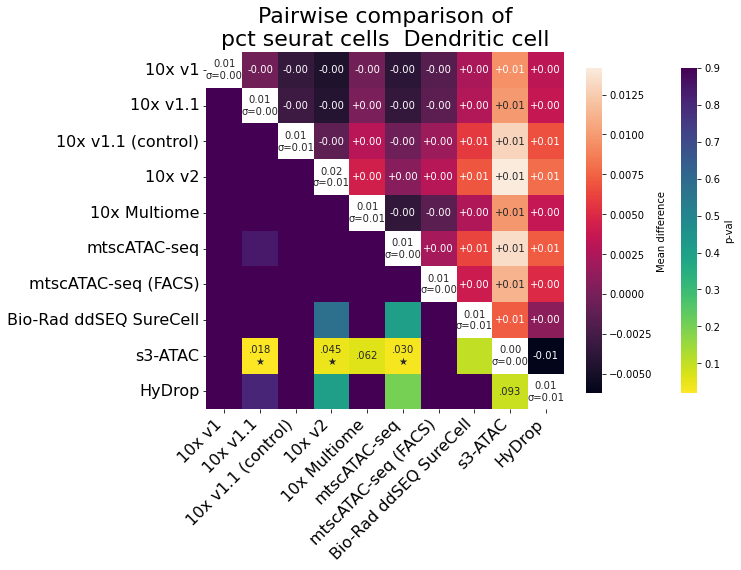

pct_seurat_cells__Natural_killer_cell
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0

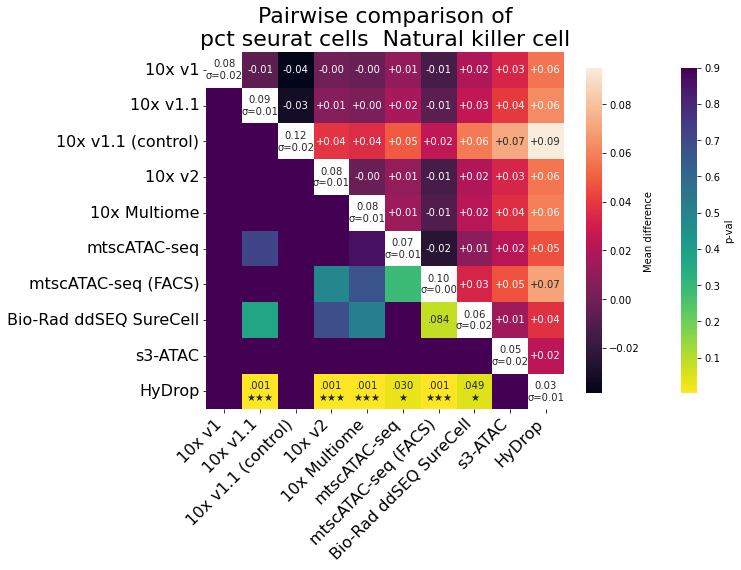

proximal
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 's3-ATAC')! some samples n < 2 --> replace p_val with 0

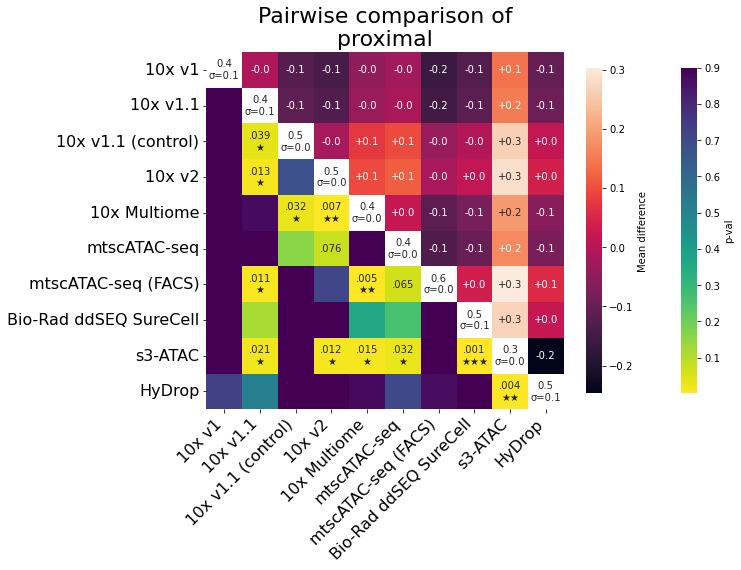

r1_length
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 's3-ATAC')! some samp

/user/leuven/330/vsc33042/.local/lib/python3.7/site-packages/ipykernel_launcher.py:48: RuntimeWarning: invalid value encountered in double_scalars


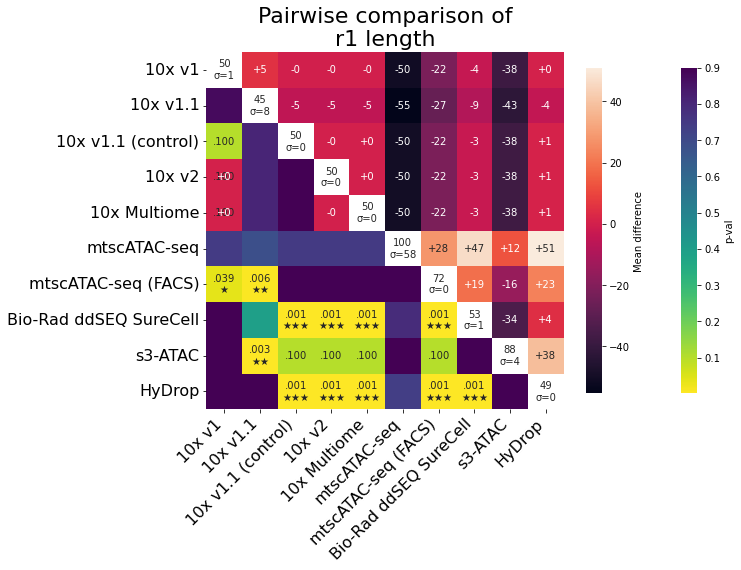

r2_length
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v2', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Bio-Rad ddSEQ SureCell', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val

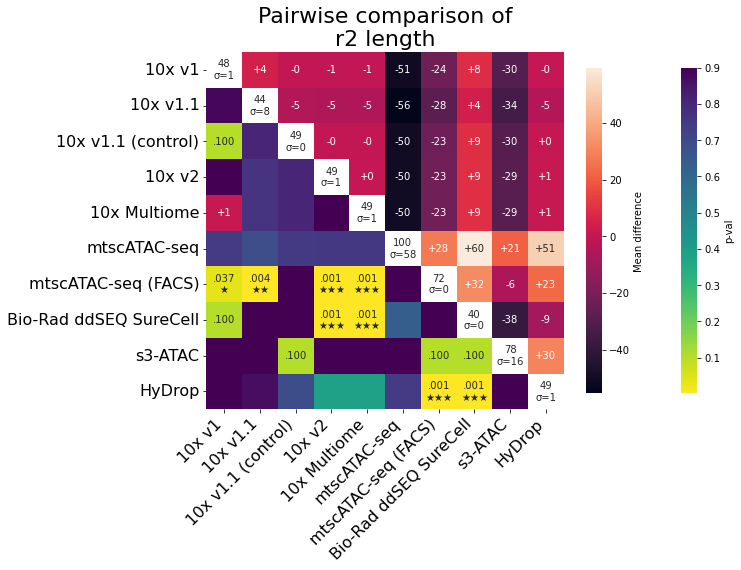

ratio_cd4T_to_cd8T_in_female
exception occurred in ('10x Multiome', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control

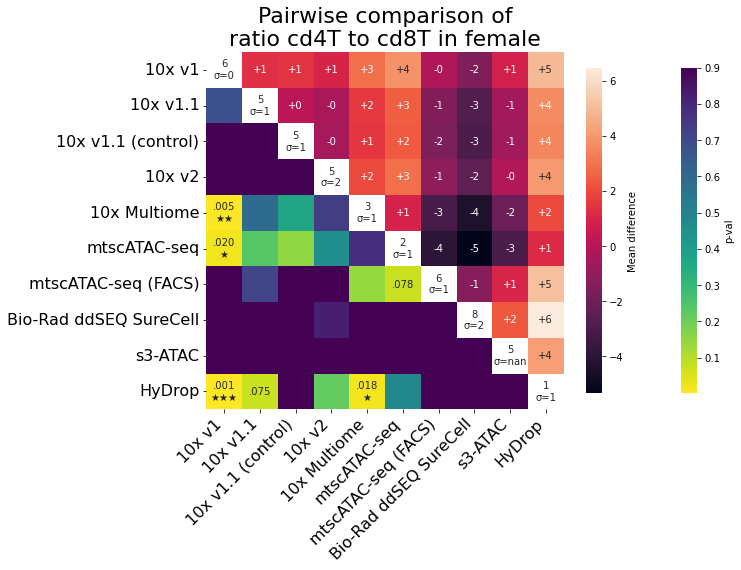

ratio_cd4T_to_cd8T_in_male
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 

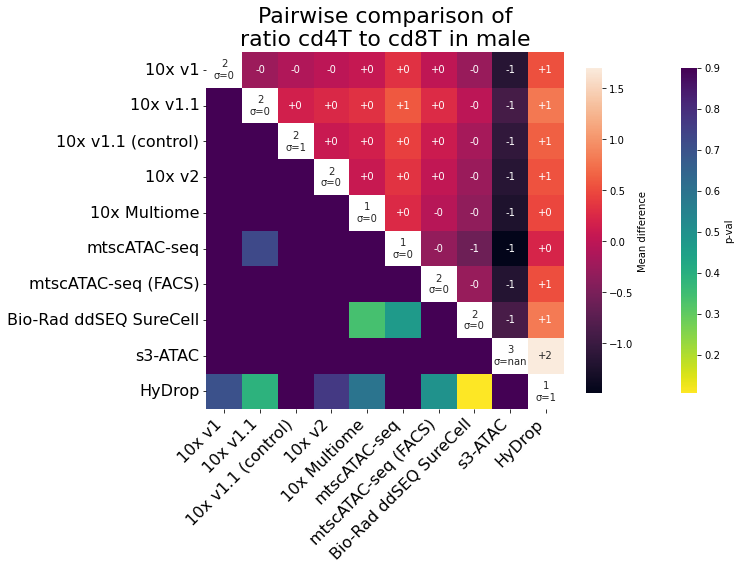

ratio_cd4T_to_cd8T_normalized
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n <

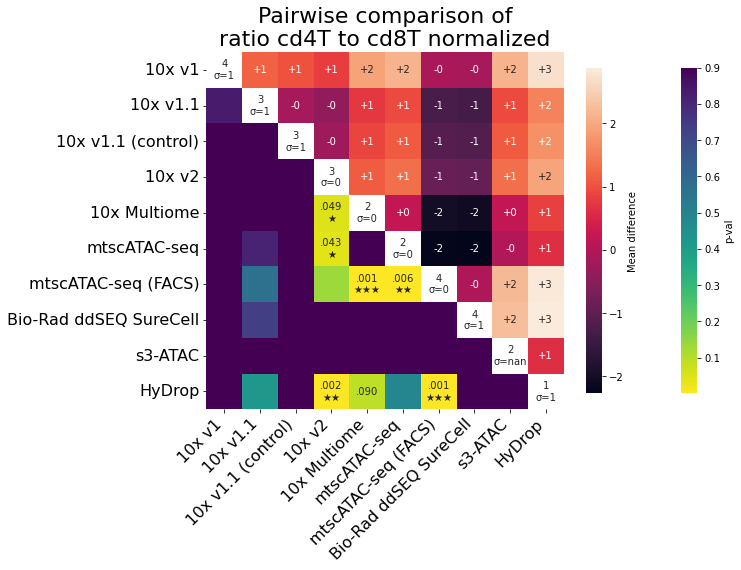

scr_exclusive_doublets
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 

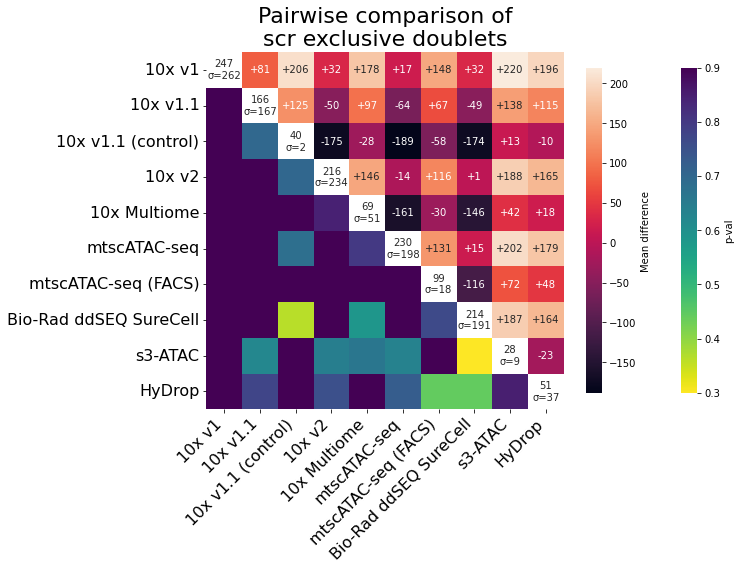

scr_exclusive_doublets_pct
exception occurred in ('10x Multiome', '10x v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exc

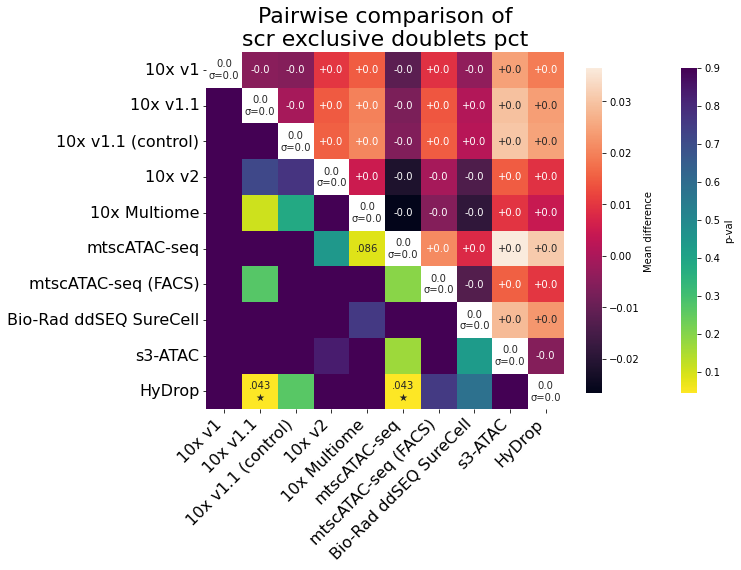

seurat_score
exception occurred in ('10x Multiome', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v1.1 (control)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', '10x v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'Bio-Rad ddSEQ SureCell')! some samples n < 2 --> replace p_val with 0.9
0.9022987541292579 10 1
exception occurred in ('10x v1', 'HyDrop')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 'mtscATAC-seq (FACS)')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1', 's3-ATAC')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('10x v1.1 (control)', '10x v2')! some samples n < 2 --> replace p_val with 0

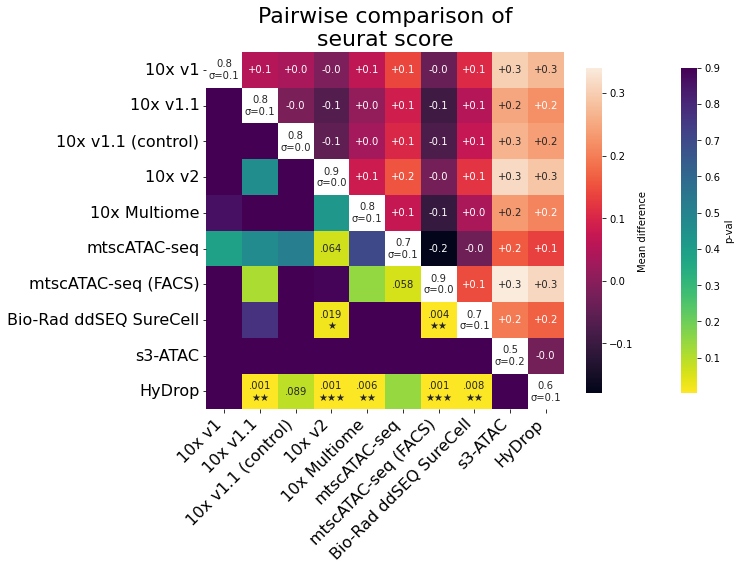

short_identifier


TypeError: ufunc 'true_divide' not supported for the input types, and the inputs could not be safely coerced to any supported types according to the casting rule ''safe''

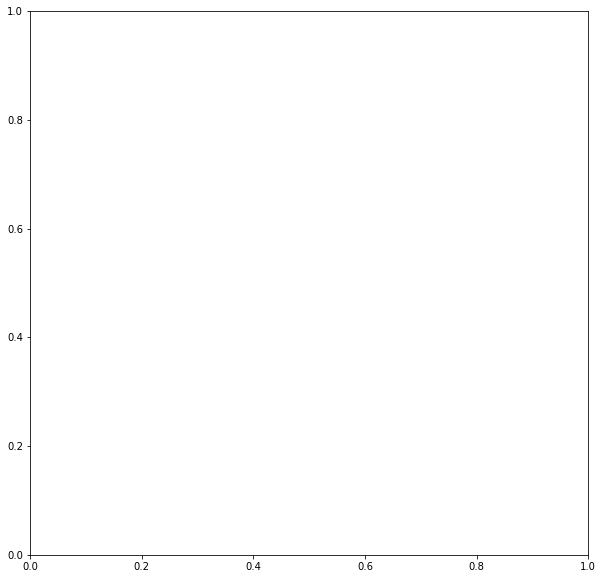

In [34]:
dictionary = {"group1": "group2", "group2": "group1"}

for variable in variables:
    df_medians_tmp = df_stats.copy()
    df_medians_tmp = df_medians_tmp[~df_medians_tmp[variable].isna()].copy()
    if (
        not os.path.exists(
            f"plts_general/FIXEDCELLS_{variable}__games_howell_across_techs.png"
        )
        or overwrite == True
    ):
        print(variable)
        fig, ax = plt.subplots(figsize=(10, 10))
        alpha = 0.05
        k = len(np.unique(df_medians_tmp["tech_alias"]))

        group_means = dict(
            npi.group_by(
                df_medians_tmp["tech_alias"], df_medians_tmp[variable], np.mean
            )
        )
        group_obs = dict(
            npi.group_by(df_medians_tmp["tech_alias"], df_medians_tmp[variable], len)
        )
        group_variance = dict(
            npi.group_by(df_medians_tmp["tech_alias"], df_medians_tmp[variable], var)
        )

        combs = list(combinations(np.unique(df_medians_tmp["tech_alias"]), 2))
        combs

        group_comps = []
        mean_differences = []
        degrees_freedom = []
        t_values = []
        p_values = []
        std_err = []
        up_conf = []
        low_conf = []

        for comb in combs:
            # Mean differences of each group combination
            diff = group_means[comb[1]] - group_means[comb[0]]

            # t-value of each group combination
            t_val = np.abs(diff) / np.sqrt(
                (group_variance[comb[0]] / group_obs[comb[0]])
                + (group_variance[comb[1]] / group_obs[comb[1]])
            )
            try:
                # Numerator of the Welch-Satterthwaite equation
                df_num = (
                    group_variance[comb[0]] / group_obs[comb[0]]
                    + group_variance[comb[1]] / group_obs[comb[1]]
                ) ** 2

                # Denominator of the Welch-Satterthwaite equation
                df_denom = (group_variance[comb[0]] / group_obs[comb[0]]) ** 2 / (
                    group_obs[comb[0]] - 1
                ) + (group_variance[comb[1]] / group_obs[comb[1]]) ** 2 / (
                    group_obs[comb[1]] - 1
                )

                # Degrees of freedom
                df = df_num / df_denom

                # p-value of the group comparison
                # try:
                p_val = psturng(t_val * np.sqrt(2), k, df)

                # Standard error of each group combination
                se = np.sqrt(
                    0.5
                    * (
                        group_variance[comb[0]] / group_obs[comb[0]]
                        + group_variance[comb[1]] / group_obs[comb[1]]
                    )
                )

                # Upper and lower confidence intervals
                upper_conf = diff + qsturng(1 - alpha, k, df)
                lower_conf = diff - qsturng(1 - alpha, k, df)

            except:
                print(
                    f"exception occurred in {comb}! some samples n < 2 --> replace p_val with 0.9"
                )
                p_val = 0.9

                # Standard error of each group combination
                se = 0

                # Upper and lower confidence intervals
                upper_conf = diff
                lower_conf = diff

            # Append the computed values to their respective lists.
            mean_differences.append(diff)
            degrees_freedom.append(df)
            t_values.append(t_val)
            p_values.append(p_val)
            std_err.append(se)
            up_conf.append(upper_conf)
            low_conf.append(lower_conf)
            group_comps.append(str(comb[0]) + " : " + str(comb[1]))

        result_df = pd.DataFrame(
            {
                "groups": group_comps,
                "mean_difference": mean_differences,
                "std_error": std_err,
                "t_value": t_values,
                "p_value": p_values,
                "upper_limit": up_conf,
                "lower_limit": low_conf,
            }
        )

        result_df["group1"] = [x.split(" : ")[0] for x in result_df["groups"]]
        result_df["group2"] = [x.split(" : ")[1] for x in result_df["groups"]]

        result_df["p_value"] = [float(x) for x in result_df["p_value"]]
        df_mirror = result_df.copy()
        # df_mirror.rename(columns=dictionary, inplace=True)
        df_mirror["mean_difference"] = [-x for x in df_mirror["mean_difference"]]
        df_mirror["upper_limit"] = [-x for x in df_mirror["upper_limit"]]
        df_mirror["lower_limit"] = [-x for x in df_mirror["lower_limit"]]
        df_mirror.rename(columns=dictionary, inplace=True)

        df_merged = pd.concat([result_df, df_mirror])

        df_pivot = df_merged.sort_values(["group1", "group2"]).pivot(
            index="group1", columns="group2", values="p_value"
        )
        # df_pivot = df_pivot[tech_order].loc[tech_order]

        ### initiate the heatmap with means on the diagonal
        means_df = pd.DataFrame(index=group_means.keys(), columns=group_means.keys())
        for key in group_means.keys():
            means_df.at[key, key] = group_means[key]

        group_stdev_dict = {
            x: math.sqrt(group_variance[x]) for x in group_variance.keys()
        }
        means_df_annot = means_df.copy()
        for key in group_means.keys():
            means_df_annot.at[key, key] = (
                "{num:{width}}".format(
                    num=group_means[key], width=number_format_dict[variable]
                )
                + "\nσ="
                + "{num:{width}}".format(
                    num=group_stdev_dict[key], width=number_format_dict[variable]
                )
            )

        # adjust tech alias order to entries present
        tech_alias_order_adjusted = [x for x in tech_alias_order if x in means_df.index]

        sns.heatmap(
            data=means_df.fillna(0)[tech_alias_order_adjusted].loc[
                tech_alias_order_adjusted
            ],
            cmap=ListedColormap(["white"]),
            annot=means_df_annot[tech_alias_order_adjusted].loc[
                tech_alias_order_adjusted
            ],
            mask=means_df.isnull(),
            ax=ax,
            square=True,
            fmt="",
            cbar=False
            # cbar_kws={"shrink": 0.5, "label": f"Mean {variable}"},
        )

        ### then add a lower triangle, showing the significance using the upper triangle matrix as mask
        baseline = 0.1
        extreme_1 = 0.05  # show with a star
        extreme_2 = 0.01  # show with a second star
        extreme_3 = 0.001  # show with a third star
        annot = [
            [
                ""
                + ("" if abs(val) > baseline else f"{val:.3f}".replace("0.", "."))
                + (
                    "" if abs(val) > extreme_1 else "\n★"
                )  # add one star if abs(val) >= extreme_1
                + (
                    "" if abs(val) > extreme_2 else "★"
                )  # add an extra star if abs(val) >= extreme_2
                + (
                    "" if abs(val) > extreme_3 else "★"
                )  # add yet an extra star if abs(val) >= extreme_3
                for val in row
            ]
            for row in df_pivot[tech_alias_order_adjusted]
            .loc[tech_alias_order_adjusted]
            .to_numpy()
        ]
        sns.heatmap(
            df_pivot[tech_alias_order_adjusted].loc[tech_alias_order_adjusted],
            cmap="viridis_r",
            annot=annot,
            fmt="",
            mask=np.triu(df_pivot),
            ax=ax,
            square=True,
            cbar_kws={"shrink": 0.5, "label": "p-val"},
        )

        #### now upper half: mean differences
        df_mirror = result_df.copy()
        df_mirror["mean_difference"] = [-x for x in df_mirror["mean_difference"]]
        df_mirror["upper_limit"] = [-x for x in df_mirror["upper_limit"]]
        df_mirror["lower_limit"] = [-x for x in df_mirror["lower_limit"]]
        df_pivot2 = df_merged.sort_values(["group1", "group2"]).pivot(
            index="group1", columns="group2", values="mean_difference"
        )
        matrix = np.tril(df_pivot2)

        sns.heatmap(
            df_pivot2[tech_alias_order_adjusted].loc[tech_alias_order_adjusted].T,
            cmap="rocket",
            fmt=number_format_dict_signed[variable],
            mask=matrix,
            annot=True,
            ax=ax,
            square=True,
            cbar_kws={"shrink": 0.5, "label": "Mean difference"},
        )
        fig.tight_layout()

        ax.set_ylabel(None)
        ax.set_xlabel(None)
        plt.xticks(rotation=45, ha="right", fontsize=16)
        plt.yticks(fontsize=16)

        plt.title("Pairwise comparison of\n" + var_alias_dict[variable], fontsize=22)

        # fig.savefig(
        #     f"plts_general/FIXEDCELLS_{variable}__games_howell_across_techs.png".replace(' ', '_'),
        #     dpi=600,
        #     facecolor="white",
        # )
        # fig.savefig(
        #     f"plts_general/FIXEDCELLS_{variable}__games_howell_across_techs.svg".replace(' ', '_'),
        #     dpi=600,
        #     facecolor="white",
        # )
        plt.show()
    else:
        print(
            f"plts_general/FIXEDCELLS_{variable}__games_howell_across_techs.png already exists"
        )

# final variables for publication

In [35]:
variables_final = sorted(
    [
        "%_correct_barcodes",
        "%_mapq30",
        # "Duplicate fragments in cells, normalized to fragments in cells",
        # "Fragments in background noise barcodes",
        "Median_Unique_nr_frag_in_regions_thousands",
        # "Median_dupl_rate",
        "Median_frip",
        "Median_scrublet_doublet_scores_fragments",
        "Median_tss_enrichment",
        # "No correct barcode",
        # "Not mapped properly",
        # "Unique fragments in cells and in peaks, normalized to unique fragments in cells",
        # "Unique fragments in cells, not in peaks, normalized to unique fragments in cells",
        # "avg_insert_size",
        "avg_map_quality",
        # "cells",
        "chrM",
        # "common_doublets_pct",
        # "common_doublets_pct_of_doublets",
        # "distal",
        "efficiency",
        "fmx_best_llk",
        "log_median_unique_nr_frag_in_regions",
        "mean_bot20dars_recovery",
        "mean_bot20peaks_recovery",
        "mean_top20dars_recovery",
        "mean_top20peaks_recovery",
        # "median_frag_dist_nearest_tss",
        "median_frag_len",
        "median_log10_frag_dist_nearest_tss",
        # "mononucleosomal",
        # "mononucleosomal_distal",
        # "mononucleosomal_proximal",
        # "multinucleosomal",
        # "multinucleosomal_distal",
        # "multinucleosomal_proximal",
        # "n_dars__B_cell_thousands",
        # "n_dars__CD14+_monocyte_thousands",
        # "n_dars__CD16+_monocyte_thousands",
        # "n_dars__CD4+_T_cell_thousands",
        # "n_dars__Cytotoxic_T_cell_thousands",
        # "n_dars__Dendritic_cell_thousands",
        # "n_dars__Natural_killer_cell_thousands",
        # "n_peaks__Bcell_thousands",
        # "n_peaks__CD14_monocyte_thousands",
        # "n_peaks__CD16_monocyte_thousands",
        # "n_peaks__CD4_Tcell_thousands",
        # "n_peaks__CytotoxicTcell_thousands",
        # "n_peaks__Dendriticcell_thousands",
        # "n_peaks__Naturalkillercell_thousands",
        # "nucleosome-free",
        # "nucleosome-free_distal",
        # "nucleosome-free_proximal",
        # "proximal",
        # "scr_exclusive_doublets_pct",
        "seurat_score",
        "top2kdars_median_dar_logfc",
        "top2kdars_median_dar_tss_dist",
        # "total_doublets",
        "total_doublets_pct",
        "frac_barcodes_merged",
    ]
)

In [36]:
var_alias_dict_final = {
    "%_correct_barcodes": "% Correct barcodes",
    "%_mapq30": "% Mapping quality >= 30",
    "Duplicate fragments in cells, normalized to fragments in cells": "Fraction of duplicate fragments\nin cells, normalized to fragments in cells",
    "Fragments in background noise barcodes": "Fragments in background noise barcodes",
    "Median_Unique_nr_frag_in_regions_thousands": "Median unique fragments\nin regions (thousands)",
    "Median_dupl_rate": "Median duplication rate",
    "Median_frip": "Median fraction of reads in peaks",
    "Median_scrublet_doublet_scores_fragments": "Median Scrublet doublet scores",
    "Median_tss_enrichment": "Median TSS enrichment",
    "No correct barcode": "% No correct barcode",
    "Not mapped properly": "% Not mapped properly",
    "Unique fragments in cells and in peaks, normalized to unique fragments in cells": "Fraction of unique fragments\nin cells and in peaks, normalized to unique fragments in cells",
    "Unique fragments in cells, not in peaks, normalized to unique fragments in cells": "Fraction of unique fragments\nin cells, not in peaks, normalized to unique fragments in cells",
    "avg_insert_size": "Average insert size",
    "avg_map_quality": "Average fragment alignment quality",
    "cells": "Number of cells",
    "chrM": "Fraction of fragments in chrM",
    "common_doublets_pct": "Number of Freemuxlet & Scrublet common doublets",
    "common_doublets_pct_of_doublets": "% of Freemuxlet & Scrublet common doublets",
    "distal": "Fraction of distal fragments",
    "efficiency": "Sequencing efficiency",
    "fmx_best_llk": "Freemuxlet best assignment LLK",
    "log_median_unique_nr_frag_in_regions": "log10(Median unique fragments in regions)",
    "mean_bot20dars_recovery": "Mean recovery of 20% weakest DARs\nacross cell types",
    "mean_bot20peaks_recovery": "Mean recovery of 20% weakest peaks\nacross cell types",
    "mean_top20dars_recovery": "Mean recovery of 20% strongest DARs\nacross cell types",
    "mean_top20peaks_recovery": "Mean recovery of 20% strongest peaks\nacross cell types",
    "median_frag_dist_nearest_tss": "Median distance of fragments to nearest TSS",
    "median_frag_len": "Median fragment length",
    "median_log10_frag_dist_nearest_tss": "Median log10(distance of fragments to nearest TSS)",
    "mononucleosomal": "Mononucleosomal fragments",
    "mononucleosomal_distal": "Mononucleosomal, distal fragments",
    "mononucleosomal_proximal": "Mononucleosoma, proximal fragments",
    "multinucleosomal": "Multinucleosomal fragments",
    "multinucleosomal_distal": "Multinucleosomal, distal fragments",
    "multinucleosomal_proximal": "Multinucleosomal, proximal fragments",
    "n_dars__B_cell_thousands": "Number of  B cell DARs (thousands)",
    "n_dars__CD14+_monocyte_thousands": "Number of CD14+ monocyte DARs (thousands)",
    "n_dars__CD16+_monocyte_thousands": "Number of CD16+ monocyte DARs (thousands)",
    "n_dars__CD4+_T_cell_thousands": "Number of Naive T cell DARs (thousands)",
    "n_dars__Cytotoxic_T_cell_thousands": "Number of Cytotoxic T cell DARs (thousands)",
    "n_dars__Dendritic_cell_thousands": "Number of Dendritic cell DARs (thousands)",
    "n_dars__Natural_killer_cell_thousands": "Number of  Natural killer cell DARs (thousands)",
    "n_peaks__Bcell_thousands": "Number of B cell peaks (thousands)",
    "n_peaks__CD14_monocyte_thousands": "Number of CD14+ monocyte peaks (thousands)",
    "n_peaks__CD16_monocyte_thousands": "Number of CD16+ monocyte peaks (thousands)",
    "n_peaks__CD4_Tcell_thousands": "Number of CD4+ T cell peaks (thousands)",
    "n_peaks__CytotoxicTcell_thousands": "Number of Cytotoxic T cell peaks (thousands)",
    "n_peaks__Dendriticcell_thousands": "Number of Dendritic cell peaks (thousands)",
    "n_peaks__Naturalkillercell_thousands": "Number of Natural killer cell peaks (thousands)",
    "nucleosome-free": "Nucleosome-free fragments",
    "nucleosome-free_distal": "Nucleosome-free, distal fragments",
    "nucleosome-free_proximal": "Nucleosome-free, proximal fragments",
    "proximal": "Proximal fragments",
    "scr_exclusive_doublets_pct": "Fraction of Scrublet exclusive doublets",
    "seurat_score": "Median Seurat score",
    "top2kdars_median_dar_logfc": "Median log2(fold-change) of top 2000 DARs",
    "top2kdars_median_dar_tss_dist": "Median TSS distance of top 2000 DARs",
    "total_doublets": "Total number of doublets",
    "total_doublets_pct": "Total doublet fraction",
    "frac_barcodes_merged": "Fraction of barcodes merged",
}

In [37]:
# number_format_dict_final = {x: number_format_dict[x] for x in variables_final}
number_format_dict_final = {
    "%_correct_barcodes": ".1f",
    "%_mapq30": ".1f",
    "Duplicate fragments in cells, normalized to fragments in cells": ".2f",
    "Fragments in background noise barcodes": ".2f",
    "Median_Unique_nr_frag_in_regions_thousands": ".1f",
    "Median_dupl_rate": ".2f",
    "Median_frip": ".2f",
    "Median_scrublet_doublet_scores_fragments": ".2f",
    "Median_tss_enrichment": ".1f",
    "No correct barcode": ".2f",
    "Not mapped properly": ".2f",
    "Unique fragments in cells and in peaks, normalized to unique fragments in cells": ".2f",
    "Unique fragments in cells, not in peaks, normalized to unique fragments in cells": ".2f",
    "avg_insert_size": ".1f",
    "avg_map_quality": ".1f",
    "cells": ".0f",
    "chrM": ".2f",
    "common_doublets_pct": ".3f",
    "common_doublets_pct_of_doublets": ".2f",
    "distal": ".2f",
    "efficiency": ".2f",
    "fmx_best_llk": ".0f",
    "log_median_unique_nr_frag_in_regions": ".1f",
    "mean_bot20dars_recovery": ".2f",
    "mean_bot20peaks_recovery": ".2f",
    "mean_top20dars_recovery": ".2f",
    "mean_top20peaks_recovery": ".2f",
    "median_frag_dist_nearest_tss": ".0f",
    "median_frag_len": ".0f",
    "median_log10_frag_dist_nearest_tss": ".1f",
    "mononucleosomal": ".2f",
    "mononucleosomal_distal": ".2f",
    "mononucleosomal_proximal": ".2f",
    "multinucleosomal": ".2f",
    "multinucleosomal_distal": ".2f",
    "multinucleosomal_proximal": ".2f",
    "n_dars__B_cell_thousands": ".1f",
    "n_dars__CD14+_monocyte_thousands": ".1f",
    "n_dars__CD16+_monocyte_thousands": ".1f",
    "n_dars__CD4+_T_cell_thousands": ".1f",
    "n_dars__Cytotoxic_T_cell_thousands": ".1f",
    "n_dars__Dendritic_cell_thousands": ".1f",
    "n_dars__Natural_killer_cell_thousands": ".1f",
    "n_peaks__Bcell_thousands": ".1f",
    "n_peaks__CD14_monocyte_thousands": ".1f",
    "n_peaks__CD16_monocyte_thousands": ".1f",
    "n_peaks__CD4_Tcell_thousands": ".1f",
    "n_peaks__CytotoxicTcell_thousands": ".1f",
    "n_peaks__Dendriticcell_thousands": ".1f",
    "n_peaks__Naturalkillercell_thousands": ".1f",
    "nucleosome-free": ".2f",
    "nucleosome-free_distal": ".2f",
    "nucleosome-free_proximal": ".2f",
    "proximal": ".2f",
    "scr_exclusive_doublets_pct": ".3f",
    "seurat_score": ".2f",
    "top2kdars_median_dar_logfc": ".1f",
    "top2kdars_median_dar_tss_dist": ".0f",
    "total_doublets": ".0f",
    "total_doublets_pct": ".3f",
    "frac_barcodes_merged": ".3f",
}
number_format_dict_final_signed = {
    x: "+" + y for x, y in number_format_dict_final.items()
}

In [38]:
tech_alias_short = {
    "10xmultiome": "MO",
    "10xv1": "v1",
    "10xv11": "v1.1",
    "10xv11c": "v1.1c",
    "10xv2": "v2",
    "ddseq": "ddS",
    "hydrop": "Hy",
    "mtscatac": "mt",
    "mtscatacfacs": "mt*",
    "s3atac": "s3",
}

In [39]:
df_stats["tech_short"] = [tech_alias_short[x.split("_")[1]] for x in df_stats.index]

In [40]:
tech_alias_short_order = [
    "v1",
    "v1.1",
    "v1.1c",
    "v2",
    "MO",
    "mt",
    "mt*",
    "ddS",
    "s3",
    "Hy",
]

%_correct_barcodes
exception occurred in ('MO', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1.1c', 'v2')! some samples n < 2 --> replace p_val with 0.9


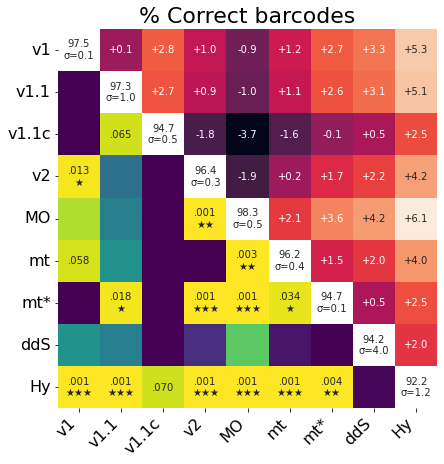

%_mapq30
exception occurred in ('Hy', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1c')! some samples n < 2 --> replace p_val w

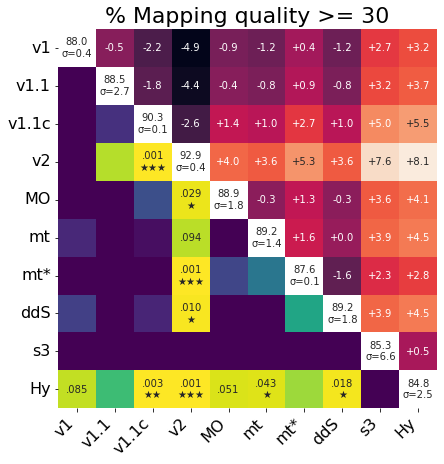

Median_Unique_nr_frag_in_regions_thousands
exception occurred in ('Hy', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Hy', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9


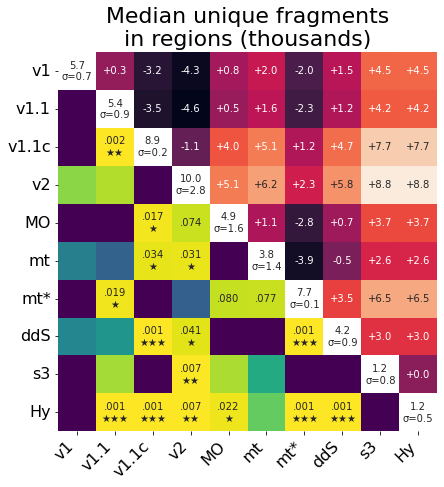

Median_frip
exception occurred in ('Hy', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Hy', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 

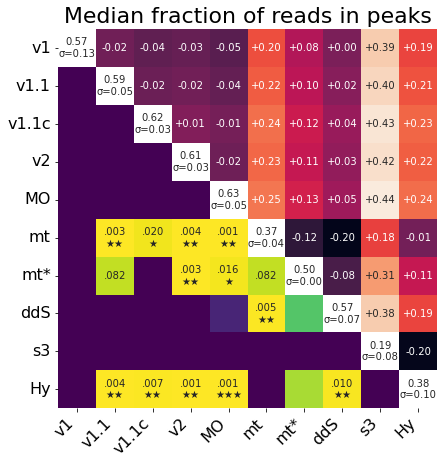

Median_scrublet_doublet_scores_fragments
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9


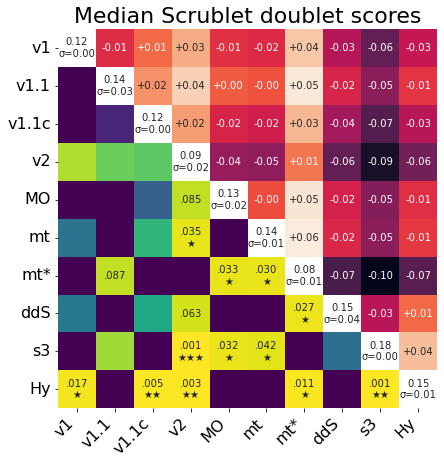

Median_tss_enrichment
exception occurred in ('MO', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v2')! some samples n < 2 --> re

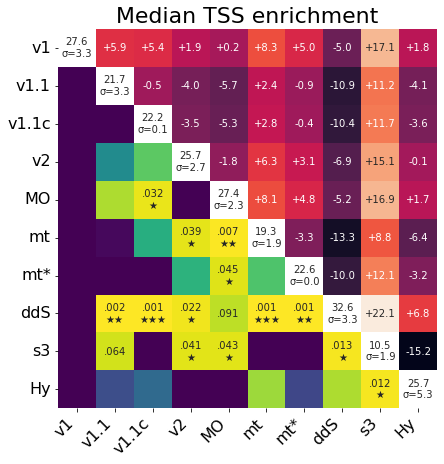

avg_map_quality
exception occurred in ('mt', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt', 'v1')! some samples n < 2 --> replace p_val with 0.9
0.9111661786766325 10 1.0
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1')! some samples n < 2 --> replace p_val with 0.9


/user/leuven/330/vsc33042/.local/lib/python3.7/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in double_scalars
/user/leuven/330/vsc33042/.local/lib/python3.7/site-packages/ipykernel_launcher.py:65: RuntimeWarning: invalid value encountered in double_scalars


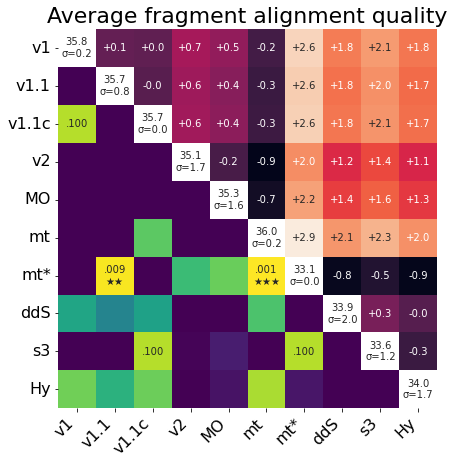

chrM
exception occurred in ('MO', 'mt*')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9


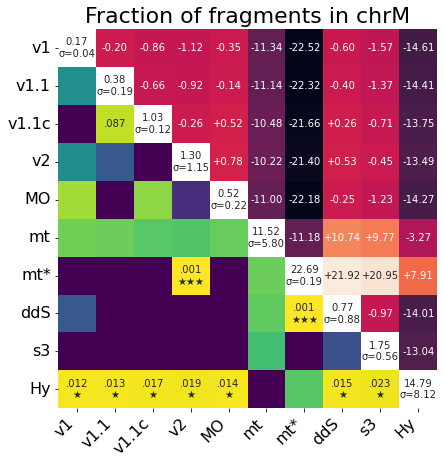

efficiency
exception occurred in ('Hy', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Hy', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9


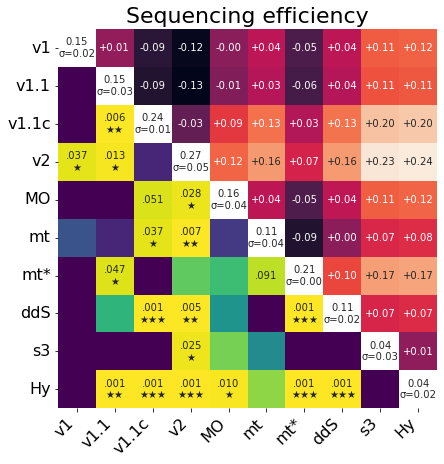

fmx_best_llk
exception occurred in ('Hy', 'ddS')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Hy', 'mt*')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Hy', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Hy', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Hy', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'mt*')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_va

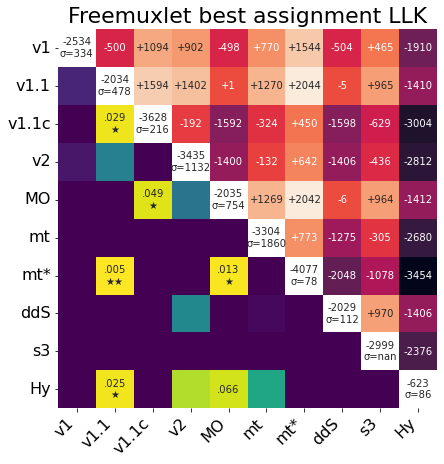

frac_barcodes_merged
exception occurred in ('MO', 'mt*')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v2')! some samples n < 2 --> replace p_val with 0.9


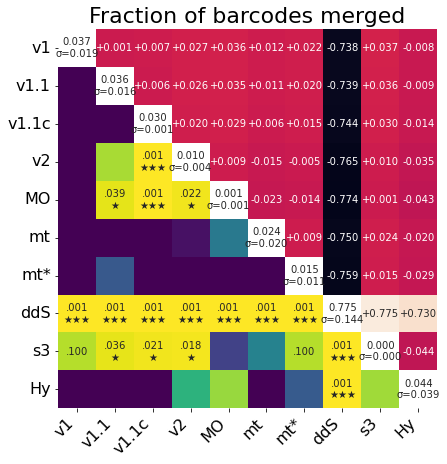

log_median_unique_nr_frag_in_regions
exception occurred in ('Hy', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1c')! some sampl

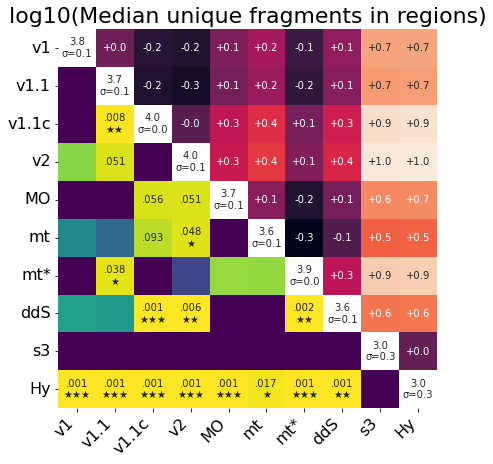

mean_bot20dars_recovery
exception occurred in ('Hy', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1')! some samples n < 2 --> r

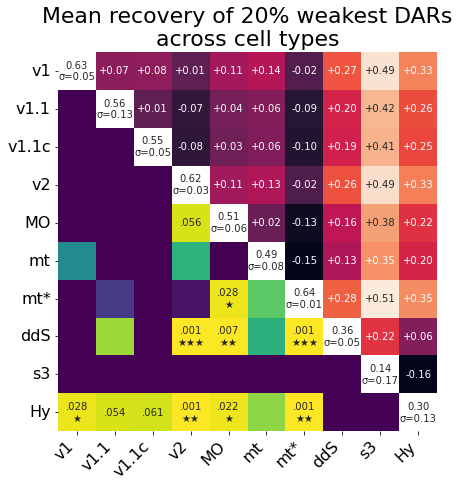

mean_bot20peaks_recovery
exception occurred in ('Hy', 'mt*')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Hy', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Hy', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Hy', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'mt*')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 

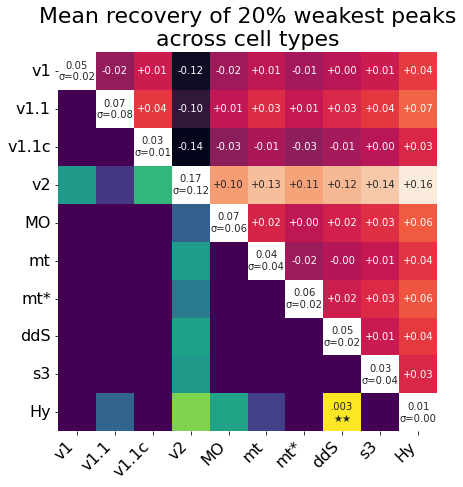

mean_top20dars_recovery
exception occurred in ('Hy', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1c')! some samples n < 2 --> 

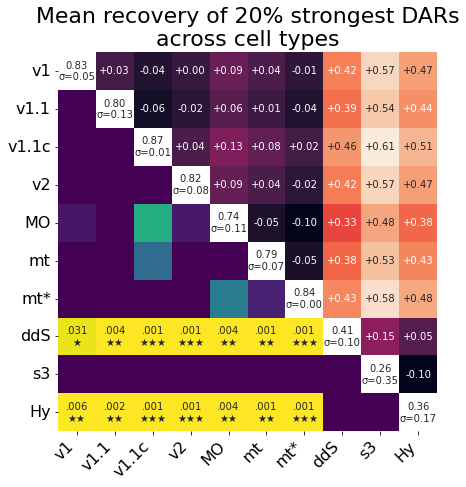

mean_top20peaks_recovery
exception occurred in ('Hy', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v2')! some samples n < 2 --> r

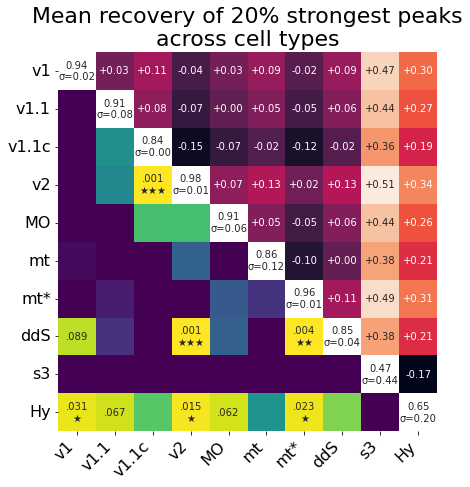

median_frag_len
exception occurred in ('MO', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9


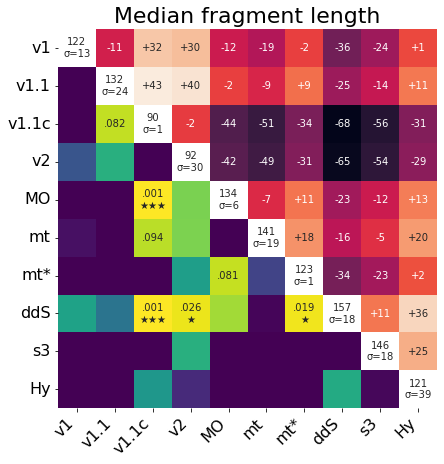

median_log10_frag_dist_nearest_tss
exception occurred in ('MO', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v2')! some samples n < 2 --> replace p_val with 0.9


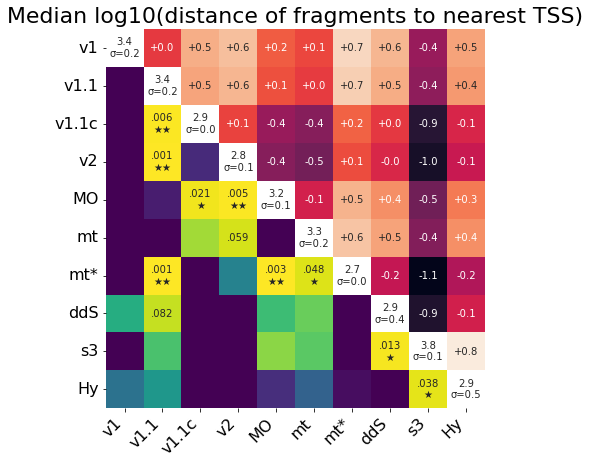

seurat_score
exception occurred in ('Hy', 's3')! some samples n < 2 --> replace p_val with 0.9
0.9022987541292579 10 1
exception occurred in ('Hy', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1')! some sample

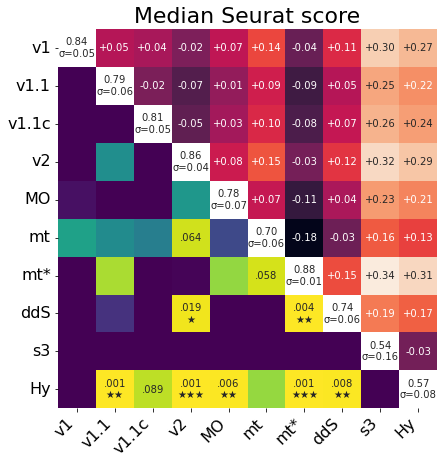

top2kdars_median_dar_logfc
exception occurred in ('Hy', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Hy', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1.1c', 'v2')! some samples

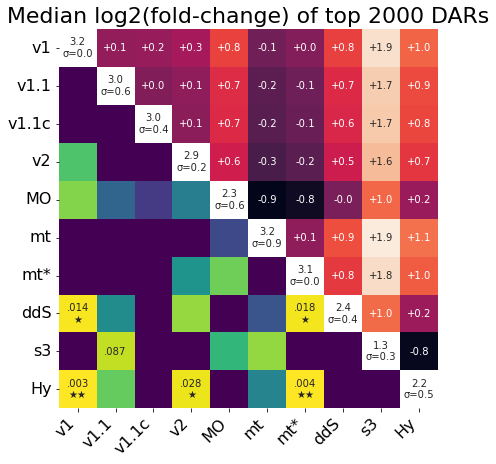

top2kdars_median_dar_tss_dist
exception occurred in ('Hy', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 's3')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('mt*', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('s3', 'v2')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('v1', 'v1.1c')! some samples n < 

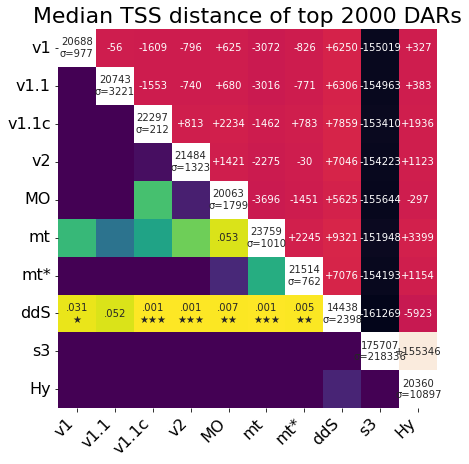

total_doublets_pct
exception occurred in ('Hy', 'ddS')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Hy', 'mt')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Hy', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('Hy', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 'ddS')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('MO', 'v1.1c')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'mt')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'mt*')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'v1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'v1.1')! some samples n < 2 --> replace p_val with 0.9
exception occurred in ('ddS', 'v1.1c')! some samples n < 2 --> r

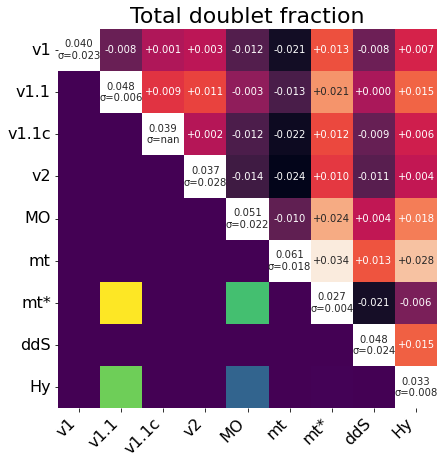

In [41]:
dictionary = {"group1": "group2", "group2": "group1"}

for variable in variables_final:
    df_medians_tmp = df_stats.copy()
    df_medians_tmp = df_medians_tmp[~df_medians_tmp[variable].isna()].copy()
    if (
        not os.path.exists(
            f"plts_general/FIXEDCELLS_{variable}__games_howell_across_techs.png"
        )
        or overwrite == True
    ):
        print(variable)
        fig, ax = plt.subplots(figsize=(6, 6))
        alpha = 0.05
        k = len(np.unique(df_medians_tmp["tech_short"]))

        group_means = dict(
            npi.group_by(
                df_medians_tmp["tech_short"], df_medians_tmp[variable], np.mean
            )
        )
        group_obs = dict(
            npi.group_by(df_medians_tmp["tech_short"], df_medians_tmp[variable], len)
        )
        group_variance = dict(
            npi.group_by(df_medians_tmp["tech_short"], df_medians_tmp[variable], var)
        )

        combs = list(combinations(np.unique(df_medians_tmp["tech_short"]), 2))
        combs

        group_comps = []
        mean_differences = []
        degrees_freedom = []
        t_values = []
        p_values = []
        std_err = []
        up_conf = []
        low_conf = []

        for comb in combs:
            # Mean differences of each group combination
            diff = group_means[comb[1]] - group_means[comb[0]]

            # t-value of each group combination
            t_val = np.abs(diff) / np.sqrt(
                (group_variance[comb[0]] / group_obs[comb[0]])
                + (group_variance[comb[1]] / group_obs[comb[1]])
            )
            try:
                # Numerator of the Welch-Satterthwaite equation
                df_num = (
                    group_variance[comb[0]] / group_obs[comb[0]]
                    + group_variance[comb[1]] / group_obs[comb[1]]
                ) ** 2

                # Denominator of the Welch-Satterthwaite equation
                df_denom = (group_variance[comb[0]] / group_obs[comb[0]]) ** 2 / (
                    group_obs[comb[0]] - 1
                ) + (group_variance[comb[1]] / group_obs[comb[1]]) ** 2 / (
                    group_obs[comb[1]] - 1
                )

                # Degrees of freedom
                df = df_num / df_denom

                # p-value of the group comparison
                # try:
                p_val = psturng(t_val * np.sqrt(2), k, df)

                # Standard error of each group combination
                se = np.sqrt(
                    0.5
                    * (
                        group_variance[comb[0]] / group_obs[comb[0]]
                        + group_variance[comb[1]] / group_obs[comb[1]]
                    )
                )

                # Upper and lower confidence intervals
                upper_conf = diff + qsturng(1 - alpha, k, df)
                lower_conf = diff - qsturng(1 - alpha, k, df)

            except:
                print(
                    f"exception occurred in {comb}! some samples n < 2 --> replace p_val with 0.9"
                )
                p_val = 0.9

                # Standard error of each group combination
                se = 0

                # Upper and lower confidence intervals
                upper_conf = diff
                lower_conf = diff

            # Append the computed values to their respective lists.
            mean_differences.append(diff)
            degrees_freedom.append(df)
            t_values.append(t_val)
            p_values.append(p_val)
            std_err.append(se)
            up_conf.append(upper_conf)
            low_conf.append(lower_conf)
            group_comps.append(str(comb[0]) + " : " + str(comb[1]))

        result_df = pd.DataFrame(
            {
                "groups": group_comps,
                "mean_difference": mean_differences,
                "std_error": std_err,
                "t_value": t_values,
                "p_value": p_values,
                "upper_limit": up_conf,
                "lower_limit": low_conf,
            }
        )

        result_df["group1"] = [x.split(" : ")[0] for x in result_df["groups"]]
        result_df["group2"] = [x.split(" : ")[1] for x in result_df["groups"]]

        result_df["p_value"] = [float(x) for x in result_df["p_value"]]
        df_mirror = result_df.copy()
        # df_mirror.rename(columns=dictionary, inplace=True)
        df_mirror["mean_difference"] = [-x for x in df_mirror["mean_difference"]]
        df_mirror["upper_limit"] = [-x for x in df_mirror["upper_limit"]]
        df_mirror["lower_limit"] = [-x for x in df_mirror["lower_limit"]]
        df_mirror.rename(columns=dictionary, inplace=True)

        df_merged = pd.concat([result_df, df_mirror])

        df_pivot = df_merged.sort_values(["group1", "group2"]).pivot(
            index="group1", columns="group2", values="p_value"
        )
        # df_pivot = df_pivot[tech_order].loc[tech_order]

        ### initiate the heatmap with means on the diagonal
        means_df = pd.DataFrame(index=group_means.keys(), columns=group_means.keys())
        for key in group_means.keys():
            means_df.at[key, key] = group_means[key]

        group_stdev_dict = {
            x: math.sqrt(group_variance[x]) for x in group_variance.keys()
        }
        means_df_annot = means_df.copy()
        for key in group_means.keys():
            means_df_annot.at[key, key] = (
                "{num:{width}}".format(
                    num=group_means[key], width=number_format_dict_final[variable]
                )
                + "\nσ="
                + "{num:{width}}".format(
                    num=group_stdev_dict[key], width=number_format_dict_final[variable]
                )
            )

        # adjust tech alias order to entries present
        tech_alias_order_adjusted = [
            x for x in tech_alias_short_order if x in means_df.index
        ]

        sns.heatmap(
            data=means_df.fillna(0)[tech_alias_order_adjusted].loc[
                tech_alias_order_adjusted
            ],
            cmap=ListedColormap(["white"]),
            annot=means_df_annot[tech_alias_order_adjusted].loc[
                tech_alias_order_adjusted
            ],
            mask=means_df.isnull(),
            ax=ax,
            square=True,
            fmt="",
            cbar=False
            # cbar_kws={"shrink": 0.5, "label": f"Mean {variable}"},
        )

        ### then add a lower triangle, showing the significance using the upper triangle matrix as mask
        baseline = 0.1
        extreme_1 = 0.05  # show with a star
        extreme_2 = 0.01  # show with a second star
        extreme_3 = 0.001  # show with a third star
        annot = [
            [
                ""
                + ("" if abs(val) > baseline else f"{val:.3f}".replace("0.", "."))
                + (
                    "" if abs(val) > extreme_1 else "\n★"
                )  # add one star if abs(val) >= extreme_1
                + (
                    "" if abs(val) > extreme_2 else "★"
                )  # add an extra star if abs(val) >= extreme_2
                + (
                    "" if abs(val) > extreme_3 else "★"
                )  # add yet an extra star if abs(val) >= extreme_3
                for val in row
            ]
            for row in df_pivot[tech_alias_order_adjusted]
            .loc[tech_alias_order_adjusted]
            .to_numpy()
        ]
        sns.heatmap(
            df_pivot[tech_alias_order_adjusted].loc[tech_alias_order_adjusted],
            cmap="viridis_r",
            annot=annot,
            fmt="",
            mask=np.triu(df_pivot),
            ax=ax,
            square=True,
            cbar_kws={"shrink": 0.5, "label": "p-val"},
            cbar=False,
        )

        #### now upper half: mean differences
        df_mirror = result_df.copy()
        df_mirror["mean_difference"] = [-x for x in df_mirror["mean_difference"]]
        df_mirror["upper_limit"] = [-x for x in df_mirror["upper_limit"]]
        df_mirror["lower_limit"] = [-x for x in df_mirror["lower_limit"]]
        df_pivot2 = df_merged.sort_values(["group1", "group2"]).pivot(
            index="group1", columns="group2", values="mean_difference"
        )
        matrix = np.tril(df_pivot2)

        sns.heatmap(
            df_pivot2[tech_alias_order_adjusted].loc[tech_alias_order_adjusted].T,
            cmap="rocket",
            fmt=number_format_dict_final_signed[variable],
            mask=matrix,
            annot=True,
            ax=ax,
            square=True,
            cbar_kws={"shrink": 0.5, "label": "Mean difference"},
            cbar=False,
        )
        fig.tight_layout()

        ax.set_ylabel(None)
        ax.set_xlabel(None)
        plt.xticks(rotation=45, ha="right", fontsize=16)
        plt.yticks(rotation=0, fontsize=16)

        plt.title(var_alias_dict_final[variable], fontsize=22)

        fig.savefig(
            f"plts_general/FIXEDCELLS_{variable}__games_howell_across_techs.png".replace(
                " ", "_"
            ),
            dpi=600,
            facecolor="white",
        )
        fig.savefig(
            f"plts_general/FIXEDCELLS_{variable}__games_howell_across_techs.svg".replace(
                " ", "_"
            ),
            dpi=600,
            facecolor="white",
        )
        plt.show()
    else:
        print(
            f"plts_general/FIXEDCELLS_{variable}__games_howell_across_techs.png already exists"
        )

In [49]:
subset = [
    "short_identifier",
    "centre",
    "technology",
    "%_mapq30",
    "frac_barcodes_merged",
    "chrM",
    "Median_Unique_nr_frag_in_regions_thousands",
    "Median_frip",
    "Median_tss_enrichment",
    "seurat_score",
    "median_frag_len",
    "total_doublets_pct",
]

In [51]:
df_stats[subset].to_csv("derop_sourcedata_extendedfig2.csv")

In [ ]:
df_stats

In [242]:
n_dars_cols = [
    "n_dars__B_cell",
    "n_dars__CD14+_monocyte",
    "n_dars__CD4+_T_cell",
    "n_dars__Cytotoxic_T_cell",
    "n_dars__Dendritic_cell",
    "n_dars__Natural_killer_cell",
    "n_dars__CD16+_monocyte",
]
n_peaks_cols = [
    "n_peaks__Bcell",
    "n_peaks__CD14_monocyte",
    "n_peaks__CD4_Tcell",
    "n_peaks__CytotoxicTcell",
    "n_peaks__Dendriticcell",
    "n_peaks__Naturalkillercell",
    "n_peaks__CD16_monocyte",
]
n_dars_recovered_cols = [
    "Dendritic_cell Top 20% DARs Recovered",
    "Natural_killer_cell Top 20% DARs Recovered",
    "CD14+_monocyte Top 20% DARs Recovered",
    "CD16+_monocyte Top 20% DARs Recovered",
    "Dendritic_cell Bottom 20% DARs Recovered",
    "Natural_killer_cell Bottom 20% DARs Recovered",
    "CD14+_monocyte Bottom 20% DARs Recovered",
    "CD16+_monocyte Bottom 20% DARs Recovered",
]
[
    "Top 20% Peaks Recovered",
    "Bottom 20% Peaks Recovered",
]

['Top 20% Peaks Recovered', 'Bottom 20% Peaks Recovered']

In [243]:
df_stats[n_dars_cols].sum(axis=1)

BIO_ddseq_1.FIXEDCELLS            40140.0
BIO_ddseq_2.FIXEDCELLS            43064.0
BIO_ddseq_3.FIXEDCELLS            83743.0
BIO_ddseq_4.FIXEDCELLS            70692.0
BRO_mtscatacfacs_1.FIXEDCELLS    146624.0
BRO_mtscatacfacs_2.FIXEDCELLS    144961.0
CNA_10xmultiome_1.FIXEDCELLS      91417.0
CNA_10xmultiome_2.FIXEDCELLS      89307.0
CNA_10xv11_1.FIXEDCELLS          107309.0
CNA_10xv11_2.FIXEDCELLS          105517.0
CNA_10xv11_3.FIXEDCELLS          116604.0
CNA_10xv11c_1.FIXEDCELLS         103012.0
CNA_10xv11c_2.FIXEDCELLS         117116.0
CNA_10xv2_1.FIXEDCELLS           130447.0
CNA_10xv2_2.FIXEDCELLS           121526.0
CNA_hydrop_1.FIXEDCELLS           26644.0
CNA_hydrop_2.FIXEDCELLS          102298.0
CNA_hydrop_3.FIXEDCELLS           31755.0
CNA_mtscatac_1.FIXEDCELLS         54665.0
CNA_mtscatac_2.FIXEDCELLS         81355.0
EPF_hydrop_1.FIXEDCELLS           50808.0
EPF_hydrop_2.FIXEDCELLS           42768.0
EPF_hydrop_3.FIXEDCELLS          113512.0
EPF_hydrop_4.FIXEDCELLS           

In [244]:
df_stats.groupby("technology")[n_dars_cols].mean().mean(axis=1, skipna=True)

technology
10x Multiome              16954.833333
10x v1                    16942.642857
10x v1.1                  19468.735714
10x v1.1 (control)        20082.500000
10x v2                    17359.738095
Bio-Rad ddSEQ SureCell     9835.082143
HyDrop                    15582.547619
mtscATAC-seq              18354.035714
mtscATAC-seq (FACS)       20827.500000
s3-ATAC                    9933.100000
dtype: float64

In [245]:
df_stats.groupby("technology")[n_dars_cols].mean()

,n_dars__B_cell,n_dars__CD14+_monocyte,n_dars__CD4+_T_cell,n_dars__Cytotoxic_T_cell,n_dars__Dendritic_cell,n_dars__Natural_killer_cell,n_dars__CD16+_monocyte
technology,,,,,,,
10x Multiome,8778.833333,27118.500000,10293.000000,8663.333333,27543.000000,7780.166667,28507.000000
10x v1,9495.500000,26612.000000,12429.500000,10560.000000,25008.000000,8454.000000,26039.500000
10x v1.1,10738.000000,31179.666667,15249.166667,9982.400000,29746.000000,10813.166667,28572.750000
10x v1.1 (control),12018.500000,30726.000000,14301.000000,11939.500000,32320.000000,10565.500000,28707.000000
10x v2,10563.500000,28683.500000,12573.166667,9587.166667,22641.666667,8858.333333,28610.833333
Bio-Rad ddSEQ SureCell,6480.875000,15885.625000,6734.875000,4348.500000,13375.200000,4809.000000,17211.500000
HyDrop,9613.000000,26574.555556,8274.333333,8992.444444,27322.000000,2892.000000,25409.500000
mtscATAC-seq,12687.750000,27147.250000,10094.750000,9856.500000,27082.333333,10386.666667,31223.000000
mtscATAC-seq (FACS),10897.000000,34958.500000,14715.500000,14312.000000,27557.000000,10512.500000,32840.000000


In [246]:
df_stats[n_peaks_cols].mean(axis=1)

BIO_ddseq_1.FIXEDCELLS            62284.166667
BIO_ddseq_2.FIXEDCELLS            61360.666667
BIO_ddseq_3.FIXEDCELLS            60174.428571
BIO_ddseq_4.FIXEDCELLS            57967.285714
BRO_mtscatacfacs_1.FIXEDCELLS     85740.142857
BRO_mtscatacfacs_2.FIXEDCELLS     77959.000000
CNA_10xmultiome_1.FIXEDCELLS      81088.500000
CNA_10xmultiome_2.FIXEDCELLS      75221.166667
CNA_10xv11_1.FIXEDCELLS           73593.500000
CNA_10xv11_2.FIXEDCELLS           67890.166667
CNA_10xv11_3.FIXEDCELLS          106424.333333
CNA_10xv11c_1.FIXEDCELLS          61709.500000
CNA_10xv11c_2.FIXEDCELLS          75377.166667
CNA_10xv2_1.FIXEDCELLS           119174.714286
CNA_10xv2_2.FIXEDCELLS           136295.714286
CNA_hydrop_1.FIXEDCELLS           38764.666667
CNA_hydrop_2.FIXEDCELLS           50275.000000
CNA_hydrop_3.FIXEDCELLS           32178.750000
CNA_mtscatac_1.FIXEDCELLS         58718.500000
CNA_mtscatac_2.FIXEDCELLS         45272.666667
EPF_hydrop_1.FIXEDCELLS           64408.750000
EPF_hydrop_2.

In [247]:
df_stats[n_dars_cols].mean(axis=1)

BIO_ddseq_1.FIXEDCELLS            6690.000000
BIO_ddseq_2.FIXEDCELLS            7177.333333
BIO_ddseq_3.FIXEDCELLS           11963.285714
BIO_ddseq_4.FIXEDCELLS           10098.857143
BRO_mtscatacfacs_1.FIXEDCELLS    20946.285714
BRO_mtscatacfacs_2.FIXEDCELLS    20708.714286
CNA_10xmultiome_1.FIXEDCELLS     15236.166667
CNA_10xmultiome_2.FIXEDCELLS     14884.500000
CNA_10xv11_1.FIXEDCELLS          17884.833333
CNA_10xv11_2.FIXEDCELLS          17586.166667
CNA_10xv11_3.FIXEDCELLS          19434.000000
CNA_10xv11c_1.FIXEDCELLS         17168.666667
CNA_10xv11c_2.FIXEDCELLS         19519.333333
CNA_10xv2_1.FIXEDCELLS           18635.285714
CNA_10xv2_2.FIXEDCELLS           17360.857143
CNA_hydrop_1.FIXEDCELLS           8881.333333
CNA_hydrop_2.FIXEDCELLS          25574.500000
CNA_hydrop_3.FIXEDCELLS          10585.000000
CNA_mtscatac_1.FIXEDCELLS        13666.250000
CNA_mtscatac_2.FIXEDCELLS        13559.166667
EPF_hydrop_1.FIXEDCELLS          12702.000000
EPF_hydrop_2.FIXEDCELLS           